In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mjid import MjID
from tqdm import tqdm
from scipy.interpolate import interp1d
from myoutils import generate_plot, VideoGenerator
from sklearn.decomposition import NMF
from sklearn.metrics import r2_score

In [2]:
# Initialize Myosuite model
my_path = '/Users/Matthieu/Desktop/PROJECT I/FDandID_myosuite'
model_path = os.path.join(my_path, 'code/myo_sim/leg/myolegs_suspended.xml')
mjid = MjID(model_path=model_path, disable_contacts=True)

muscles = np.array(mjid.muscle_names)
joints = np.array(mjid.joint_names)

In [3]:
def interpolate_trajectory(traj, time_original, time_step_new):
    time_new = np.arange(0, time_original[-1] + time_step_new, time_step_new)
    interp_func = interp1d(time_original, traj, axis=0, kind='cubic', fill_value="extrapolate")
    traj_interpolated = interp_func(time_new)
    return traj_interpolated, time_new

def moving_average(data, duration, fs):
    window_size = int(duration * fs)
    return np.convolve(data, np.ones(window_size) / window_size, mode='same')

def inverse_dynamics(traj, qidxs_of_interest, fs, my_path, rep='', date='', side=''):
    """
    Performs inverse dynamics simulation to compute control signals and muscle activations 
    that reproduce a given joint trajectory.

    Parameters:
    - traj (numpy.ndarray): 2D array where rows are time steps and columns are joint angles (in degrees).
    - qidxs_of_interest (list[int]): Indices of joints to be controlled.
    - fs (float): Sampling frequency (in Hz) of the input trajectory.
    - my_path (str): Path where simulation results and plots/videos will be saved.
    - rep (str, optional): Repetition or trial label to include in output filename.
    - date (str, optional): Date label to include in output filename.
    - side (str, optional): 'l' for left or 'r' for right, used for gain adjustments.

    Returns:
    - msk_data (numpy.ndarray): Smoothed muscle activations after the inverse dynamics simulation.
    - time_msk (numpy.ndarray): Time vector associated with the interpolated and padded trajectory.
    - all_qpos_achiev (numpy.ndarray): Achieved joint positions from the simulation.
    """
    
    time_motion = np.linspace(0, traj.shape[0]/fs, traj.shape[0])

    traj_interpolated, time_msk = interpolate_trajectory(traj, time_original=time_motion, time_step_new=mjid.model.opt.timestep)

    test_kpkv = False
    plot_qfrc = False
    gen_video = True 
    save_path = '/Users/Matthieu/Desktop/PROJECT I/FDandID_myosuite/results'

    joints_names = np.array(mjid.joint_names)
    all_joints = np.zeros([traj_interpolated.shape[0], len(joints_names)])

    all_joints[:, qidxs_of_interest] = np.deg2rad(traj_interpolated)
    
    qpos0 = all_joints[0,:]

    padding_samples = 500
    initial_value_all_joints = all_joints[0, :]  
    all_joints_pad = np.tile(initial_value_all_joints, (padding_samples, 1)) 
    all_joints_pad = np.vstack((all_joints_pad, all_joints))  

    kp = 3000; kv = 700; re = 80; rs = 200; rd = 0; rr = 80

    outname = f'{save_path}/{kp}_{kv}'
    print(f'Working on {outname}...')

    kp2set = kp * np.ones(mjid.model.nq)
    kv2set = kv * np.ones(mjid.model.nq)
    rr2set = np.ones(mjid.model.nv)

    if side == 'l':
        kp2set[[14, 19, 22]] = 10000
        kp2set[[15, 16, 23]] = 10000
        rr2set[[14, 19, 22]] = 1000
        rr2set[[15, 16, 23]] = 1000

    elif side == 'r':
        kp2set[[0, 5, 8]] = 10000
        kp2set[[1, 2, 9]] = 10000
        rr2set[[0, 5, 8]] = 1000
        rr2set[[1, 2, 9]] = 1000
    
    mjid.update_gains(kp=kp2set, kv=kv2set)

    re2set = re * np.ones(mjid.model.nu)

    mjid.update_regs(rr=rr2set, re=re2set, rs=rs, rd=rd)

    mjid.reset_data(qpos0)

    all_ctrl_achiev = np.zeros((all_joints_pad.shape[0], mjid.model.nu))
    all_data_act = np.zeros((all_joints_pad.shape[0], mjid.model.nu))
    all_qfrc_target = np.zeros((all_joints_pad.shape[0], mjid.model.nq))
    all_qfrc_achiev = np.zeros((all_joints_pad.shape[0], mjid.model.nq))
    all_qpos_achiev = np.zeros((all_joints_pad.shape[0], mjid.model.nq))
    all_qvel_achiev = np.zeros((all_joints_pad.shape[0], mjid.model.nq))

    if gen_video:
        vg = VideoGenerator(mjid.model, mjid.data, outname)

    for idx in tqdm(range(all_joints_pad.shape[0])):
        qpos_target = all_joints_pad[idx,:]

        if test_kpkv:
            actuation = mjid.get_qfrc(qpos_target)
            qfrc_target = actuation
        else:
            actuation, qfrc_target = mjid.get_ctrl(qpos_target)
            all_ctrl_achiev[idx,:] = actuation
            all_data_act[idx,:] = mjid.data.act

        qpos_achiev, qfrc_achiev = mjid.step_forward(actuation)

        all_qfrc_target[idx,:] = qfrc_target
        all_qfrc_achiev[idx,:] = qfrc_achiev
        all_qpos_achiev[idx,:] = qpos_achiev
        all_qvel_achiev[idx,:] = mjid.data.qvel

        if gen_video and idx > 500:
            vg.step(qpos_target, idx)

    if gen_video:
        vg.release()

    generate_plot(all_joints_pad[500:,:], all_qpos_achiev[500:,:], 
                    all_qfrc_target[500:,:],
                    all_qfrc_achiev[500:,:], 
                    all_ctrl_achiev[500:,:], 
                    mjid.model.jnt_range, 
                    mjid.joint_names, 
                    mjid.muscle_names,
                    outname,
                    plot_qfrc=(test_kpkv or plot_qfrc),
                    qidxs_of_interest=qidxs_of_interest)
    
    msk_data = all_data_act.copy()

    for i in range(all_data_act.shape[1]):
        msk_data[:,i] = moving_average(all_data_act[:,i], 500e-3, 1/mjid.model.opt.timestep)
            
    return msk_data[500:,:], time_msk, all_qpos_achiev[500:,:]

In [129]:
def load_data(dataset_path, variables_to_plot):
    """
    Loads the dataset and extracts relevant variables for the gait cycle.

    Parameters:
    - dataset_path (str): Path to the dataset file.
    - variables_to_plot (list): List of variables to extract (e.g., ['hip_angle', 'knee_angle', 'ankle_angle']).

    Returns:
    - gait_cycle_data (dict): Dictionary containing the extracted variables.
    """
    dataset = np.load(dataset_path)
    gait_cycle_data = {var: dataset[var] for var in variables_to_plot}
    return gait_cycle_data

# Load the datasets with trimming
variables_to_plot = ['hip_angle', 'knee_angle', 'ankle_angle', 'hip_abduction']
dataset_left = load_data("dataset_left_H14.npz", variables_to_plot)
dataset_right = load_data("dataset_right_H14.npz", variables_to_plot)

# Muscle names for the right leg
muscle_names = [
    'addbrev_r', 'addlong_r', 'addmagDist_r', 'addmagIsch_r', 'addmagMid_r',
    'addmagProx_r', 'bflh_r', 'bfsh_r', 'edl_r', 'ehl_r', 'fdl_r', 'fhl_r',
    'gaslat_r', 'gasmed_r', 'glmax1_r', 'glmax2_r', 'glmax3_r', 'glmed1_r',
    'glmed2_r', 'glmed3_r', 'glmin1_r', 'glmin2_r', 'glmin3_r', 'grac_r',
    'iliacus_r', 'perbrev_r', 'perlong_r', 'piri_r', 'psoas_r', 'recfem_r',
    'sart_r', 'semimem_r', 'semiten_r', 'soleus_r', 'tfl_r', 'tibant_r',
    'tibpost_r', 'vasint_r', 'vaslat_r', 'vasmed_r'
]

In [5]:
def compute_activations(gait_cycle_data_left, gait_cycle_data_right, start=320, end=1980, my_path='/Users/Matthieu/Desktop/PROJECT I/FDandID_myosuite/results', rep='', date='', side=''):
    """
    Computes muscle activations for the trimmed gait cycle using joint angles for both left and right sides.

    Parameters:
    - gait_cycle_data_left (dict): Dictionary containing gait cycle kinematics for the left side (hip, knee, and ankle).
    - gait_cycle_data_right (dict): Dictionary containing gait cycle kinematics for the right side (hip, knee, and ankle).
    - start (int): Start index for trimming the data.
    - end (int): End index for trimming the data.

    Returns:
    - activations (numpy.ndarray): Muscle activations for the trimmed dataset (time_steps × muscles).
    """
    # Prepare the trajectory for all joints (left and right sides)
    fs = 100  # Sampling frequency
    qidxs_of_interest = np.array([0, 1, 5, 8, 14, 15, 19, 22])  # Indices for both sides

    # Create the trajectory array for the trimmed range
    traj = np.zeros((end - start, 8))

    # Right side joint angles
    traj[:, 0] = gait_cycle_data_right["hip_angle"][start:end]
    traj[:, 1] = - gait_cycle_data_right["hip_abduction"][start:end]  # Negate for consistency
    traj[:, 2] = gait_cycle_data_right["knee_angle"][start:end]
    traj[:, 3] = gait_cycle_data_right["ankle_angle"][start:end]

    # Left side joint angles
    traj[:, 4] = gait_cycle_data_left["hip_angle"][start:end]
    traj[:, 5] = - gait_cycle_data_left["hip_abduction"][start:end]  # Negate for consistency
    traj[:, 6] = gait_cycle_data_left["knee_angle"][start:end]
    traj[:, 7] = gait_cycle_data_left["ankle_angle"][start:end]

    # Perform inverse dynamics for the trimmed dataset
    activations, _, _ = inverse_dynamics(
        traj=traj,
        qidxs_of_interest=qidxs_of_interest,
        fs=fs,
        my_path=my_path,
        rep=rep,
        date=date,
        side=side
    )

    return activations

def plot_activations(activations, muscle_names, movement_description, output_folder="outputs"):
    """
    Plots muscle activations in an 8x5 grid layout.

    Parameters:
    - activations (numpy.ndarray): Muscle activations (time_steps × muscles).
    - muscle_names (list): List of muscle names corresponding to the columns of activations.
    - movement_description (str): Description of the movement.
    - output_folder (str): Folder to save the output plots.
    """
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Plot the first 40 muscle activations in an 8x5 layout
    fig, axs = plt.subplots(8, 5, figsize=(20, 16))
    axs = axs.flatten()  # Flatten the 2D array of axes for easier iteration
    time_steps = np.arange(activations.shape[0])  # Time steps for activations

    for i in range(40):  # Plot only the first 40 muscles
        ax = axs[i]
        ax.plot(time_steps, activations[:, i], color='blue', linewidth=1.5)

        # Add horizontal lines at y=0 and y=1
        ax.axhline(y=0, color='black', linestyle='--', linewidth=1)
        ax.axhline(y=1, color='black', linestyle='--', linewidth=1)

        # Set y-axis limits
        ax.set_ylim([-0.05, 1.05])

        # Customize ticks: Only show min and max ticks for x-axis
        ax.set_xticks([0, activations.shape[0] - 1])
        ax.set_xticklabels([0, activations.shape[0] - 1], fontsize=10)
        ax.set_yticks([0, 1])
        ax.set_yticklabels([0, 1], fontsize=10)

        # Remove top and right spines
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        # Add a title for each subplot using muscle names
        ax.set_title(muscle_names[i], fontsize=10)

    # Turn off unused subplots (if any)
    for j in range(40, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()

    # Save the activations plot
    filename = os.path.join(output_folder, f"muscle_activations_{movement_description.replace(' ', '_')}_Before.png")
    plt.savefig(filename)
    print(f"Muscle activations plot saved to {filename}")

    plt.show()
    plt.close()

Compute muscle activations:
Working on /Users/Matthieu/Desktop/PROJECT I/FDandID_myosuite/results/3000_700...


100%|██████████| 17102/17102 [00:31<00:00, 537.03it/s]


Plot muscle activations:
Muscle activations plot saved to outputs_synergies/muscle_activations_Right_Gait_Cycle_Before.png


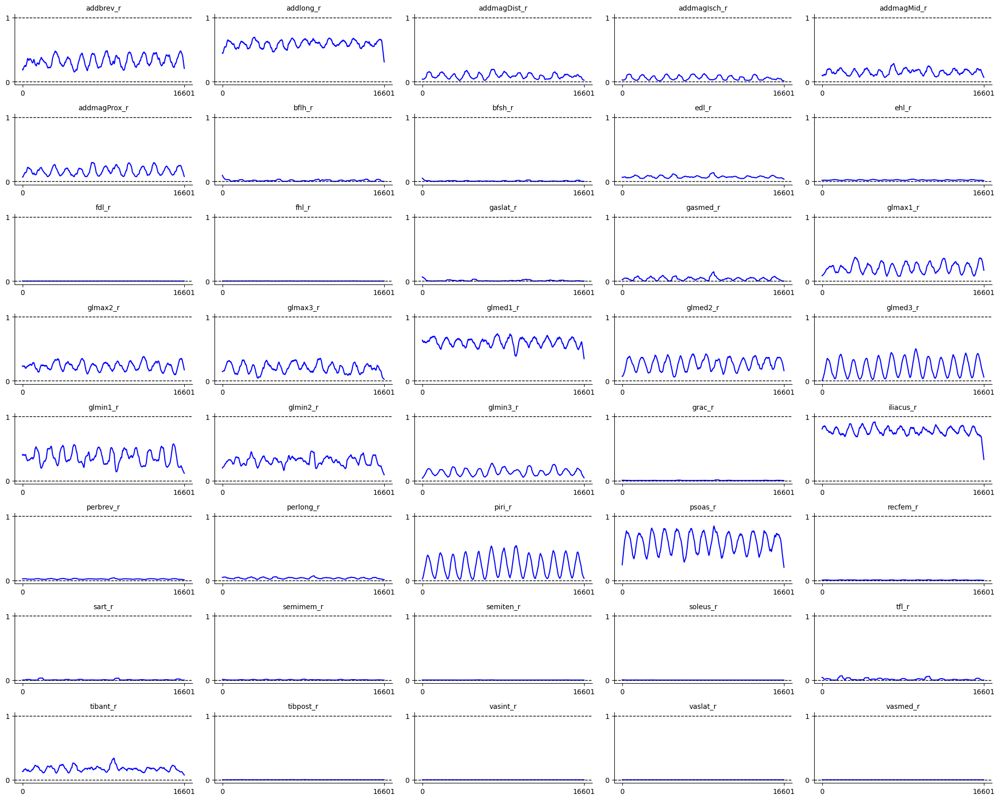

In [6]:
# Compute muscle activations for the full gait cycle
print("Compute muscle activations:")
activations = compute_activations(dataset_left, dataset_right)

# Plot muscle activations for the full gait cycle
print("Plot muscle activations:")
plot_activations(
    activations=activations,
    muscle_names=muscle_names,
    movement_description="Right Gait Cycle",
    output_folder="outputs_synergies"
)

In [126]:
from scipy.signal import find_peaks

def analyze_muscle_activations(muscle_name, activations, muscle_names, threshold=0.27, min_distance=1100):
    """
    Analyzes muscle activations for a given muscle, computes mean and std over repetitions, and plots the results.

    Parameters:
    - muscle_name (str): Name of the muscle to analyze.
    - activations (numpy.ndarray): Muscle activations (time_steps × muscles).
    - muscle_names (list): List of muscle names corresponding to the columns of activations.
    - threshold (float): Activation value must be below this threshold to identify repetitions.
    - min_distance (int): Minimum distance between repetitions (in time steps).
    """
    # Extract activation values for the specified muscle
    muscle_index = muscle_names.index(muscle_name)
    muscle_data = activations[:, muscle_index]

    # Compute min and max values
    min_value = np.min(muscle_data)
    max_value = np.max(muscle_data)

    # Identify repetition start points
    inverted_data = -muscle_data  # Invert the data to find minima as peaks
    peaks, _ = find_peaks(inverted_data, height=-threshold, distance=min_distance)

    # Plot the muscle activations with vertical lines at repetition start points
    plt.figure(figsize=(10, 5))
    plt.plot(muscle_data, label=muscle_name, color='blue')
    plt.axhline(y=min_value, color='red', linestyle='--', label='Min Activation')
    plt.axhline(y=max_value, color='green', linestyle='--', label='Max Activation')

    # Add vertical lines at identified repetition start points
    for peak in peaks:
        plt.axvline(x=peak, color='orange', linestyle='--', label='Repetition Start' if peak == peaks[0] else "")

    plt.xlabel("Time Steps")
    plt.ylabel("Activation")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Print the identified repetition start points
    print(f"Identified repetition start points (time steps): {peaks}")

    # Compute the minimum difference between start points
    differences = np.diff(peaks)
    min_difference = np.min(differences)
    print(f"Minimum difference between start points: {min_difference}")

    # Reshape the muscle data based on the minimum difference
    num_repetitions = len(peaks)
    reshaped_muscle_data = []

    for i in range(num_repetitions):
        start = peaks[i]
        end = start + min_difference

        # Check if the repetition has enough points
        if end <= len(muscle_data):  # Ensure we don't go out of bounds
            reshaped_muscle_data.append(muscle_data[start:end])
        else:
            print(f"Skipping repetition starting at {start} due to insufficient points.")

    # Convert the list to a numpy array
    reshaped_muscle_data = np.array(reshaped_muscle_data)

    # Print the shape of the reshaped array
    print(f"Shape of reshaped muscle data for {muscle_name}: {reshaped_muscle_data.shape}")

    # Compute mean and std over repetitions
    mean_activation = np.mean(reshaped_muscle_data, axis=0)  # Mean across repetitions
    std_activation = np.std(reshaped_muscle_data, axis=0)    # Std across repetitions

    # Plot the mean and std of activations over repetitions
    plt.figure(figsize=(10, 6))
    time_steps = np.arange(mean_activation.shape[0])  # Time steps for the x-axis

    # Plot the mean activation
    plt.plot(time_steps, mean_activation, color="blue", linewidth=2, label="Mean Activation")

    # Plot the shaded region for ±1 standard deviation
    plt.fill_between(
        time_steps,
        mean_activation - std_activation,
        mean_activation + std_activation,
        color="blue",
        alpha=0.3,
        label="±1 STD"
    )

    # Customize the plot
    plt.xlabel("% of the task", fontsize=25)  # Increased x-axis title size
    plt.ylabel("Activation (a.u.)", fontsize=25)  # Increased y-axis title size

    # Set x-axis ticks to only show the min and max time steps
    plt.xticks([time_steps[0], time_steps[-1]], ["0", "100"], fontsize=18)  # Increased tick size

    # Set y-axis ticks to only show the min and max activation values
    plt.yticks([np.min(mean_activation - std_activation), np.max(mean_activation + std_activation)],
               [f"{np.min(mean_activation - std_activation):.2f}", f"{np.max(mean_activation + std_activation):.2f}"],
               fontsize=18)  # Increased tick size

    # Remove grid
    plt.grid(False)

    # Remove top and right spines
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Tight layout for better spacing
    plt.tight_layout()

    # Show the plot
    plt.show()

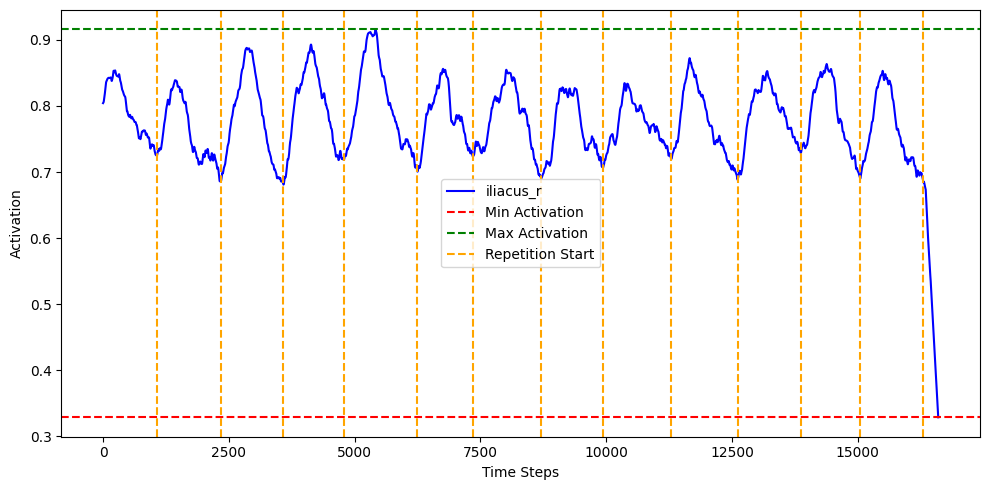

Identified repetition start points (time steps): [ 1070  2339  3586  4786  6250  7353  8707  9937 11298 12611 13868 15050
 16307]
Minimum difference between start points: 1103
Skipping repetition starting at 16307 due to insufficient points.
Shape of reshaped muscle data for iliacus_r: (12, 1103)


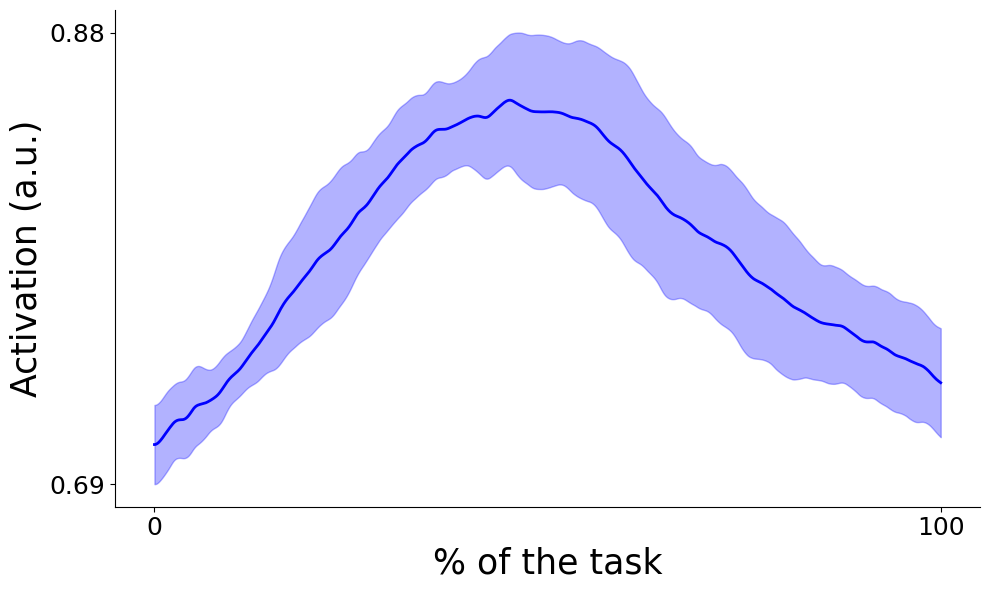

In [131]:
analyze_muscle_activations(
    muscle_name="iliacus_r",  # Replace with the desired muscle name
    activations=activations,
    muscle_names=muscle_names,
    threshold=0.75,
    min_distance=1100
)

In [9]:
def compute_synergies(activations, max_components=20, r2_threshold=0.8):
    """
    Computes muscle synergies using non-negative matrix factorization (NMF).

    Parameters:
    - activations (numpy.ndarray): Muscle activations (time_steps × muscles).
    - max_components (int): Maximum number of components to test.
    - r2_threshold (float): R² threshold to determine the optimal number of components.

    Returns:
    - W (numpy.ndarray): Synergy activations (time_steps × components).
    - H (numpy.ndarray): Activation coefficients (components × muscles).
    - optimal_components (int): Optimal number of components.
    - r2_values (list): R² values for each number of components.
    """

    r2_values = []
    optimal_components = None

    # Ensure activations are non-negative
    activations = np.maximum(activations, 0)

    # Normalize activations
    activations_normalized = activations / np.max(activations)

    for n_components in range(1, max_components + 1):
        nmf = NMF(n_components=n_components, init='random', random_state=1, max_iter=20000, l1_ratio=0.8)
        W = nmf.fit_transform(activations_normalized)
        H = nmf.components_

        # Reconstruct the activations
        reconstructed = np.dot(W, H)

        # Compute R²
        r2 = r2_score(activations_normalized, reconstructed)
        r2_values.append(r2)

        # Check if R² exceeds the threshold
        if r2 >= r2_threshold and optimal_components is None:
            optimal_components = n_components

    # If no optimal components found, use the maximum number of components
    if optimal_components is None:
        optimal_components = max_components

    # Compute the final NMF with the optimal number of components
    nmf_opt = NMF(n_components=optimal_components, init='random', random_state=1, max_iter=20000, l1_ratio=0.8)
    W = nmf_opt.fit_transform(activations_normalized)
    H = nmf_opt.components_

    print(f"Optimal number of components: {optimal_components}")
    return W, H, optimal_components, r2_values


import os
import numpy as np
import matplotlib.pyplot as plt

def synergies_info(W, H, r2_values, optimal_components, movement_description, task_description, output_folder="outputs"):
    """
    Visualizes muscle synergies (W and H) and R² values.

    Parameters:
    - W (numpy.ndarray): Synergy activations (time_steps × components).
    - H (numpy.ndarray): Activation coefficients (components × muscles).
    - r2_values (list): R² values for each number of components.
    - optimal_components (int): Optimal number of components.
    - movement_description (str): Description of the movement.
    - task_description (str): Description of the task.
    - output_folder (str): Folder to save the output plots.
    """
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    fig, axs = plt.subplots(1, 3, figsize=(24, 6))
    fig.suptitle(f"Muscle Synergies Information - {movement_description} ({task_description})", fontsize=28)

    # Calculate global max for y-axis across all synergies
    global_y_max_h = np.max(H)  # Max value for H plot
    global_y_max_w = np.max(W, axis=0).max()  # Max value for W plot (highest value across all curves over time)

    # Plot R² values
    axs[0].plot(range(1, len(r2_values) + 1), r2_values, marker='o')
    axs[0].axhline(y=0.8, color='r', linestyle='--', label='R² Threshold (0.8)')
    axs[0].set_xlabel("Number of Components", fontsize=18)
    axs[0].set_ylabel("R² Value", fontsize=18)
    axs[0].spines['top'].set_visible(False)
    axs[0].spines['right'].set_visible(False)
    axs[0].legend(fontsize=13, ncol=2, frameon=False)  # Bigger legend, no box

    # Customize ticks: Only min and max for x and y axes
    axs[0].set_xticks([1, len(r2_values)])
    axs[0].set_xticklabels([1, len(r2_values)], fontsize=14)
    axs[0].set_yticks([0, max(r2_values)])
    axs[0].set_yticklabels([f"{0:.1f}", f"{max(r2_values):.1f}"], fontsize=14)

    # Plot muscle synergies (W)
    for i in range(optimal_components):
        axs[1].plot(W[:, i], label=f"Synergy {i + 1}", alpha=1.0, linewidth=2.0)
    axs[1].set_xlabel("Time Steps", fontsize=18)
    axs[1].set_ylabel("Synergy Activation", fontsize=18)
    axs[1].legend(fontsize=13, ncol=1, loc="upper right", frameon=False)  # Bigger legend, no box
    axs[1].spines['top'].set_visible(False)
    axs[1].spines['right'].set_visible(False)
    axs[1].tick_params(axis='both', which='major', labelsize=14)

    # Customize ticks: Only min and max for x and y axes
    axs[1].set_xticks([0, W.shape[0] - 1])
    axs[1].set_xticklabels([0, W.shape[0] - 1], fontsize=14)
    axs[1].set_yticks([0, global_y_max_w])
    axs[1].set_yticklabels([f"{0:.1f}", f"{global_y_max_w:.1f}"], fontsize=14)

    # Plot activation coefficients (H)
    for i in range(optimal_components):
        axs[2].bar(range(1, H.shape[1] + 1), H[i, :], label=f"Synergy {i + 1}", alpha=1.0)  # Adjusted x-axis to start from 1
    axs[2].set_xlabel("Muscles", fontsize=18)
    axs[2].set_ylabel("Activation Coefficients", fontsize=18)
    axs[2].legend(fontsize=13, ncol=1, loc="upper right", frameon=False)  # Bigger legend, no box
    axs[2].spines['top'].set_visible(False)
    axs[2].spines['right'].set_visible(False)

    # Customize ticks: Only min and max for x and y axes
    axs[2].set_xticks([1, H.shape[1]])
    axs[2].set_xticklabels([1, H.shape[1]], fontsize=14)
    axs[2].set_yticks([0, global_y_max_h])
    axs[2].set_yticklabels([f"{0:.1f}", f"{global_y_max_h:.1f}"], fontsize=14)

    plt.tight_layout(rect=[0, 0.05, 1, 0.98])

    # Save the plot
    filename = os.path.join(output_folder, f"synergy_results_{movement_description.replace(' ', '_')}_{task_description.replace(' ', '_')}.png")
    plt.savefig(filename)
    print(f"Synergy results plot saved to {filename}")

    plt.show()
    plt.close()

In [10]:
# Compute synergies for the entire dataset
print("Compute synergies:")
W, H, optimal_components, r2_values = compute_synergies(activations, max_components=20, r2_threshold=0.8)
print(f"Shape of W: {W.shape}, Shape of H: {H.shape}")
print(f"Optimal number of components: {optimal_components}")

Compute synergies:
Optimal number of components: 20
Shape of W: (16602, 20), Shape of H: (20, 80)
Optimal number of components: 20


Synergy results plot saved to outputs_synergies/synergy_results_Gait_Cycle_Walking.png


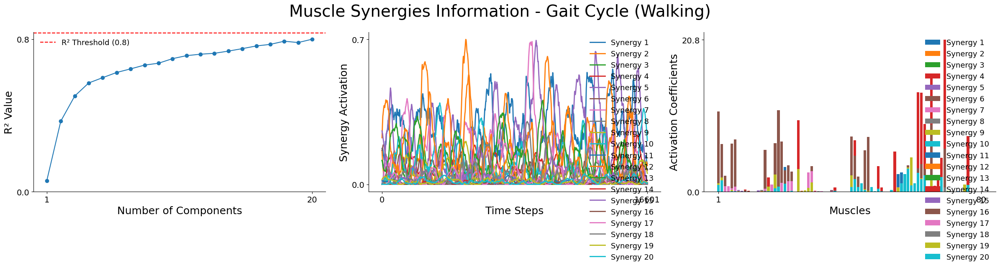

In [11]:
# Plot synergies information
synergies_info(
    W=W,
    H=H,
    r2_values=r2_values,
    optimal_components=optimal_components,
    movement_description="Gait Cycle",
    task_description="Walking",
    output_folder="outputs_synergies"
)

Trimmed Heel Strike Samples: [ 139  269  399  522  646  770  896 1022 1143 1269 1392 1519 1644]
Minimum repetition length: 121

Shape of segmented W: (121, 20, 12)

Shape of W_mean: (121, 20), Shape of W_std: (121, 20)


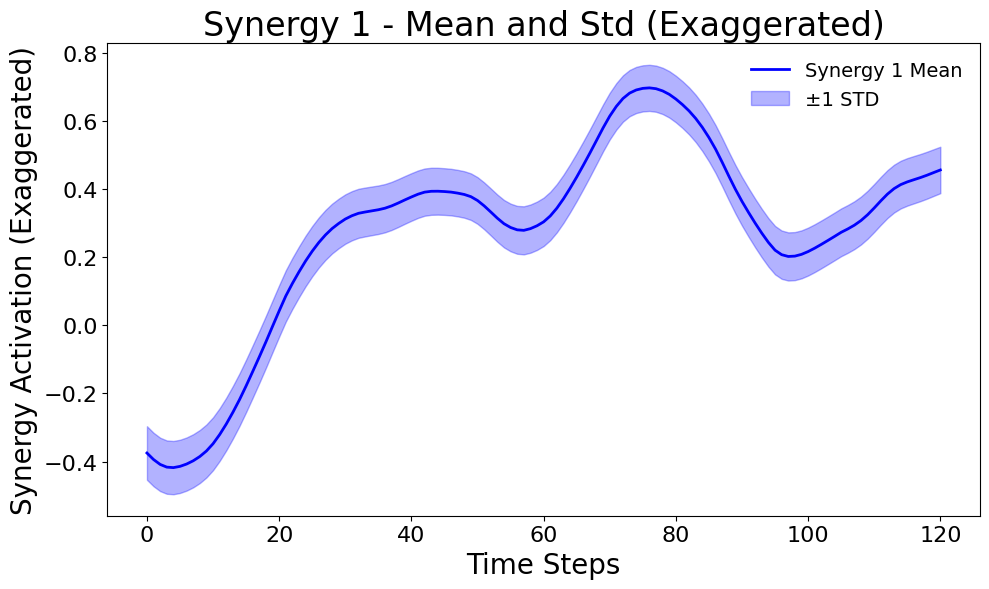

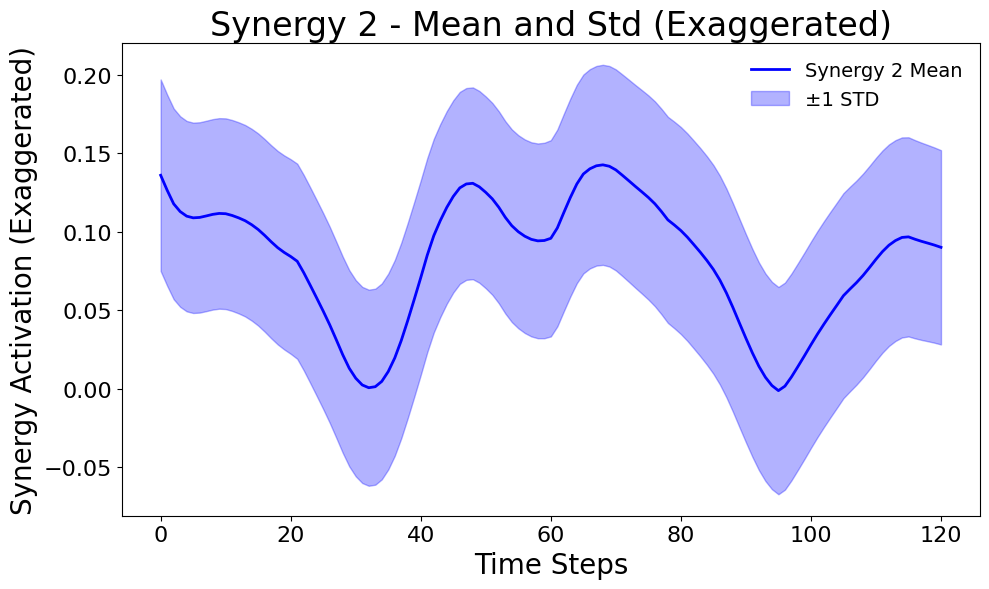

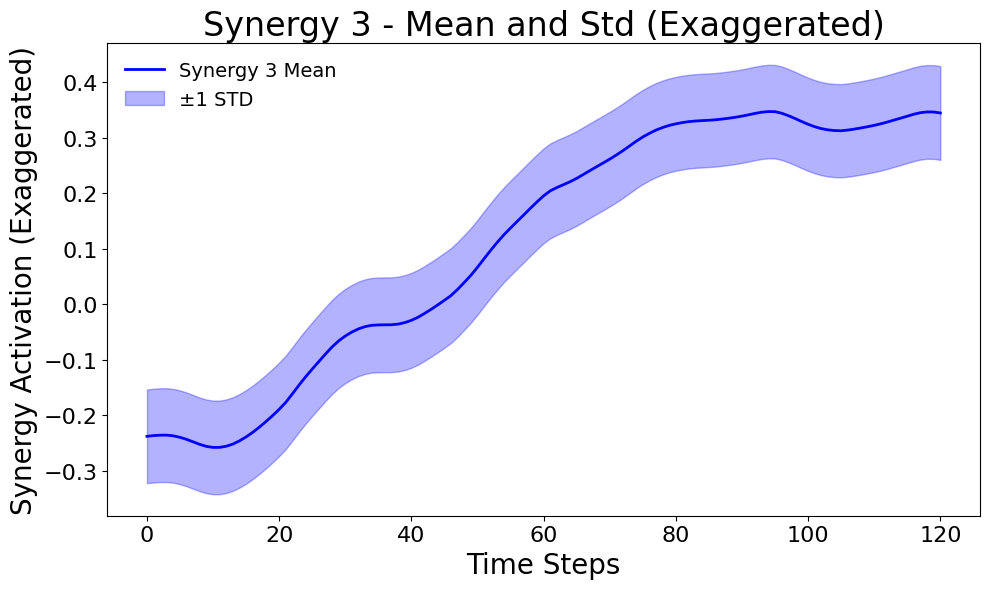

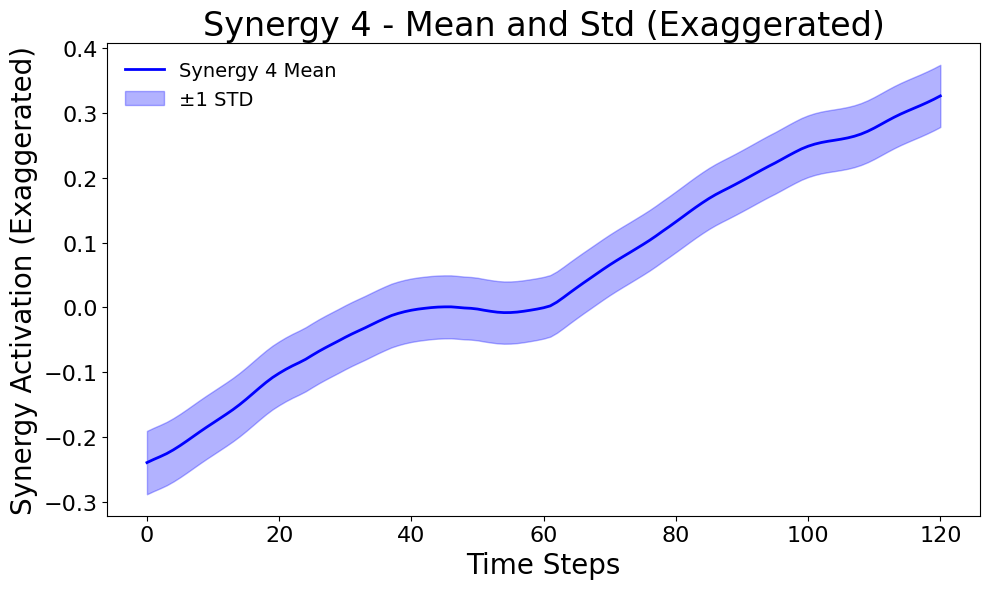

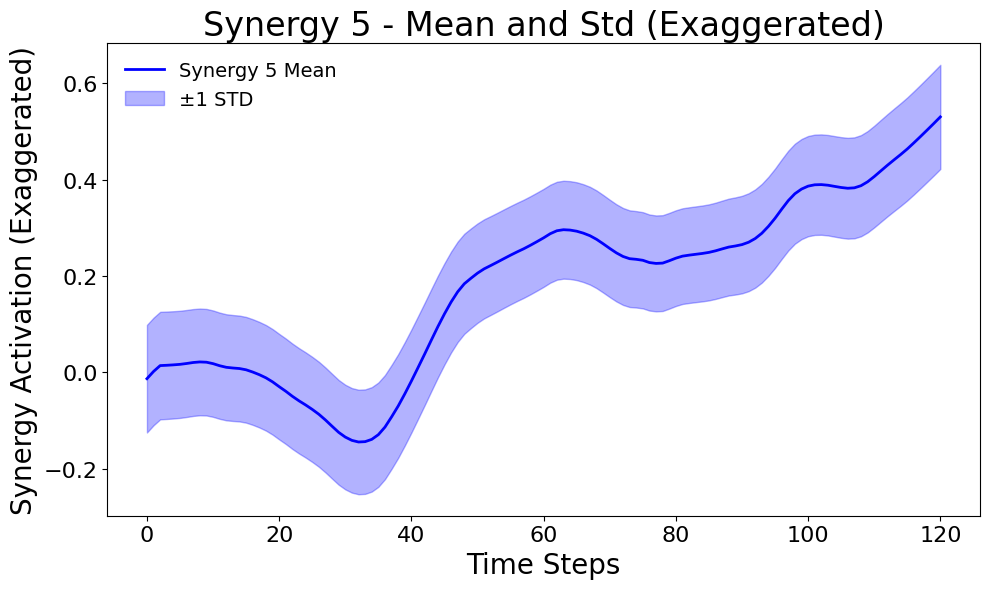

...

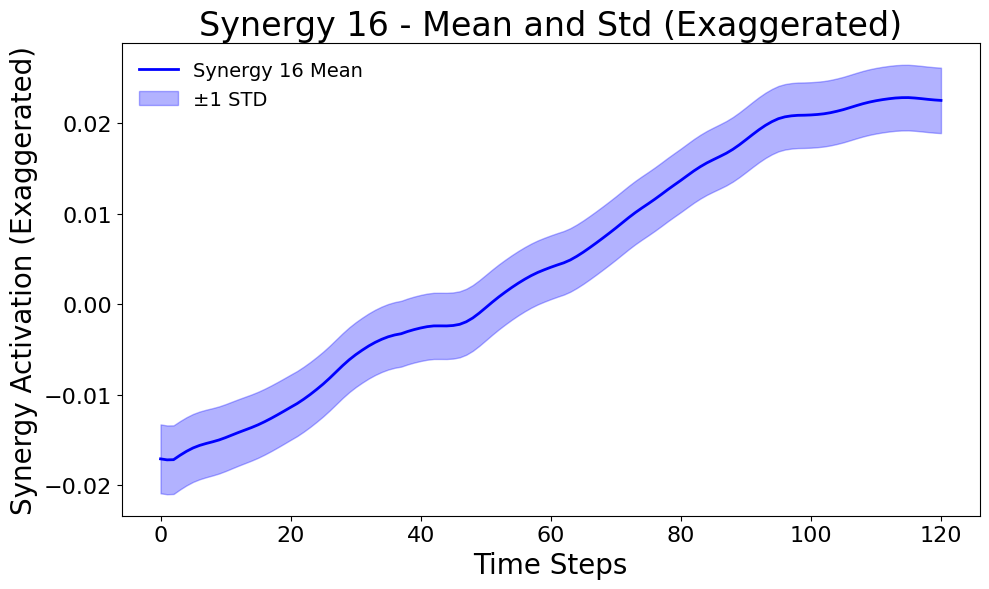

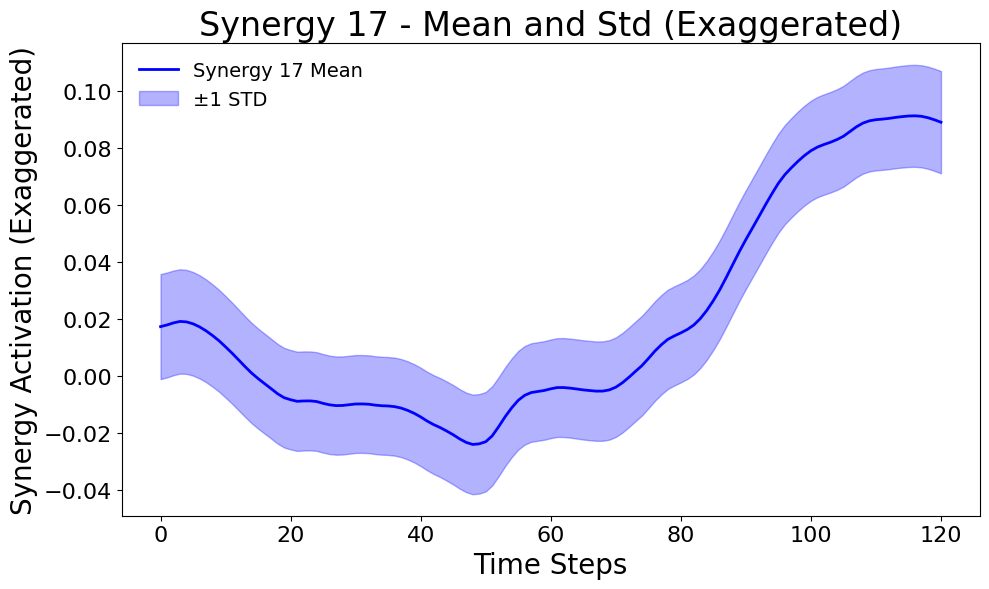

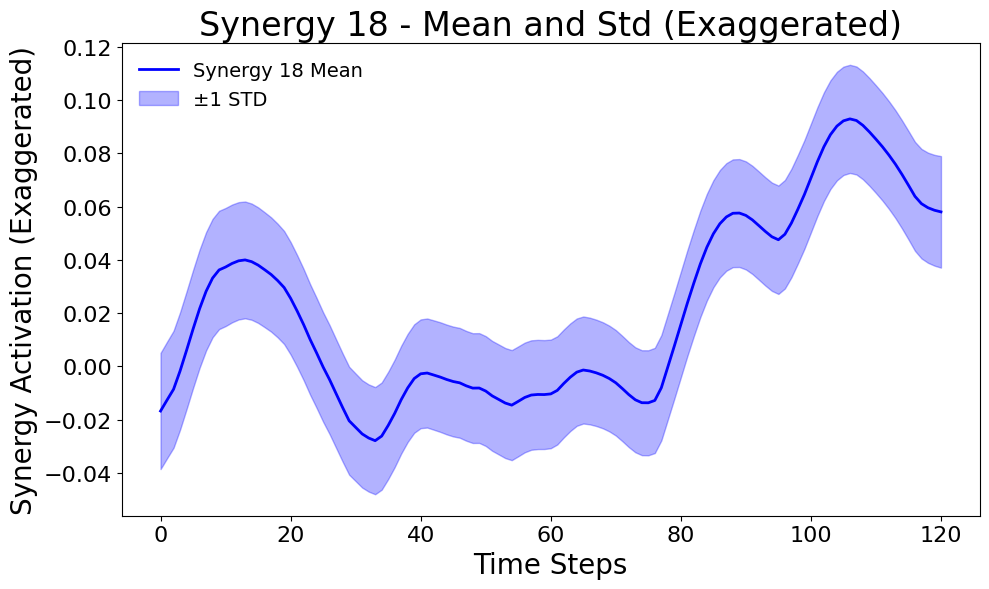

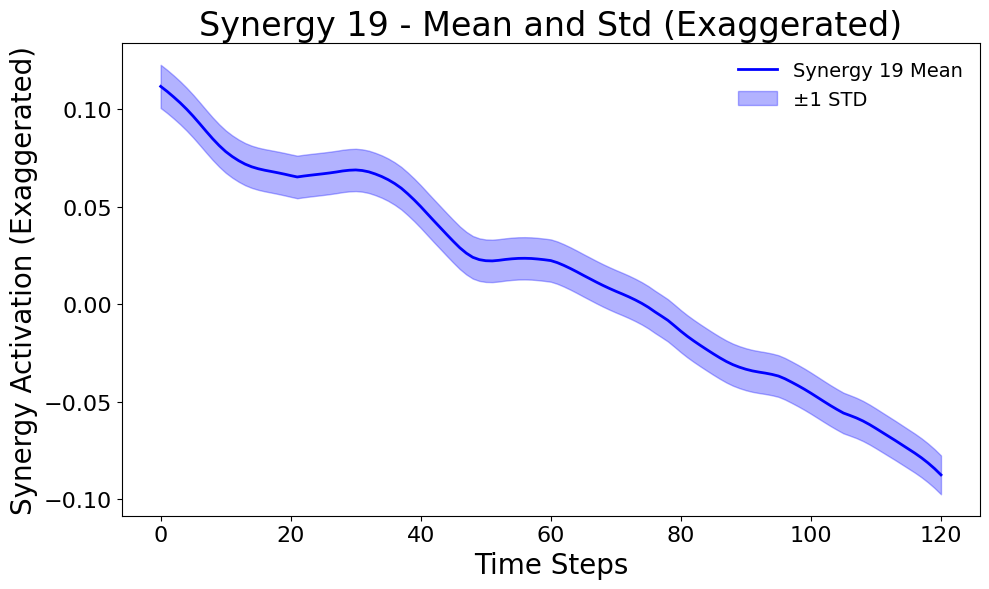

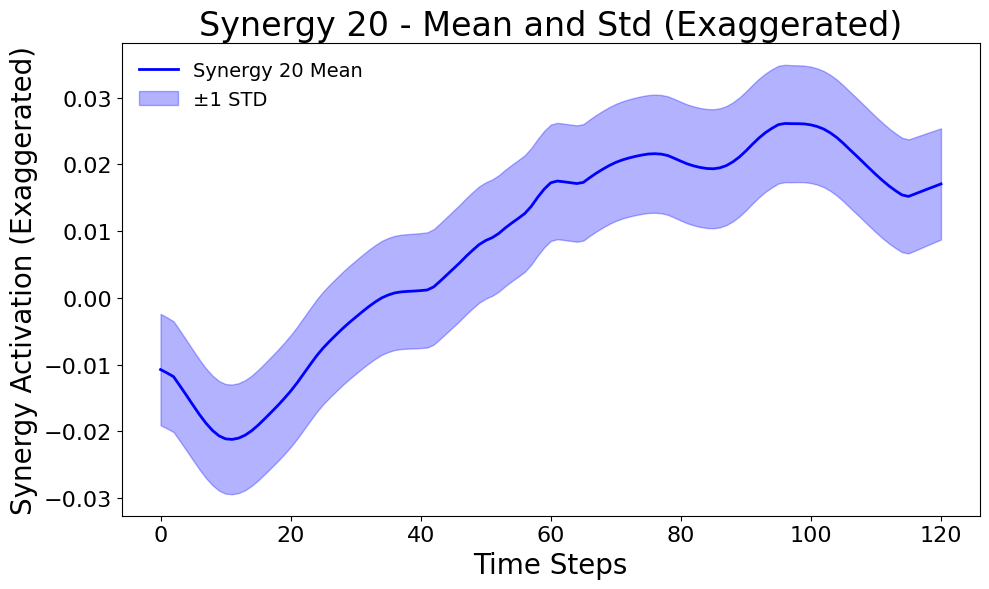

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the heel strike samples from the Excel file
excel_file = "H14_LUSB_MW_A2-segmentation_info.xlsx"
segmentation_data = pd.read_excel(excel_file)
heel_strike_samples = segmentation_data["Heel strike right"].dropna().astype(int).values

# Trim heel strike samples to match the dataset range
start = 320
end = 1980
heel_strike_samples = heel_strike_samples[(heel_strike_samples >= start) & (heel_strike_samples <= end)] - start
print(f"Trimmed Heel Strike Samples: {heel_strike_samples}")

# Compute the minimum repetition length
repetition_lengths = np.diff(heel_strike_samples)
min_length = np.min(repetition_lengths)
print(f"Minimum repetition length: {min_length}")

# Segment W into repetitions
num_repetitions = len(heel_strike_samples) - 1
segmented_W = []

for i in range(num_repetitions):
    start = heel_strike_samples[i]
    end = start + min_length
    segmented_W.append(W[start:end, :])  # Truncate to the minimum length

# Convert to a 3D array (time_steps × components × repetitions)
segmented_W = np.stack(segmented_W, axis=-1)
print(f"\nShape of segmented W: {segmented_W.shape}")

# Compute mean and std for each W component
W_mean = np.mean(segmented_W, axis=-1)  # Mean across repetitions
W_std = np.std(segmented_W, axis=-1)    # Std across repetitions

# Exaggerate variations in W_mean
W_mean_exaggerated = (W_mean - np.mean(W_mean, axis=0)) * 100 + np.mean(W_mean, axis=0)
W_std_exaggerated = W_std * 1  # Amplify the standard deviation as well

print(f"\nShape of W_mean: {W_mean.shape}, Shape of W_std: {W_std.shape}")

# Plot the mean and std of each W component
time_steps = np.arange(W_mean.shape[0])  # Time steps for the x-axis

for component in range(W_mean.shape[1]):
    plt.figure(figsize=(10, 6))
    plt.plot(time_steps, W_mean_exaggerated[:, component], color="blue", linewidth=2, label=f"Synergy {component + 1} Mean")
    plt.fill_between(
        time_steps,
        W_mean_exaggerated[:, component] - W_std_exaggerated[:, component],
        W_mean_exaggerated[:, component] + W_std_exaggerated[:, component],
        color="blue",
        alpha=0.3,
        label="±1 STD"
    )
    plt.xlabel("Time Steps", fontsize=20)
    plt.ylabel("Synergy Activation (Exaggerated)", fontsize=20)
    plt.title(f"Synergy {component + 1} - Mean and Std (Exaggerated)", fontsize=24)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.legend(fontsize=14, frameon=False)
    plt.tight_layout()
    plt.show()

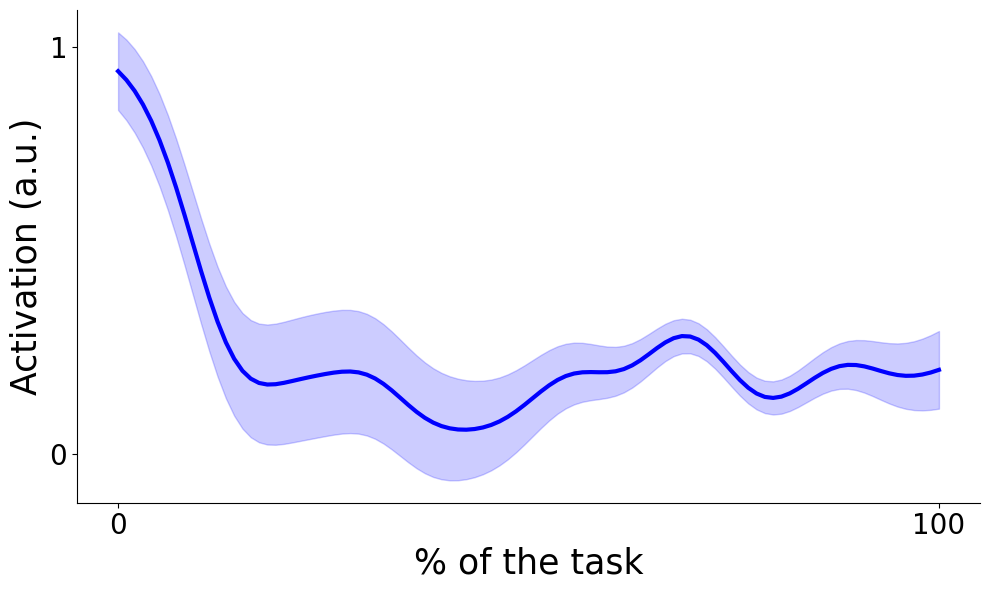

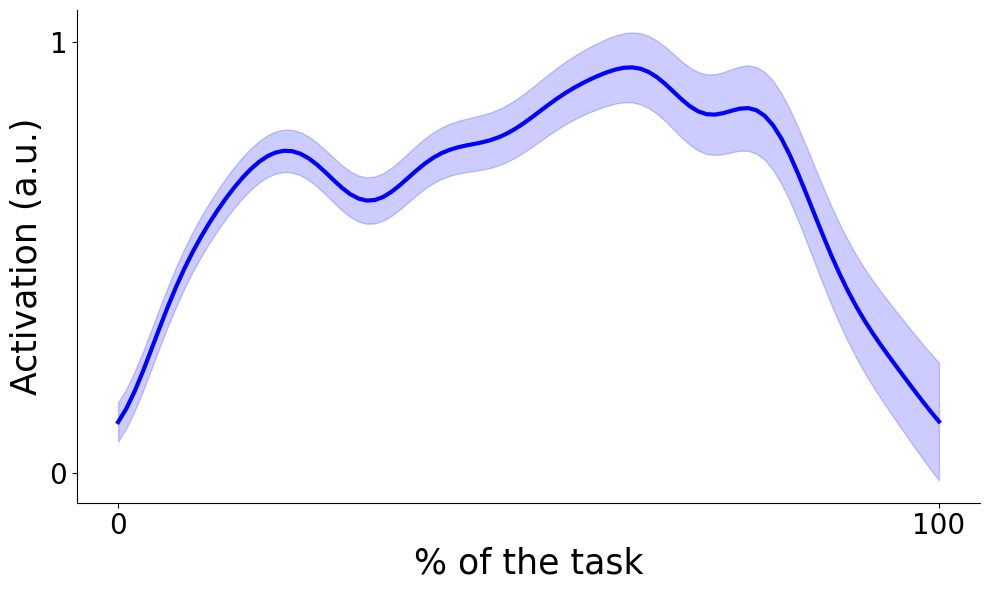

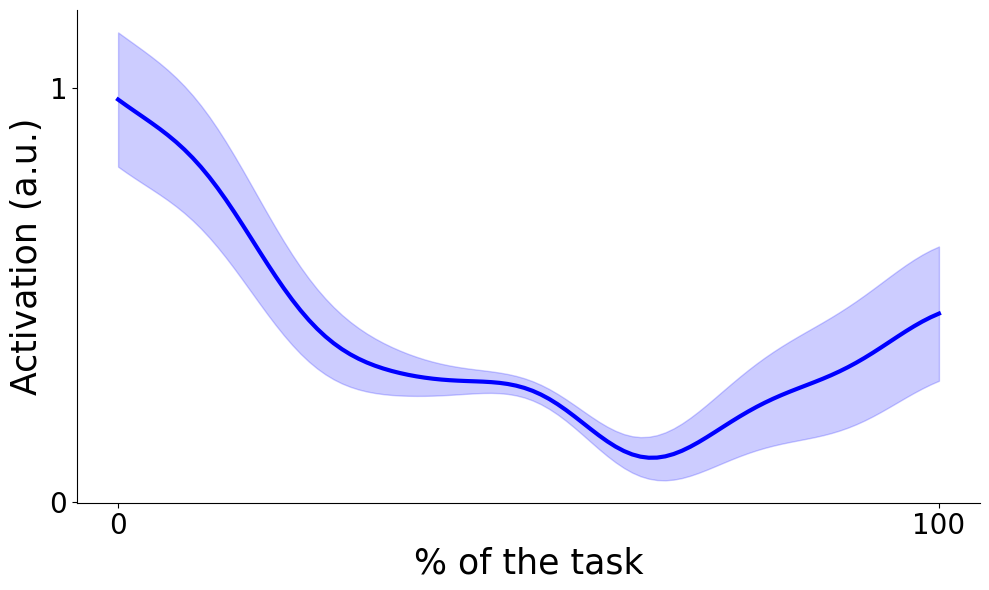

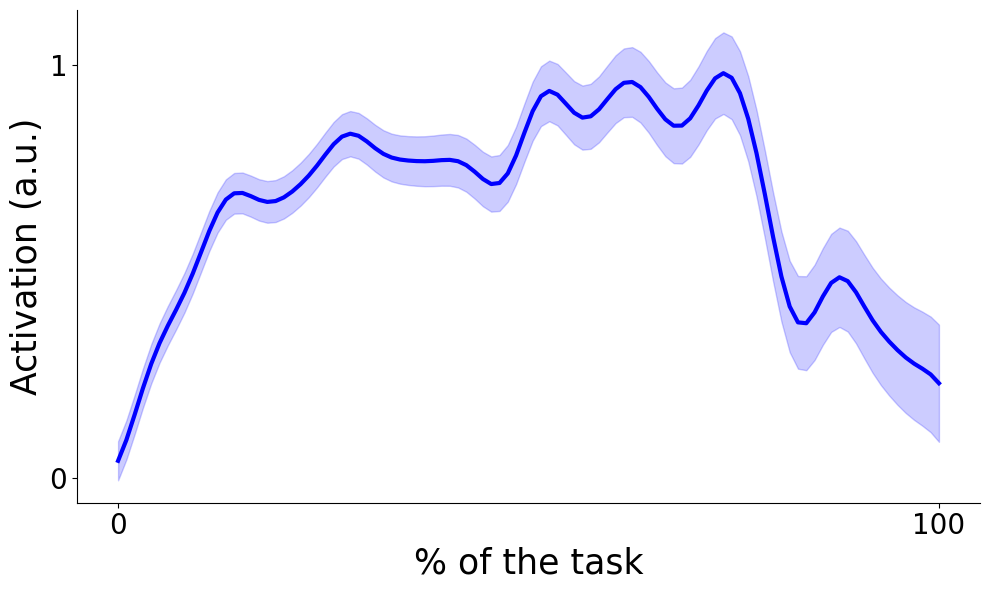

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

# Generate time steps
time_steps = np.linspace(0, 1, 100)  # Normalized gait cycle (0 to 1)

# Define a function to scale values to the range [0.05, 0.95]
def scale_to_range(values, min_val=0.05, max_val=0.95):
    scaled_values = (values - np.min(values)) / (np.max(values) - np.min(values))  # Normalize to [0, 1]
    scaled_values = scaled_values * (max_val - min_val) + min_val  # Scale to [min_val, max_val]
    return scaled_values

# Define base synergy activation patterns using polynomials
synergy_1_base = 1 - 4 * time_steps + 3 * time_steps**2  # Activated at the beginning
synergy_2_base = -4 * (time_steps - 0.5)**2 + 1         # Activated in the middle
synergy_3_base = 3 * time_steps**2 - 4 * time_steps + 1 # Activated at the end
synergy_4_base = -16 * (time_steps - 0.5)**2 + 4  # Stronger activation in the middle

# Scale the base patterns to ensure min > 0.05 and max < 0.95
synergy_1_base = scale_to_range(synergy_1_base, min_val=0.05, max_val=0.95)
synergy_2_base = scale_to_range(synergy_2_base, min_val=0.05, max_val=0.95)
synergy_3_base = scale_to_range(synergy_3_base, min_val=0.05, max_val=0.95)

# Add smooth noise to the base patterns
np.random.seed(42)  # For reproducibility
noise_1 = gaussian_filter1d(np.random.normal(0, 1, size=time_steps.shape), sigma=5)
noise_2 = gaussian_filter1d(np.random.normal(0, 1, size=time_steps.shape), sigma=5)
noise_3 = gaussian_filter1d(np.random.normal(0, 1, size=time_steps.shape), sigma=8)
noise_4 = gaussian_filter1d(np.random.normal(0, 2, size=time_steps.shape), sigma=3)

synergy_1 = synergy_1_base + noise_1
synergy_2 = synergy_2_base + noise_2
synergy_3 = synergy_3_base + noise_3
synergy_4 = synergy_4_base + noise_4

# Define different time-dependent std multipliers for each synergy
std_multiplier_1 = 0.5 + 0.3 * np.sin(2 * np.pi * time_steps)  # Varies between 0.5 and 1.0
std_multiplier_2 = 0.2 + 0.4 * (time_steps**2)   
std_multiplier_3 = 0.4 + 0.3 * np.cos(2 * np.pi * time_steps)  # Varies between 0.3 and 1.0  
std_multiplier_4 = 0.3 + 0.2 * np.sin(2 * np.pi * time_steps)  # Varies between 0.3 and 0.8

# Recompute the standard deviations after normalization
std_1 = std_multiplier_1 * np.std(synergy_1)
std_2 = std_multiplier_2 * np.std(synergy_2)
std_3 = std_multiplier_3 * np.std(synergy_3)
std_4 = std_multiplier_2 * np.std(synergy_4)

# Plot Synergy 1
plt.figure(figsize=(10, 6))
plt.plot(time_steps, synergy_1, label="Synergy 1: Early Stance (Hip Extensors, Plantarflexors)", linewidth=3, color="blue")
plt.fill_between(time_steps, synergy_1 - std_1, synergy_1 + std_1, color="blue", alpha=0.2, label="±1 STD")
plt.xlabel("% of the task", fontsize=25)
plt.ylabel("Activation (a.u.)", fontsize=25)
plt.gca().set_xticks([0, 1])  # Set x-ticks at 0 and 1
plt.gca().set_xticklabels(["0", "100"], fontsize=20)  # Scale x-ticks by 100
plt.gca().set_yticks([np.min(synergy_1) - 0.1, np.max(synergy_1) + 0.1])  # Set y-ticks at the min and max of the curve
plt.gca().set_yticklabels(["0", "1"], fontsize=20)  # Label them as 0 and 1
plt.gca().spines['top'].set_visible(False)  # Remove the top spine
plt.gca().spines['right'].set_visible(False)  
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot Synergy 2
plt.figure(figsize=(10, 6))
plt.plot(time_steps, synergy_2, label="Synergy 2: Swing Phase (Hip Flexors, Dorsiflexors)", linewidth=3, color="blue")
plt.fill_between(time_steps, synergy_2 - std_2, synergy_2 + std_2, color="blue", alpha=0.2, label="±1 STD")
plt.xlabel("% of the task", fontsize=25)
plt.ylabel("Activation (a.u.)", fontsize=25)
plt.gca().set_xticks([0, 1])  # Set x-ticks at 0 and 1
plt.gca().set_xticklabels(["0", "100"], fontsize=20)  # Scale x-ticks by 100
plt.gca().set_yticks([np.min(synergy_2) - 0.2, np.max(synergy_2) + 0.1])  # Set y-ticks at the min and max of the curve
plt.gca().set_yticklabels(["0", "1"], fontsize=20)  # Label them as 0 and 1
plt.gca().spines['top'].set_visible(False)  # Remove the top spine
plt.gca().spines['right'].set_visible(False)  
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot Synergy 3
plt.figure(figsize=(10, 6))
plt.plot(time_steps, synergy_3, label="Synergy 3: Late Swing (Hamstrings, Quadriceps)", linewidth=3, color="blue")
plt.fill_between(time_steps, synergy_3 - std_3, synergy_3 + std_3, color="blue", alpha=0.2, label="±1 STD")
plt.xlabel("% of the task", fontsize=25)
plt.ylabel("Activation (a.u.)", fontsize=25)
plt.gca().set_xticks([0, 1])  # Set x-ticks at 0 and 1
plt.gca().set_xticklabels(["0", "100"], fontsize=20)  # Scale x-ticks by 100
plt.gca().set_yticks([np.min(synergy_3) - 0.2, np.max(synergy_3) + 0.05])  # Set y-ticks at the min and max of the curve
plt.gca().set_yticklabels(["0", "1"], fontsize=20)  # Label them as 0 and 1
plt.gca().spines['top'].set_visible(False)  # Remove the top spine
plt.gca().spines['right'].set_visible(False)  
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot Synergy 4
plt.figure(figsize=(10, 6))
plt.plot(time_steps, synergy_4, label="Synergy 4: Stronger Middle Activation", linewidth=3, color="blue")
plt.fill_between(time_steps, synergy_4 - std_4, synergy_4 + std_4, color="blue", alpha=0.2, label="±1 STD")
plt.xlabel("% of the task", fontsize=25)
plt.ylabel("Activation (a.u.)", fontsize=25)
plt.gca().set_xticks([0, 1])  # Set x-ticks at 0 and 1
plt.gca().set_xticklabels(["0", "100"], fontsize=20)  # Scale x-ticks by 100
plt.gca().set_yticks([np.min(synergy_4) - 0.2, np.max(synergy_4) + 0.1])  # Set y-ticks at the min and max of the curve
plt.gca().set_yticklabels(["0", "1"], fontsize=20)  # Label them as 0 and 1
plt.gca().spines['top'].set_visible(False)  # Remove the top spine
plt.gca().spines['right'].set_visible(False)  
plt.grid(False)
plt.tight_layout()
plt.show()

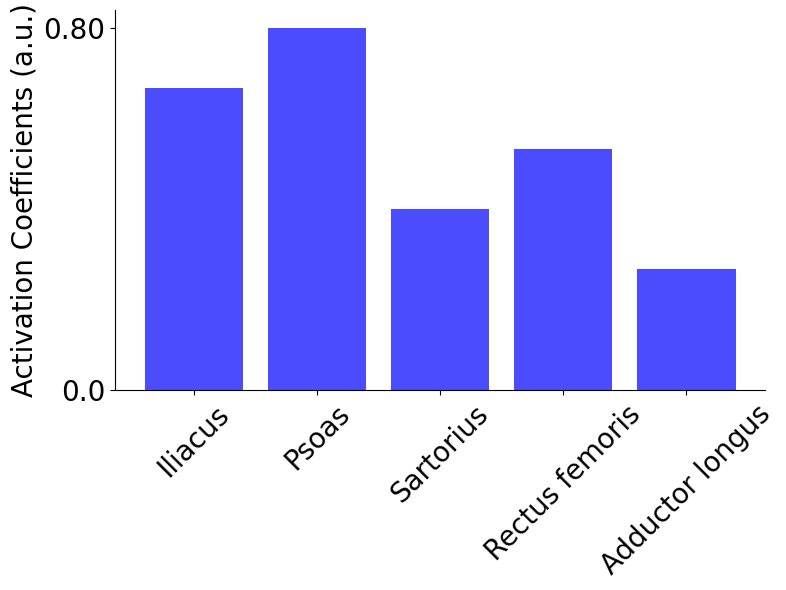

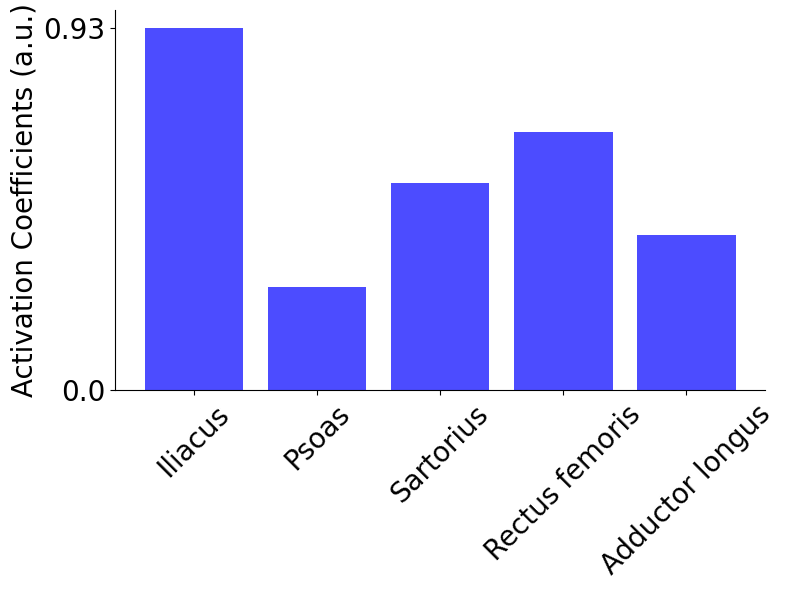

In [121]:
import matplotlib.pyplot as plt

# Data for the plots
plot_1_values = [0.25 * 2.67, 0.30 * 2.67, 0.15 * 2.67, 0.20 * 2.67, 0.10 * 2.67]
plot_2_values = [0.35 * 2.67, 0.10 * 2.67, 0.20 * 2.67, 0.25 * 2.67, 0.15 * 2.67]
muscle_names = ["Iliacus", "Psoas", "Sartorius", "Rectus femoris", "Adductor longus"]

# Plot 1
plt.figure(figsize=(8, 6))
plt.bar(muscle_names, plot_1_values, color="blue", alpha=0.7)
plt.ylabel("Activation Coefficients (a.u.)", fontsize=20)

# Set y-axis ticks to only show the min and max values
plt.yticks([0, max(plot_1_values)], 
           [f"0.0", f"{max(plot_1_values):.2f}"], fontsize=20)

# Set x-ticks with increased font size and diagonal rotation
plt.xticks(fontsize=20, rotation=45)

# Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# Plot 2
plt.figure(figsize=(8, 6))
plt.bar(muscle_names, plot_2_values, color="blue", alpha=0.7)
plt.ylabel("Activation Coefficients (a.u.)", fontsize=20)

# Set y-axis ticks to only show the min and max values
plt.yticks([0, max(plot_2_values)], 
           [f"0.0", f"{max(plot_2_values):.2f}"], fontsize=20)

# Set x-ticks with increased font size and diagonal rotation
plt.xticks(fontsize=20, rotation=45)

# Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

___

Compute activations:
Working on /Users/Matthieu/Desktop/PROJECT I/FDandID_myosuite/results/movement...


100%|██████████| 17102/17102 [00:29<00:00, 570.61it/s]



Compute synergies:
Optimal number of components: 20

Segment W:

Compute mean and std:

Synergies information:
Muscle activations plot saved to outputs_synergies/muscle_activations_Right_Gait_Cycle_Before.png


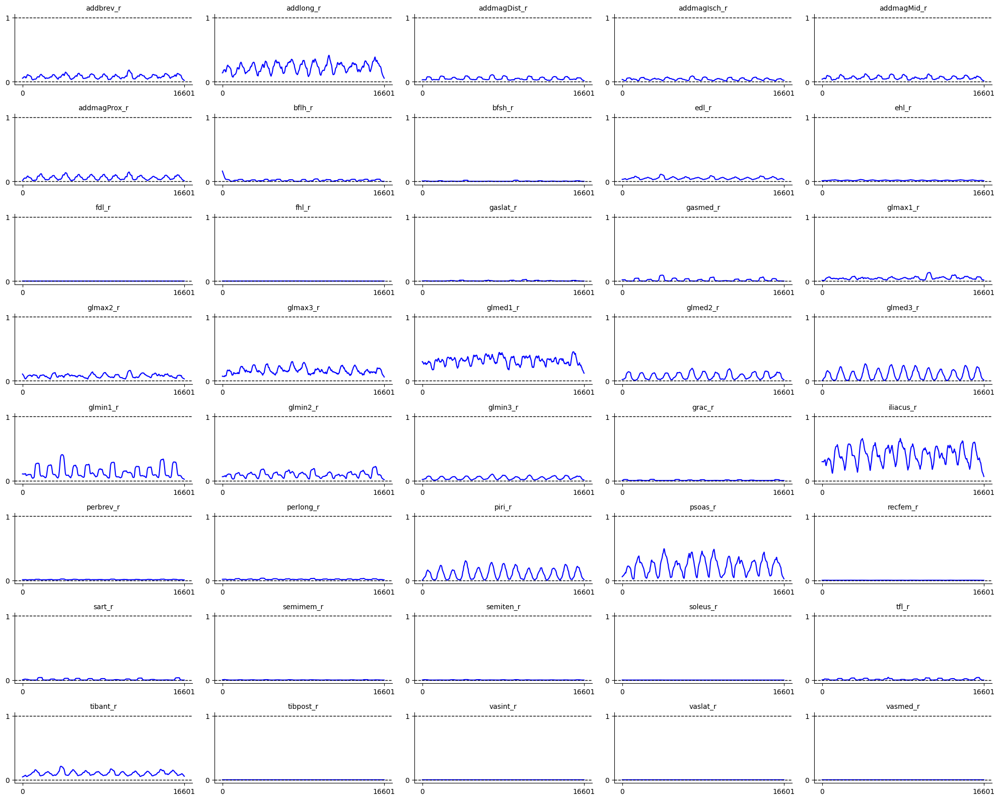

All synergies (W) plot saved to outputs_synergies/all_synergies_W_Right_Gait_Cycle.png


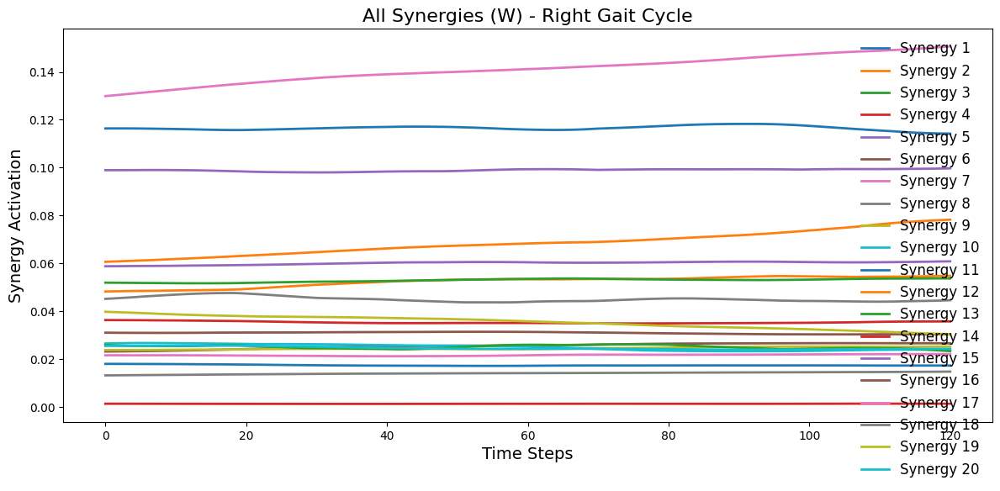

All activation coefficients (H) plot saved to outputs_synergies/all_activation_coefficients_H_Right_Gait_Cycle.png


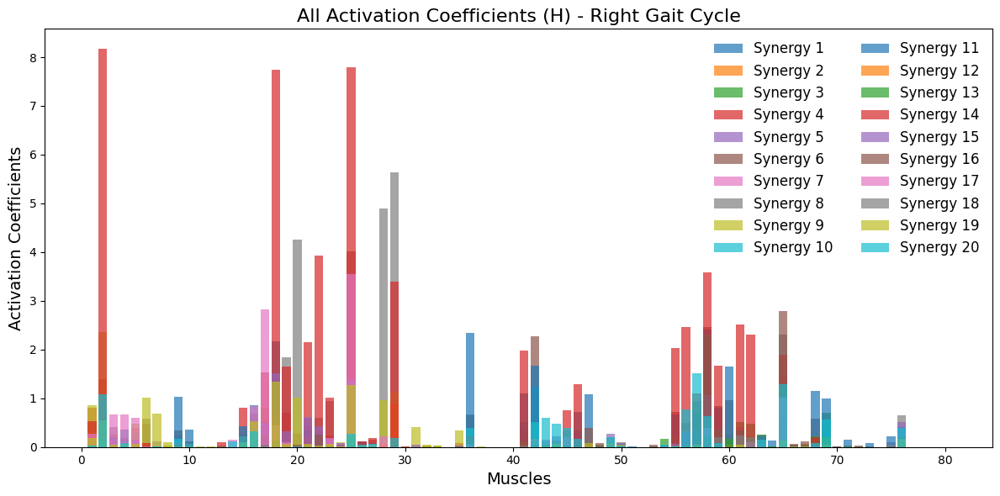

Synergy 1 plot saved to outputs_synergies/synergy_1_activation_Right_Gait_Cycle_Before.png


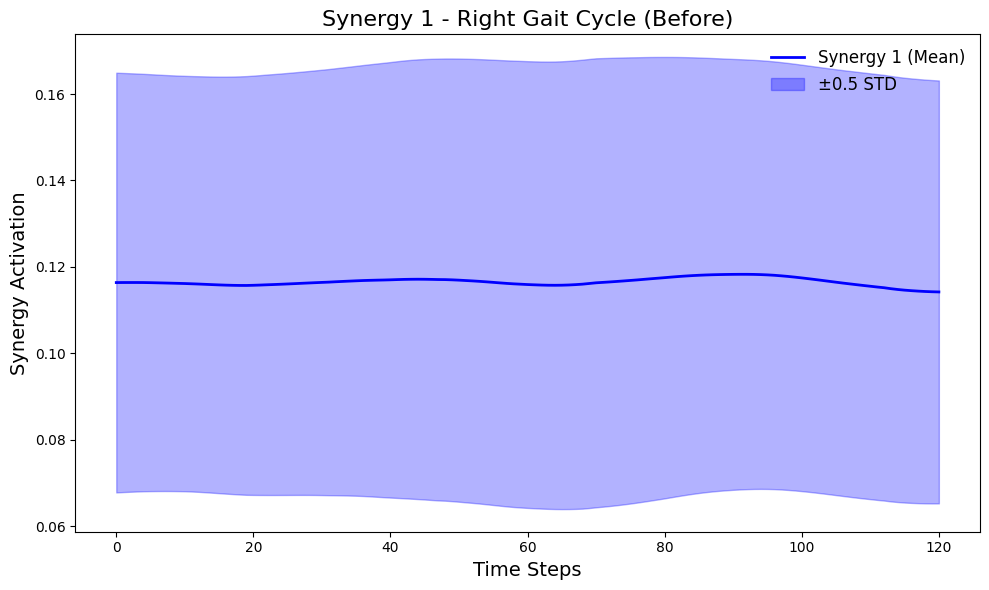

Synergy 2 plot saved to outputs_synergies/synergy_2_activation_Right_Gait_Cycle_Before.png


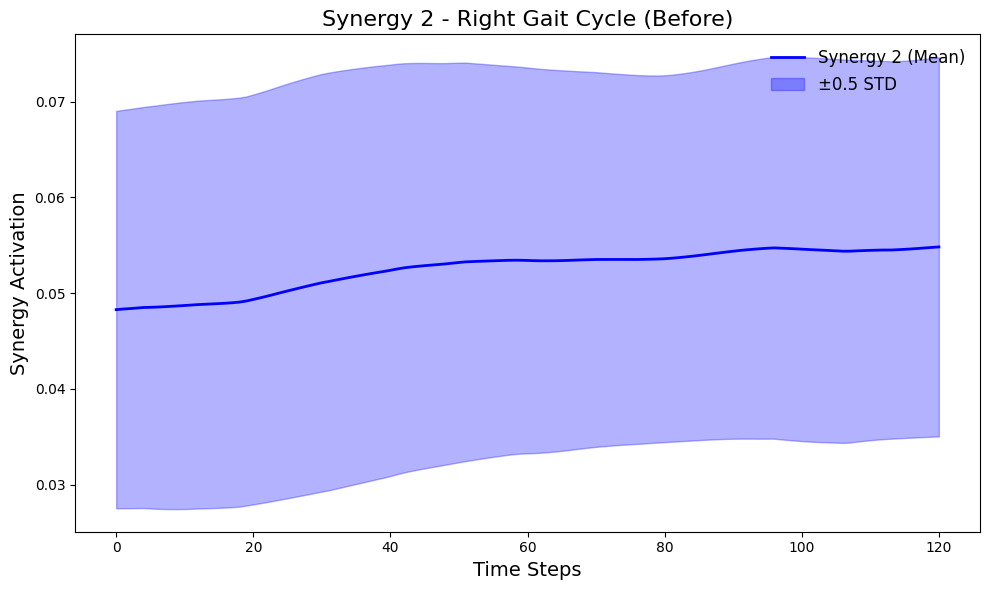

Synergy 3 plot saved to outputs_synergies/synergy_3_activation_Right_Gait_Cycle_Before.png


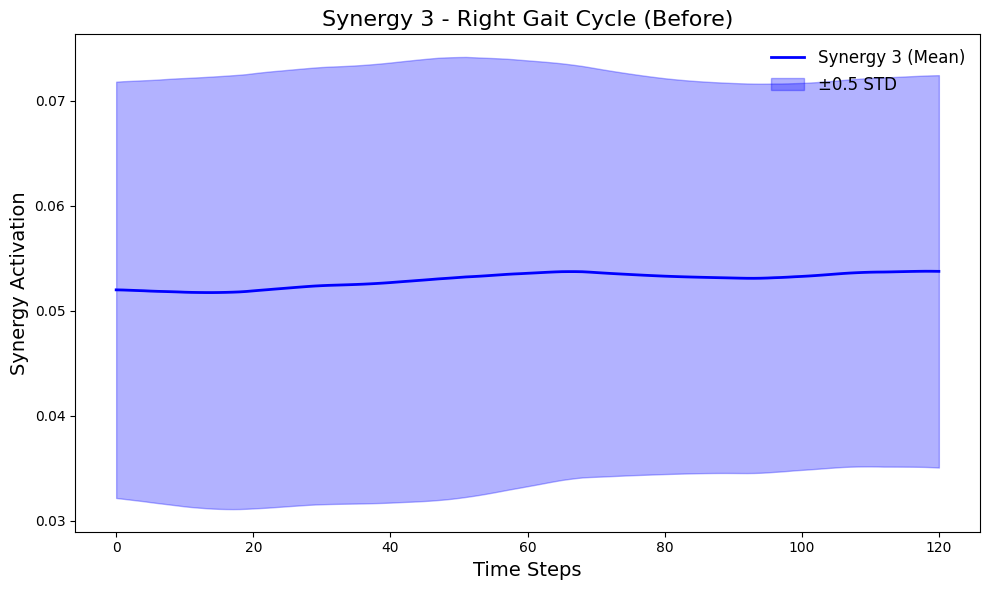

Synergy 4 plot saved to outputs_synergies/synergy_4_activation_Right_Gait_Cycle_Before.png


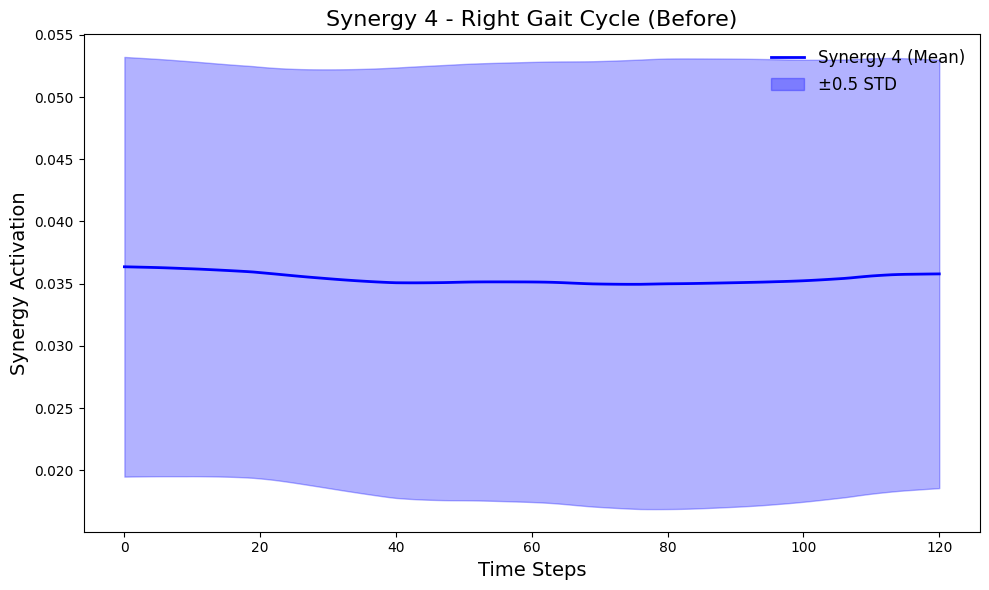

Synergy 5 plot saved to outputs_synergies/synergy_5_activation_Right_Gait_Cycle_Before.png


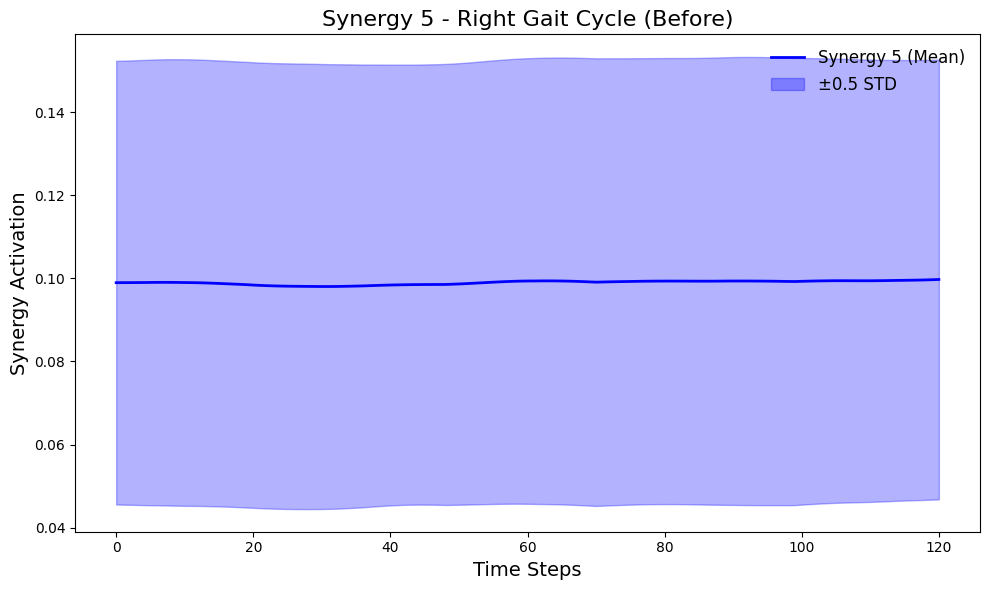

Synergy 6 plot saved to outputs_synergies/synergy_6_activation_Right_Gait_Cycle_Before.png


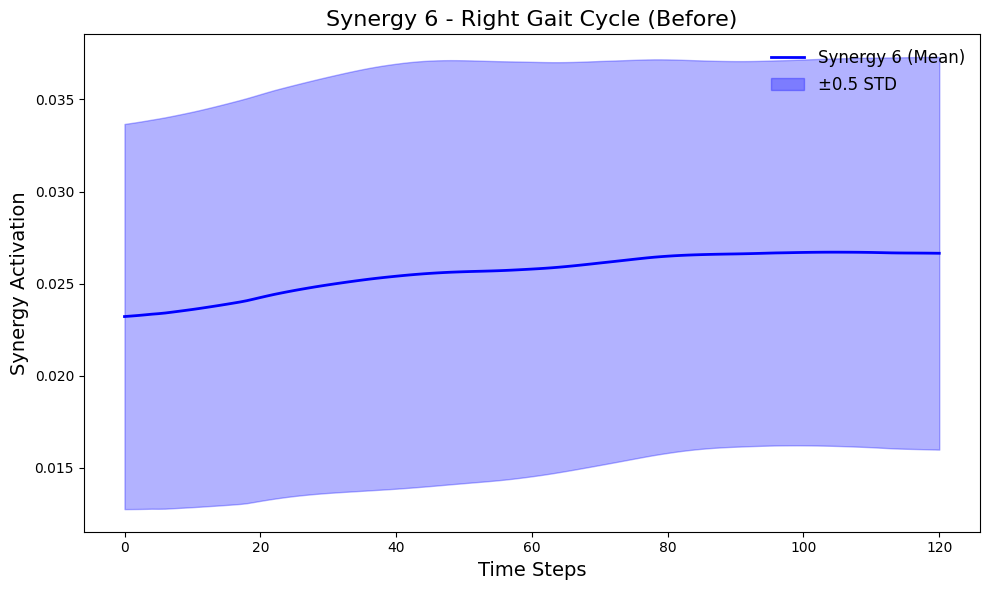

Synergy 7 plot saved to outputs_synergies/synergy_7_activation_Right_Gait_Cycle_Before.png


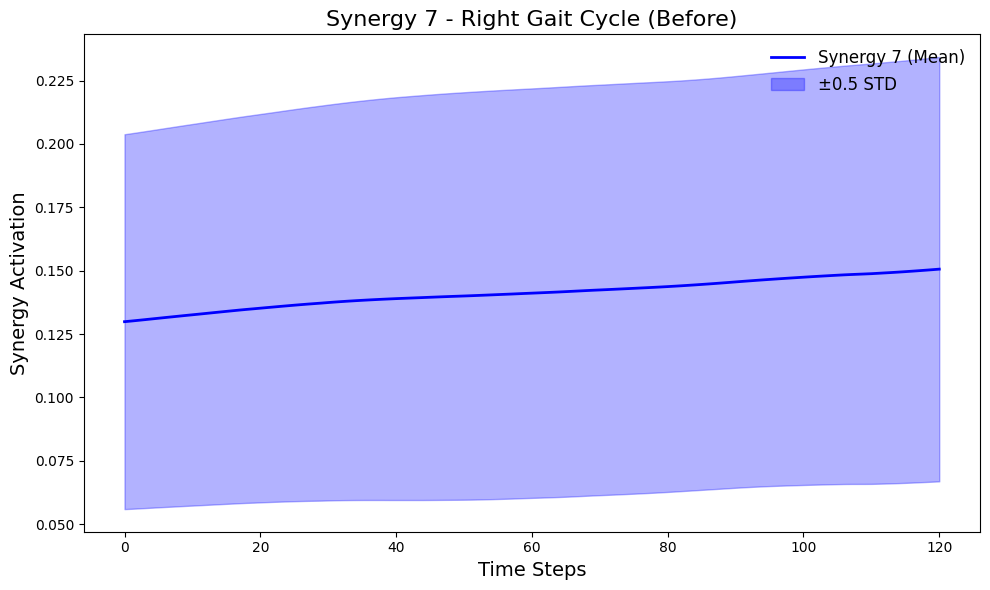

Synergy 8 plot saved to outputs_synergies/synergy_8_activation_Right_Gait_Cycle_Before.png


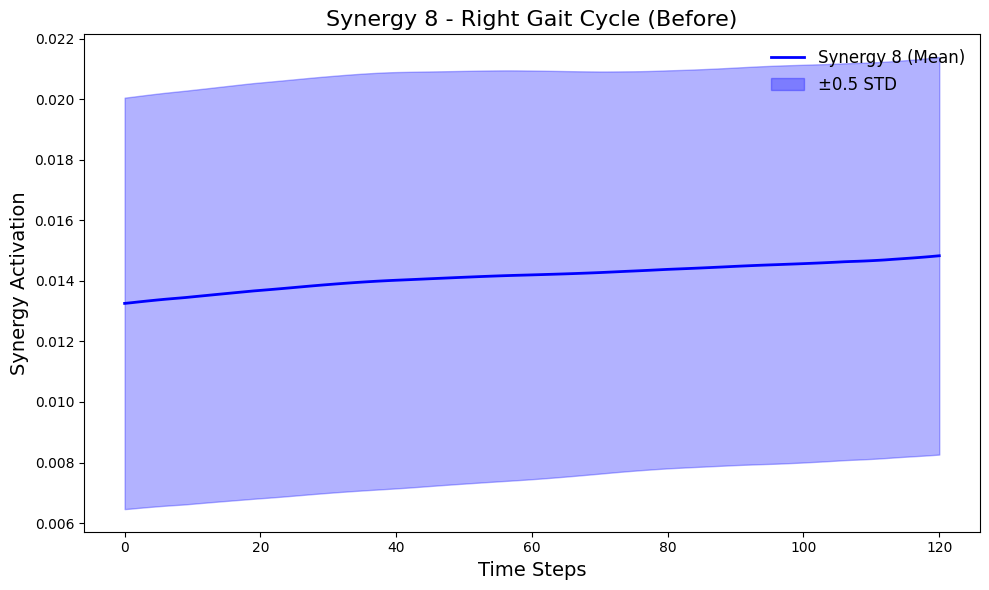

Synergy 9 plot saved to outputs_synergies/synergy_9_activation_Right_Gait_Cycle_Before.png


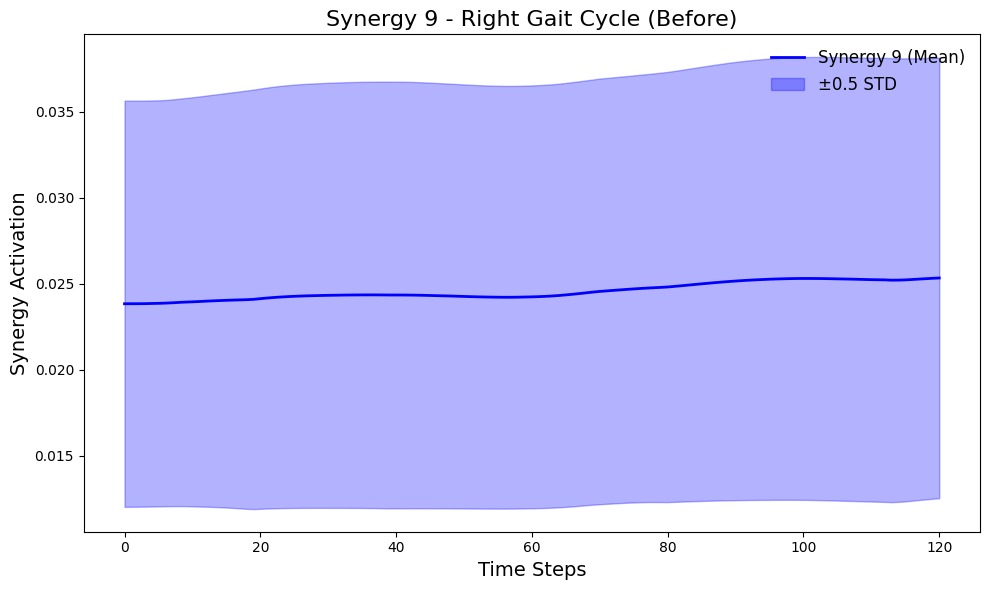

Synergy 10 plot saved to outputs_synergies/synergy_10_activation_Right_Gait_Cycle_Before.png


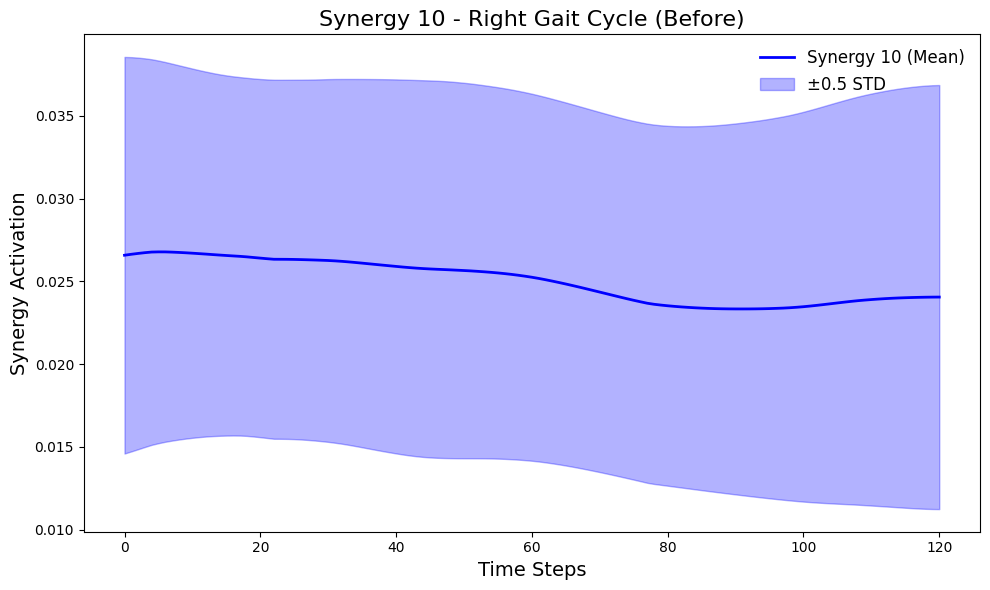

Synergy 11 plot saved to outputs_synergies/synergy_11_activation_Right_Gait_Cycle_Before.png


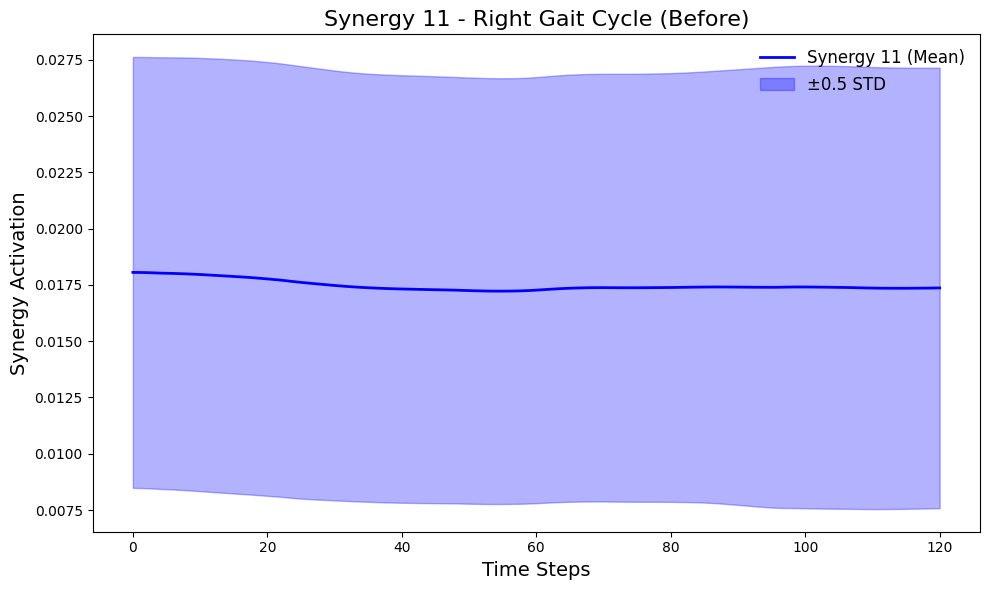

Synergy 12 plot saved to outputs_synergies/synergy_12_activation_Right_Gait_Cycle_Before.png


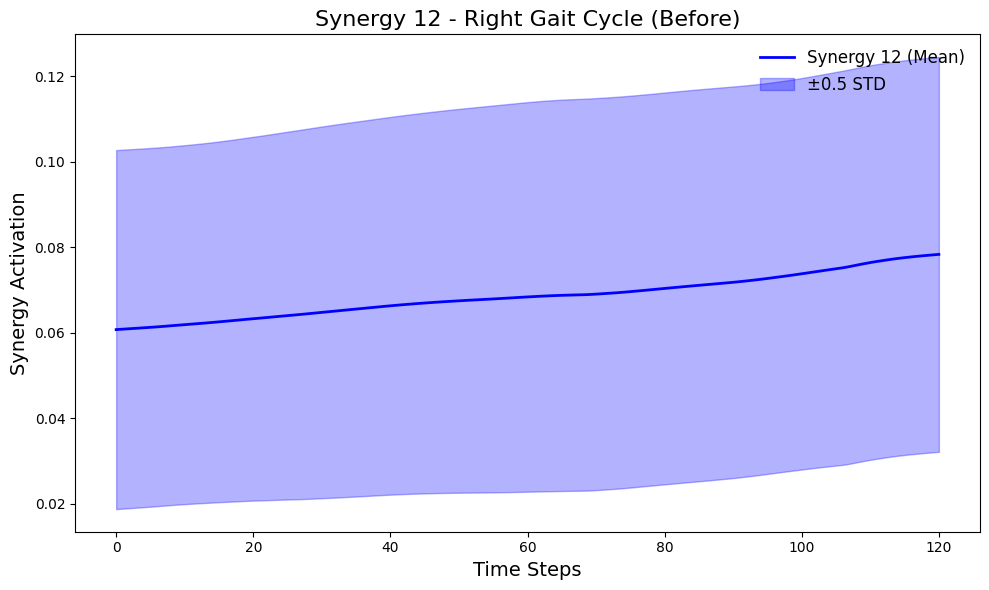

Synergy 13 plot saved to outputs_synergies/synergy_13_activation_Right_Gait_Cycle_Before.png


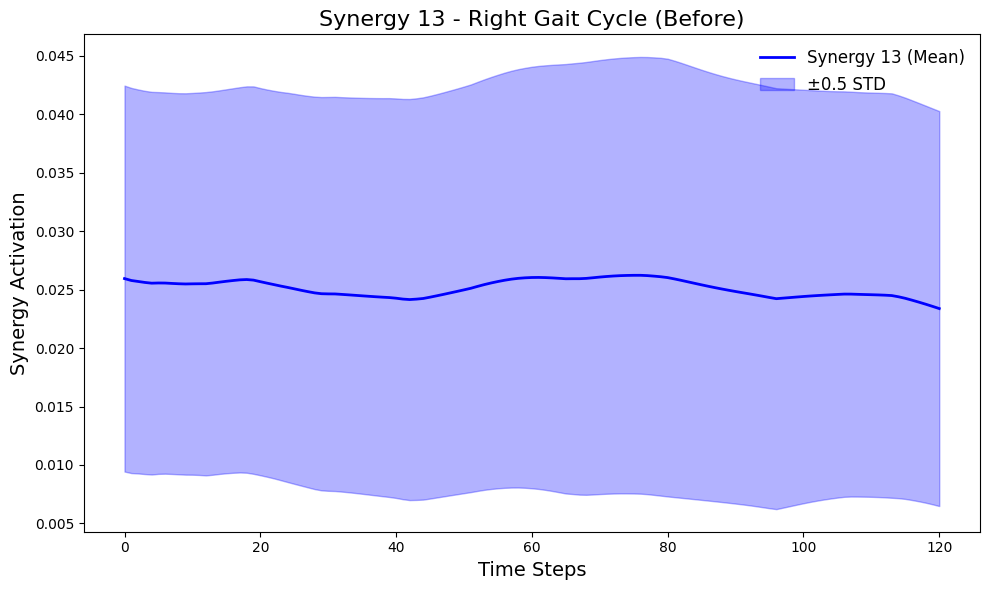

Synergy 14 plot saved to outputs_synergies/synergy_14_activation_Right_Gait_Cycle_Before.png


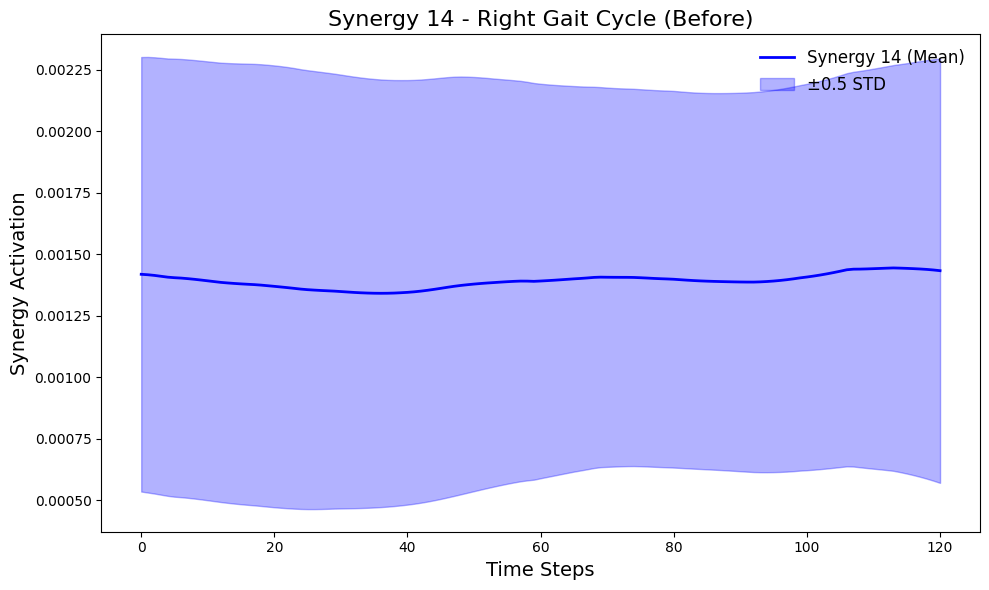

Synergy 15 plot saved to outputs_synergies/synergy_15_activation_Right_Gait_Cycle_Before.png


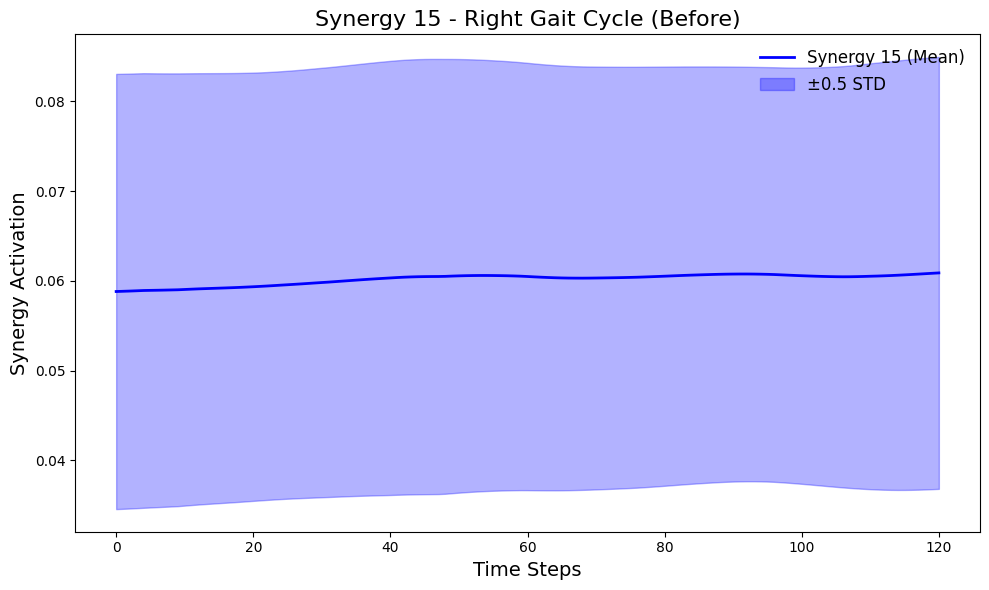

Synergy 16 plot saved to outputs_synergies/synergy_16_activation_Right_Gait_Cycle_Before.png


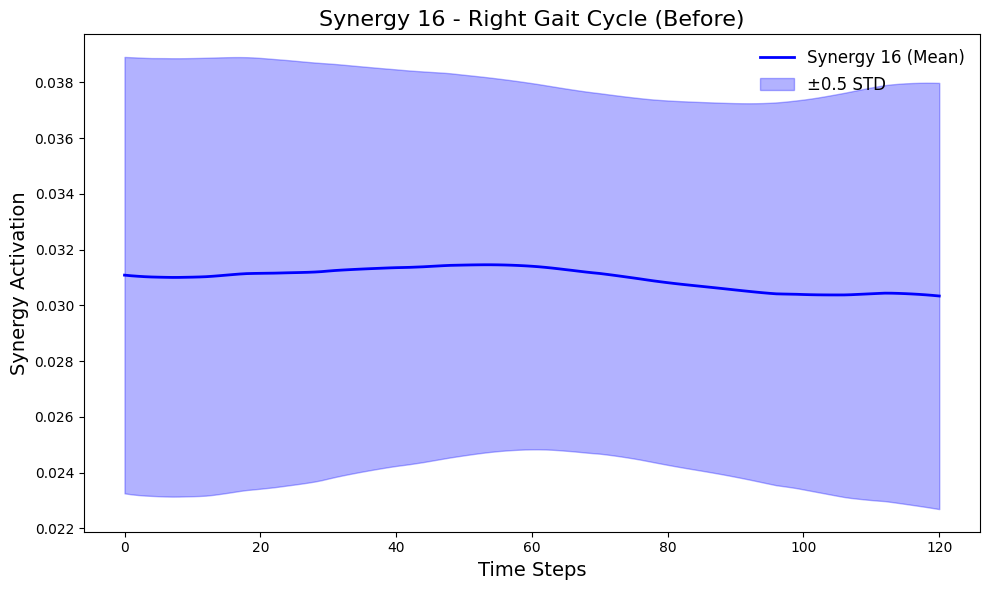

Synergy 17 plot saved to outputs_synergies/synergy_17_activation_Right_Gait_Cycle_Before.png


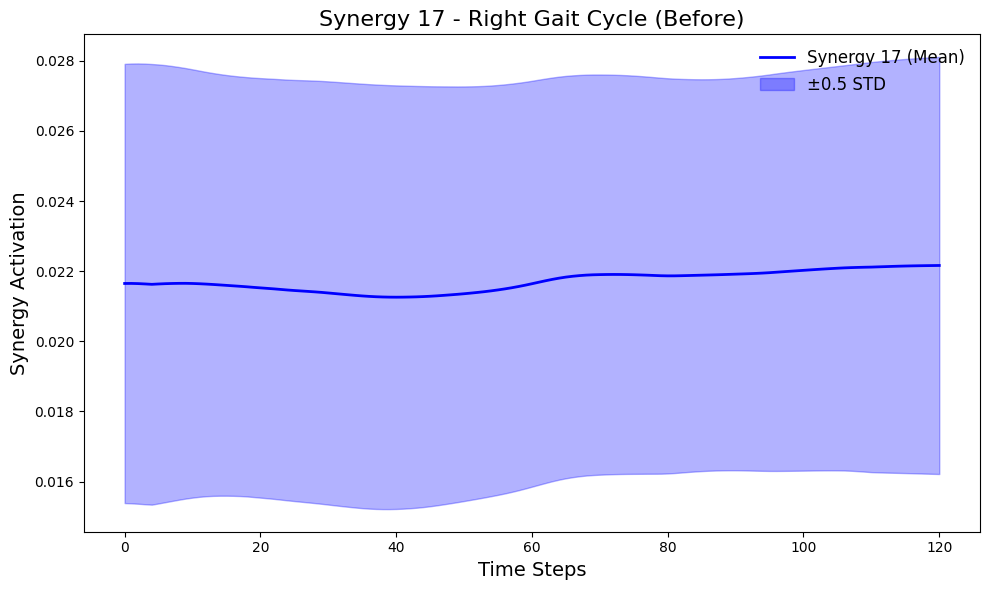

Synergy 18 plot saved to outputs_synergies/synergy_18_activation_Right_Gait_Cycle_Before.png


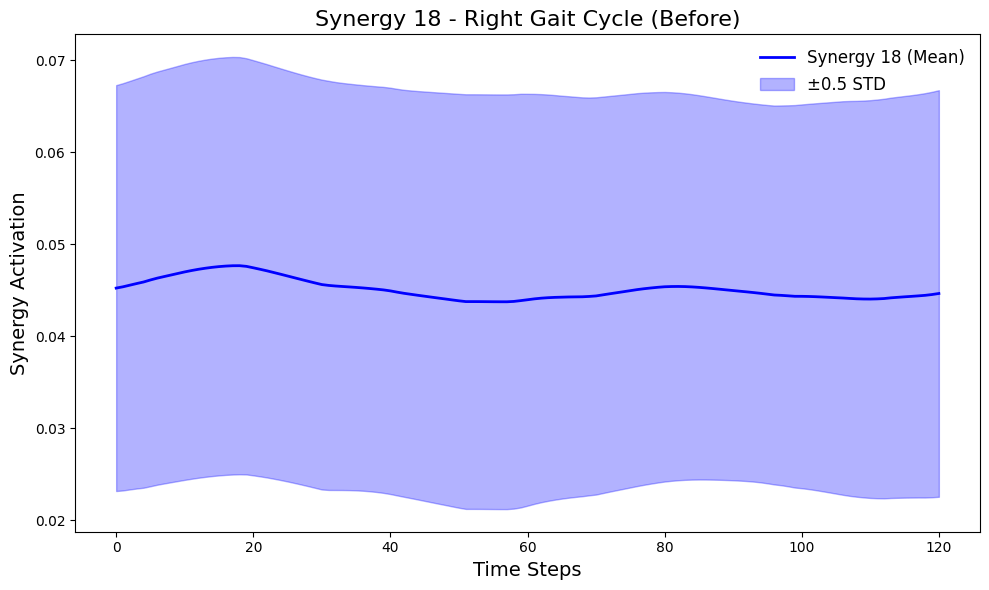

Synergy 19 plot saved to outputs_synergies/synergy_19_activation_Right_Gait_Cycle_Before.png


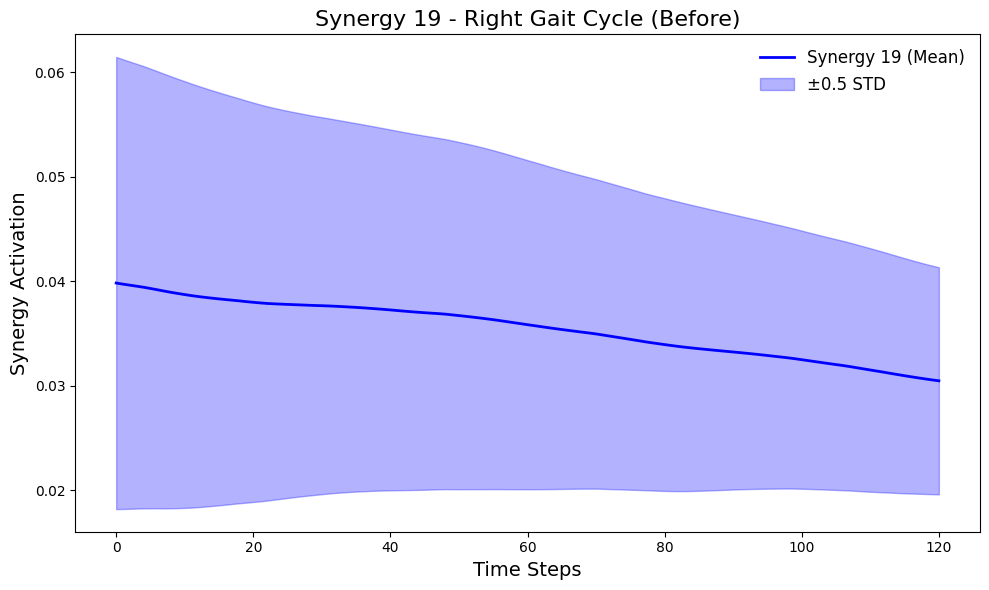

Synergy 20 plot saved to outputs_synergies/synergy_20_activation_Right_Gait_Cycle_Before.png


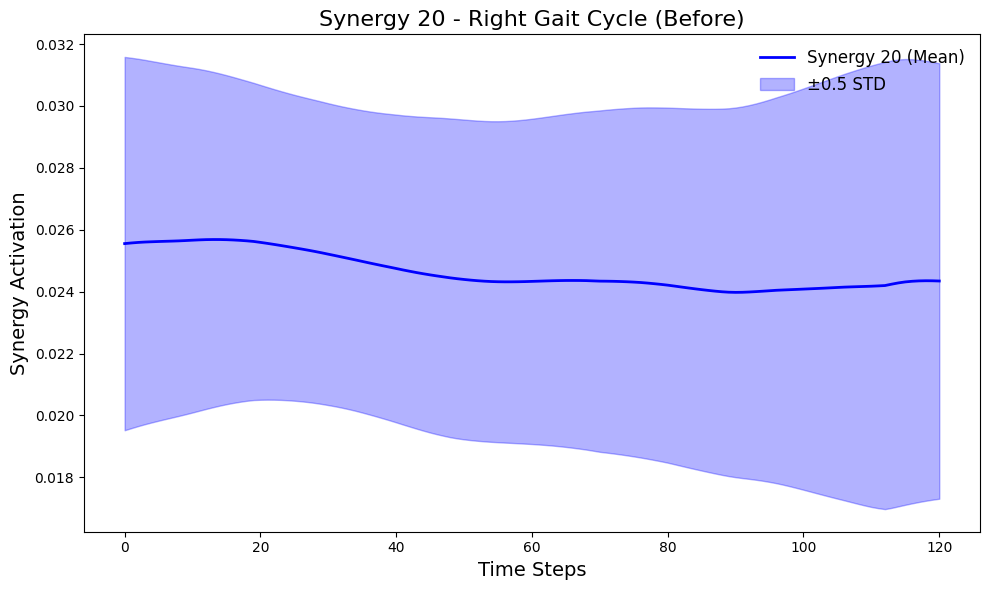

In [ ]:
print("\nSynergies information:")
synergies_info(
    W=W_mean,  # Mean synergy activations
    W_std=W_std,  # Standard deviation of synergy activations
    H=H,  # Activation coefficients
    r2_values=r2_values,
    optimal_components=optimal_components,
    activations=activations,  # Muscle activations
    muscle_names=muscle_names,  # Muscle names
    movement_description="Right Gait Cycle",
    task_description="Walking",
    output_folder="outputs_synergies"
)

___

In [ ]:
def activation_coefficients(H, movement_description, task_description, output_folder="outputs"):

    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Define muscle groups and assign colors
    muscle_groups = {
        "Hip Flexors": ['psoas', 'iliacus', 'recfem', 'sart', 'tfl', 'glmin1'],
        "Hip Extensors": ['glmax1', 'glmax2', 'glmax3', 'semimem', 'semiten', 'bflh', 'addmagIsch', 'glmed3'],
        "Hip Adductors": ['addbrev', 'addlong', 'addmagDist', 'addmagMid', 'addmagProx', 'grac'],
        "Hip Abductors": ['glmed1', 'glmed2', 'glmin2', 'glmin3', 'piri'],
        "Knee Flexors": ['bfsh', 'gaslat', 'gasmed'],
        "Knee Extensors": ['vaslat', 'vasmed', 'vasint'],
        "Ankle Plantar Flexors": ['soleus', 'tibpost', 'fhl', 'fdl', 'perlong', 'perbrev'],
        "Ankle Dorsiflexors": ['tibant', 'edl', 'ehl']
    }
    group_colors = {
        "Hip Extensors": 'green', "Hip Flexors": 'olive', "Hip Abductors": 'blue', "Hip Adductors": 'cyan',
        "Knee Extensors": 'orange', "Knee Flexors": 'red', "Ankle Plantar Flexors": 'brown', "Ankle Dorsiflexors": 'pink'
    }
    muscle_colors = {muscle: group_colors[group] for group, muscles in muscle_groups.items() for muscle in muscles}

    # Generate the full list of muscle names (left and right)
    muscle_names = [f"{muscle}_r" for muscle in muscle_colors.keys()] + [f"{muscle}_l" for muscle in muscle_colors.keys()]

    # Ensure the number of muscles matches the number of columns in H
    if len(muscle_names) != H.shape[1]:
        raise ValueError(f"Mismatch between muscle names ({len(muscle_names)}) and activation coefficients ({H.shape[1]}).")

    n_synergies = H.shape[0]

    for synergy_idx in range(n_synergies):
        # Create a new figure for each synergy
        fig, ax = plt.subplots(figsize=(16, 5))

        # Get the activation coefficients for the current synergy
        activation_coefficients = H[synergy_idx, :]
        max_activation = np.max(activation_coefficients)

        # Filter muscles with activation coefficients >= 5% of the maximum
        threshold = 0.05 * max_activation
        filtered_indices = np.where(activation_coefficients >= threshold)[0]
        filtered_coefficients = activation_coefficients[filtered_indices]
        filtered_muscle_names = [muscle_names[i] for i in filtered_indices]
        filtered_colors = [muscle_colors.get(muscle.split('_')[0], 'gray') for muscle in filtered_muscle_names]

        # Plot the filtered muscles
        ax.bar(range(len(filtered_muscle_names)), filtered_coefficients, color=filtered_colors, alpha=0.7)
        ax.set_title(f"Synergy {synergy_idx + 1} Activation Coefficients", fontsize=14)
        ax.set_ylabel("Coefficient")
        ax.set_xticks(range(len(filtered_muscle_names)))
        ax.set_xticklabels(filtered_muscle_names, rotation=90, fontsize=8)
        ax.grid(axis='y', linestyle='--', alpha=0.7)

        # Add a proper legend for muscle groups
        handles = [plt.Line2D([0], [0], color=color, lw=4, label=group) for group, color in group_colors.items()]
        ax.legend(handles=handles, fontsize=8, loc='upper right', ncol=2)

        # Save the individual plot
        filename = os.path.join(output_folder, f"activation_coefficients_synergy_{synergy_idx + 1}_{movement_description.replace(' ', '_')}_{task_description.replace(' ', '_')}.png")
        plt.savefig(filename)
        print(f"Synergy {synergy_idx + 1} activation coefficients plot saved to {filename}")

        plt.show()
        plt.close()

def top_activation(H, W, activations, muscle_names, top_n=8, movement_description="", task_description="", output_folder="outputs"):
    """
    Plots the activation levels over time for the top N muscles in each synergy, ordered by activation coefficient.

    Parameters:
    - H (numpy.ndarray): Activation coefficients (components × muscles).
    - W (numpy.ndarray): Synergy activations (time_steps × components).
    - activations (numpy.ndarray): Original muscle activations (time_steps × muscles).
    - muscle_names (list): List of muscle names corresponding to the columns of H.
    - top_n (int): Number of top activations to consider for each synergy.
    - movement_description (str): Description of the movement.
    - task_description (str): Description of the task.
    - output_folder (str): Folder to save the output plots.

    Returns:
    - None
    """
    os.makedirs(output_folder, exist_ok=True)

    n_synergies = H.shape[0]
    time_steps = activations.shape[0]

    for synergy_idx in range(n_synergies):
        # Get the indices of the top N muscles based on activation coefficients
        top_indices = np.argsort(H[synergy_idx, :])[-top_n:][::-1]
        top_muscle_names = [muscle_names[i] for i in top_indices]

        # Compute global maximum across all selected muscles
        max_val = np.max([np.max(activations[:, i]) for i in top_indices])

        # Create subplots
        fig, axs = plt.subplots(2, 4, figsize=(20, 10))  # 2 rows, 4 columns for top 8 muscles
        axs = axs.flatten()

        for i, muscle_idx in enumerate(top_indices):
            ax = axs[i]
            muscle_activation = activations[:, muscle_idx]

            # Plot the muscle activation curve
            ax.plot(range(time_steps), muscle_activation, color='blue')

            # Add title and grid
            ax.set_title(f"{muscle_names[muscle_idx]}", fontsize=12)
            ax.set_xlabel("Time Steps", fontsize=10)
            ax.set_ylabel("Activation Level", fontsize=10)
            ax.axhline(0, color='black', linestyle='--', linewidth=1)  # horizontal dashed line at y=0
            ax.set_ylim([-0.05, max_val + 0.05])  # unified y-axis limit
            ax.grid(True)

        # Turn off unused subplots
        for j in range(top_n, len(axs)):
            axs[j].axis("off")

        # Add a title for the entire figure
        fig.suptitle(
            f"Synergy {synergy_idx + 1} - Top {top_n} Muscle Activations Over Time\n"
            f"{movement_description} ({task_description})",
            fontsize=16
        )
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])

        # Save the plot
        filename = os.path.join(
            output_folder,
            f"synergy_{synergy_idx + 1}_top_{top_n}_activations_"
            f"{movement_description.replace(' ', '_')}_{task_description.replace(' ', '_')}.png"
        )
        plt.savefig(filename)
        print(f"Synergy {synergy_idx + 1} top {top_n} muscle activations plot saved to {filename}")

        plt.show()
        plt.close()

In [ ]:
def get_params(mjid, muscle_name):
    muscle_idx = mjid.muscle_names.index(muscle_name)
    return {
        "max_isometric_force": mjid.model.actuator_gainprm[muscle_idx][2],
        "optimal_fiber_length": mjid.model.actuator_biasprm[muscle_idx][0],
        "tendon_slack_length": mjid.model.actuator_biasprm[muscle_idx][1],
    }

def set_params(mjid, muscle_name, params):
    muscle_idx = mjid.muscle_names.index(muscle_name)
    if "max_isometric_force" in params:
        mjid.model.actuator_gainprm[muscle_idx][2] = params["max_isometric_force"]
    if "optimal_fiber_length" in params:
        mjid.model.actuator_biasprm[muscle_idx][0] = params["optimal_fiber_length"]
    if "tendon_slack_length" in params:
        mjid.model.actuator_biasprm[muscle_idx][1] = params["tendon_slack_length"]
        
def modify_params(mjid, muscle_name, **kwargs):
    original_params = get_params(mjid, muscle_name)
    set_params(mjid, muscle_name, {**original_params, **kwargs})
    return original_params

In [ ]:
def analyze_synergies(right_gait_cycle, movement_description, task_description, max_components=20, r2_threshold=0.8, output_folder="outputs"):
    """
    Computes muscle activations, muscle synergies, plots the synergy results, and plots the activation coefficients combined.

    Parameters:
    - right_gait_cycle (dict): Gait cycle data for computing activations.
    - movement_description (str): Description of the movement.
    - task_description (str): Description of the task.
    - max_components (int): Maximum number of components to test.
    - r2_threshold (float): R² threshold to determine the optimal number of components.
    - output_folder (str): Folder to save the output plots.

    Returns:
    - None
    """
    # Step 1: Compute muscle activations
    print("Computing muscle activations...")
    activations = compute_activations(right_gait_cycle)

    # Step 2: Compute synergies
    print("\nComputing muscle synergies...")
    W, H, optimal_components, r2_values = compute_synergies(activations, max_components, r2_threshold)

    # Step 3: Plot synergy results
    synergies_info(W, H, r2_values, optimal_components, movement_description, task_description, output_folder)

    # Step 4: Plot activation coefficients combined
    activation_coefficients(H, movement_description, task_description, output_folder)

    # Step 5: Plot top activations over time for each synergy
    muscle_names = mjid.muscle_names
    top_activation(H, W, activations, muscle_names, top_n=8, movement_description=movement_description, task_description=task_description, output_folder=output_folder)

In [ ]:
def synergies_before_after(
    mjid, muscle_name, parameter, scale_ratio, right_gait_cycle, movement_description, task_description, output_folder="outputs"
):
    """
    Performs synergy analysis before and after modifying a muscle parameter using a scale ratio.

    Parameters:
    - mjid: The Myosuite model instance.
    - muscle_name (str): Name of the muscle to modify.
    - parameter (str): Parameter to modify ('max_isometric_force', 'optimal_fiber_length', 'tendon_slack_length').
    - scale_ratio (float): Scale ratio to apply to the original parameter value.
    - right_gait_cycle (dict): Gait cycle data for computing activations.
    - movement_description (str): Description of the movement.
    - task_description (str): Description of the task.
    - output_folder (str): Folder to save the output plots.

    Returns:
    - None
    """
    # Step 1: Retrieve and print the original parameters
    original_params = get_params(mjid, muscle_name)

    # Step 2: Perform synergy analysis before modifying the parameter
    print("Performing synergy analysis with original parameters...")
    analyze_synergies(
        right_gait_cycle=right_gait_cycle,
        movement_description=f"{movement_description} (Original)",
        task_description=f"{task_description} (Original)",
        output_folder=os.path.join(output_folder, "original")
    )

    # Step 3: Compute the new value using the scale ratio
    if parameter not in original_params:
        raise ValueError(
            f"Invalid parameter '{parameter}'. Choose from 'max_isometric_force', 'optimal_fiber_length', or 'tendon_slack_length'."
        )
    new_value = original_params[parameter] * scale_ratio

    # Step 4: Modify the specified parameter
    modify_params(mjid, muscle_name, **{parameter: new_value})

    # Step 5: Perform synergy analysis after modifying the parameter
    print("\nPerforming synergy analysis with modified parameters...")
    analyze_synergies(
        right_gait_cycle=right_gait_cycle,
        movement_description=f"{movement_description} (Modified)",
        task_description=f"{task_description} (Modified)",
        output_folder=os.path.join(output_folder, "modified")
    )

    # Step 6: Restore the original parameter
    set_params(mjid, muscle_name, original_params)

Performing synergy analysis with original parameters...
Computing muscle activations...


  0%|          | 0/4982 [00:00<?, ?it/s]

100%|██████████| 4982/4982 [00:07<00:00, 685.62it/s]



Computing muscle synergies...
Optimal number of components: 16
Synergy results plot saved to outputs_scaled/original/synergy_results_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


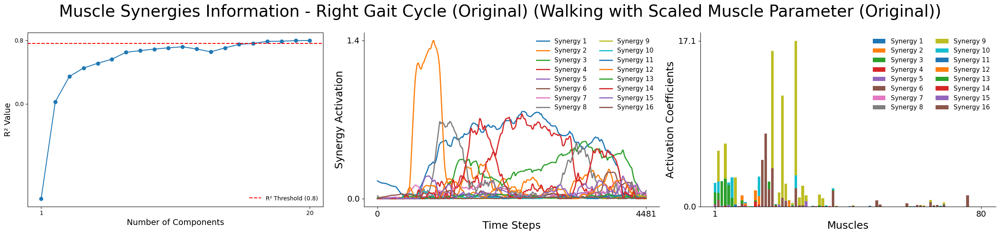

Synergy 1 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_1_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


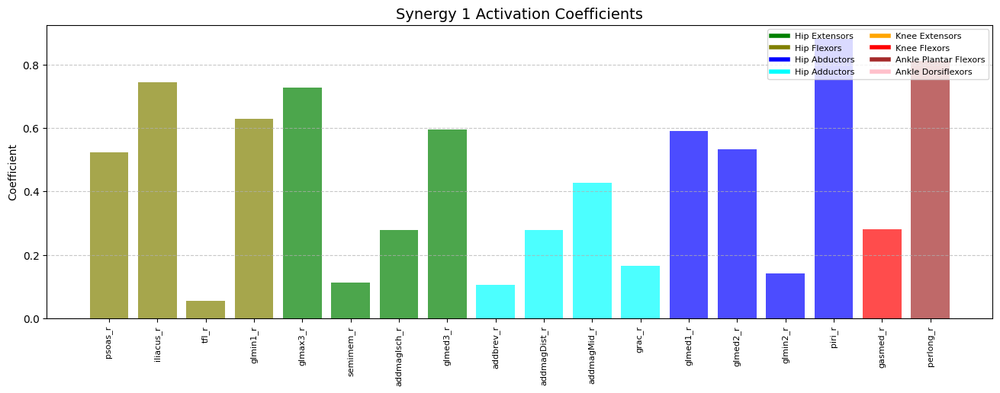

Synergy 2 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_2_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


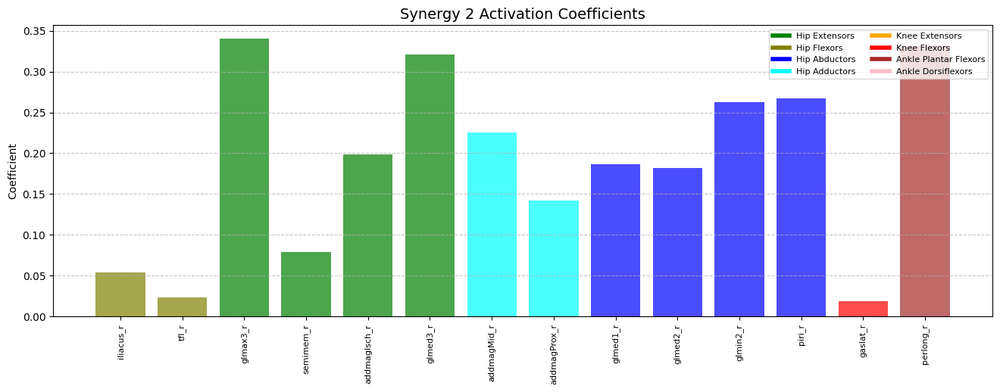

Synergy 3 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_3_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


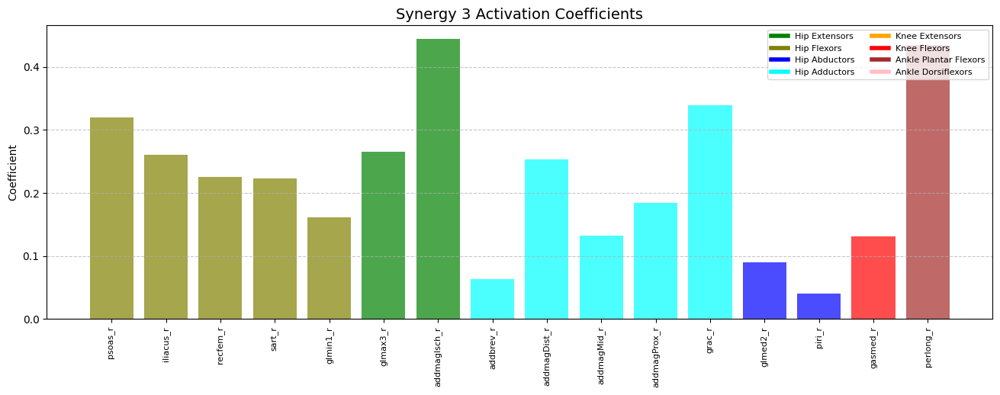

Synergy 4 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_4_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


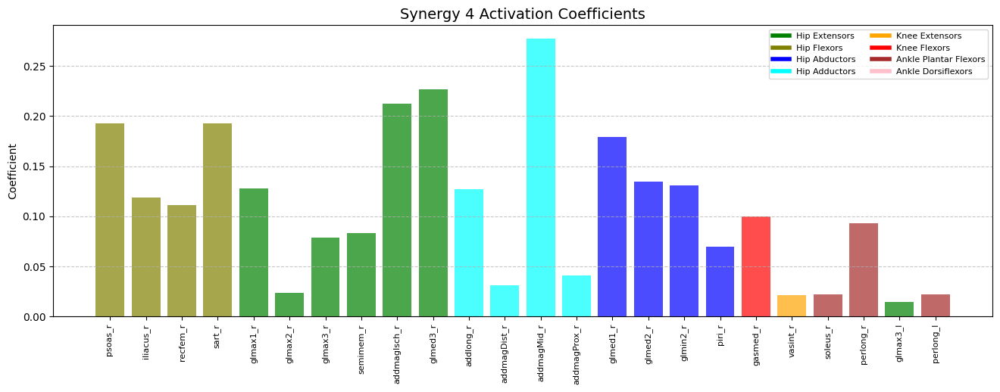

Synergy 5 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_5_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


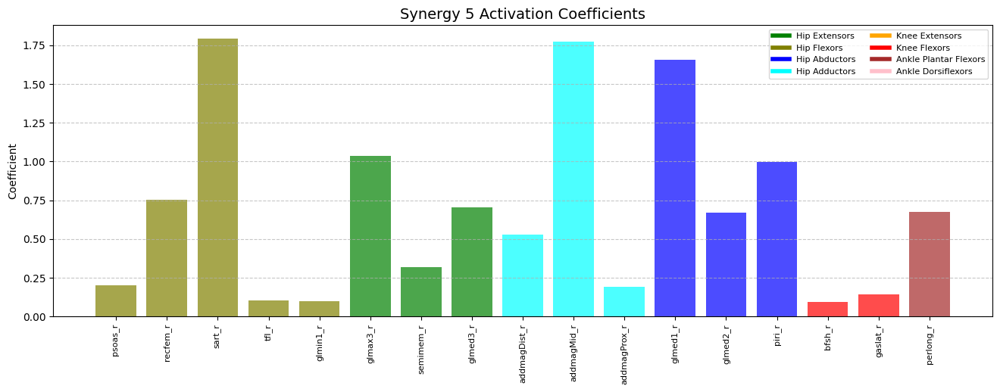

Synergy 6 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_6_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


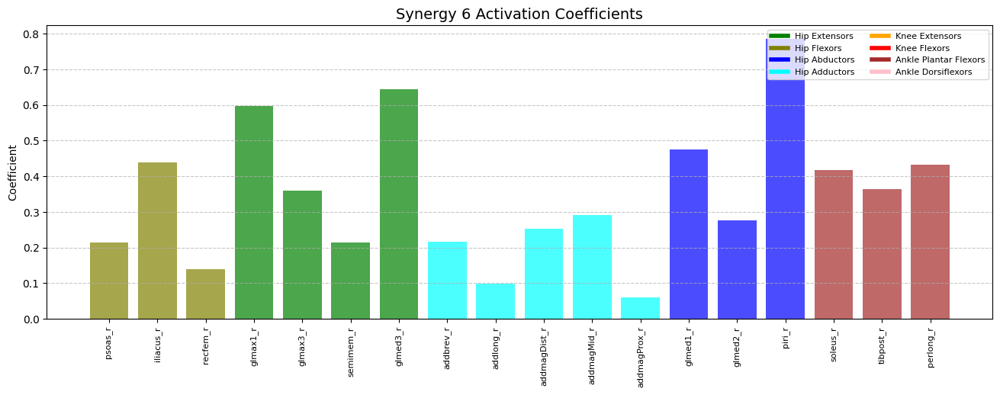

Synergy 7 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_7_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


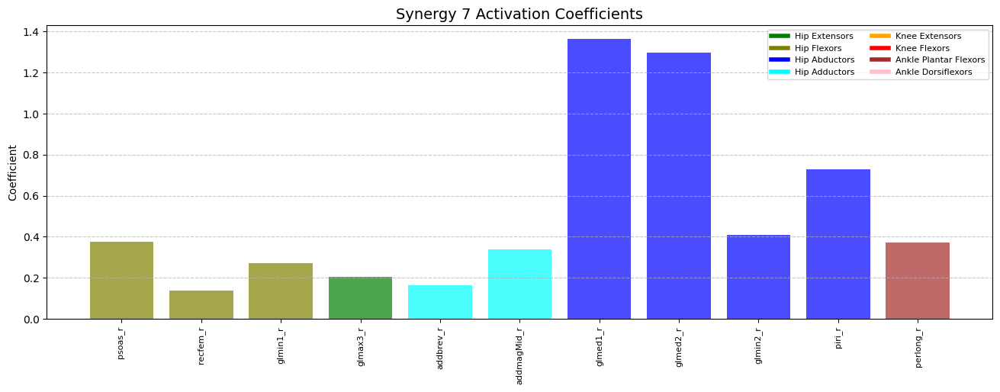

Synergy 8 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_8_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


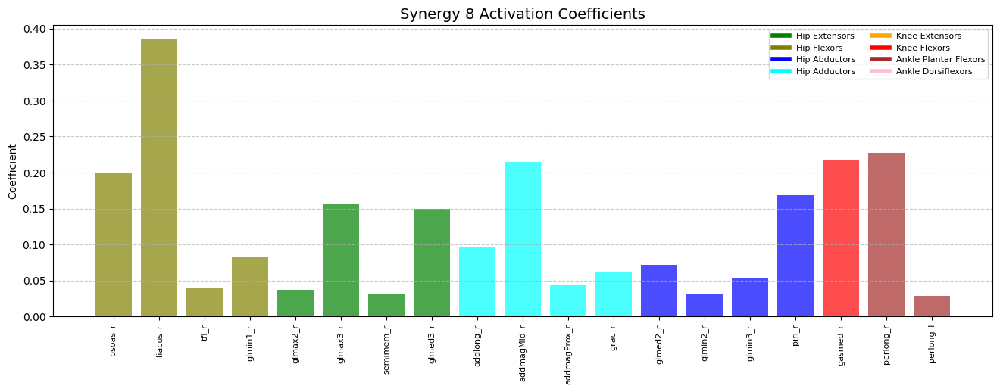

Synergy 9 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_9_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


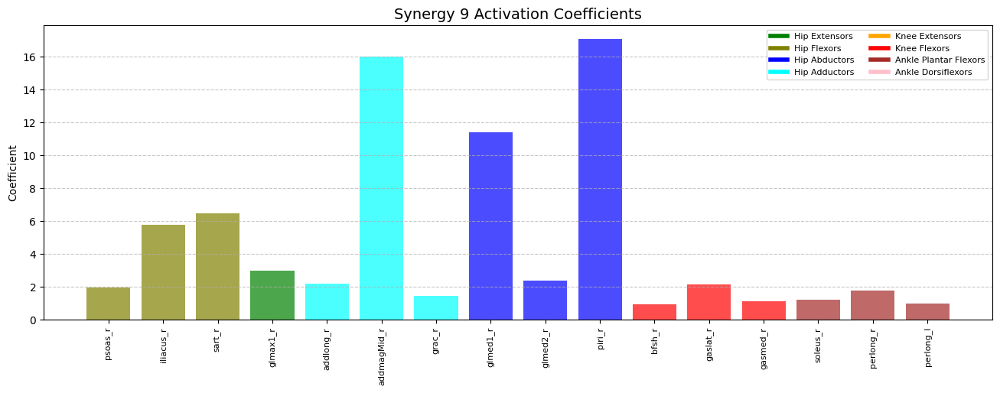

Synergy 10 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_10_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


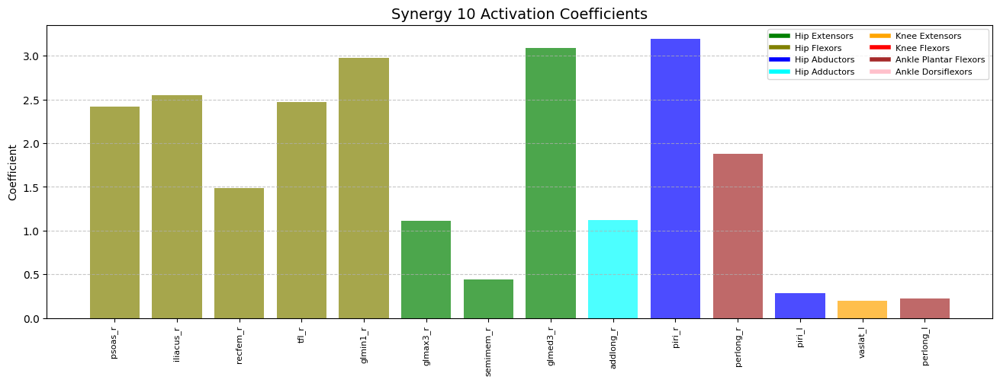

Synergy 11 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_11_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


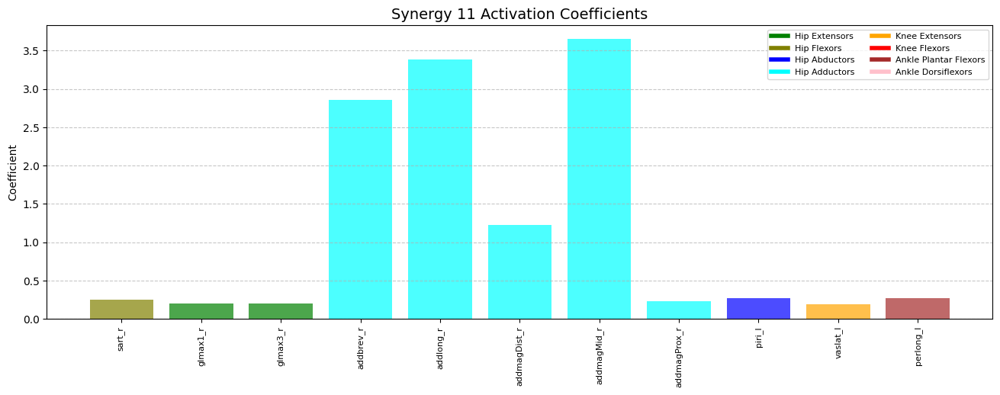

Synergy 12 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_12_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


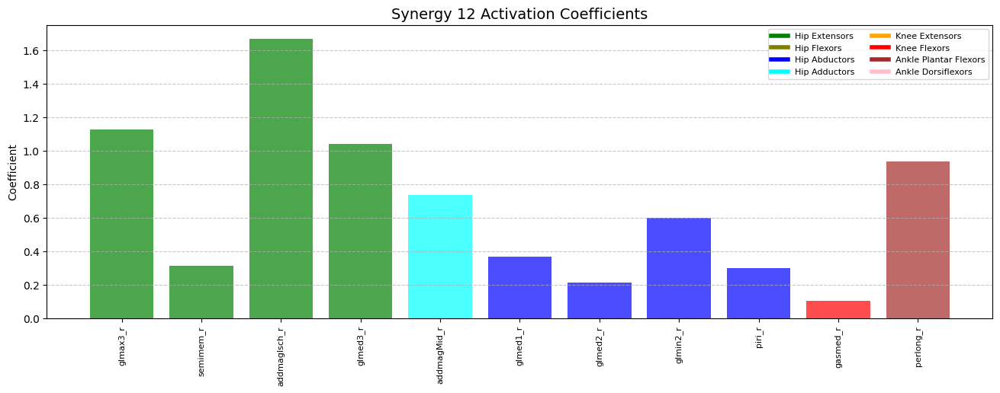

Synergy 13 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_13_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


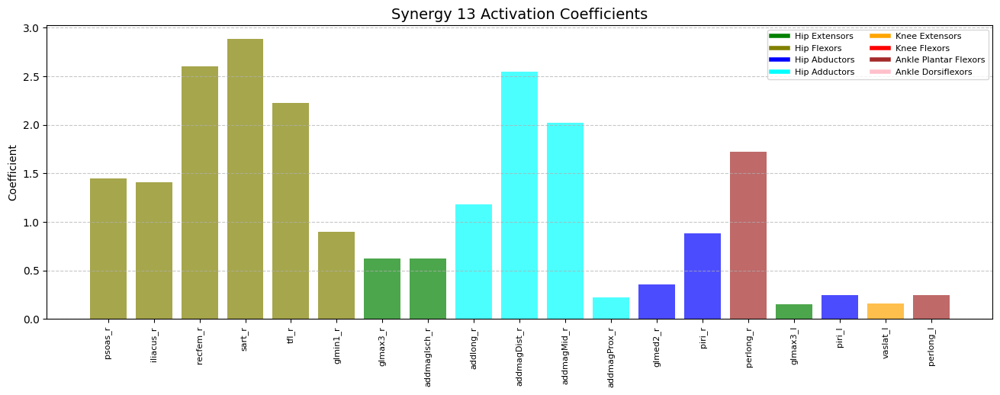

Synergy 14 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_14_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


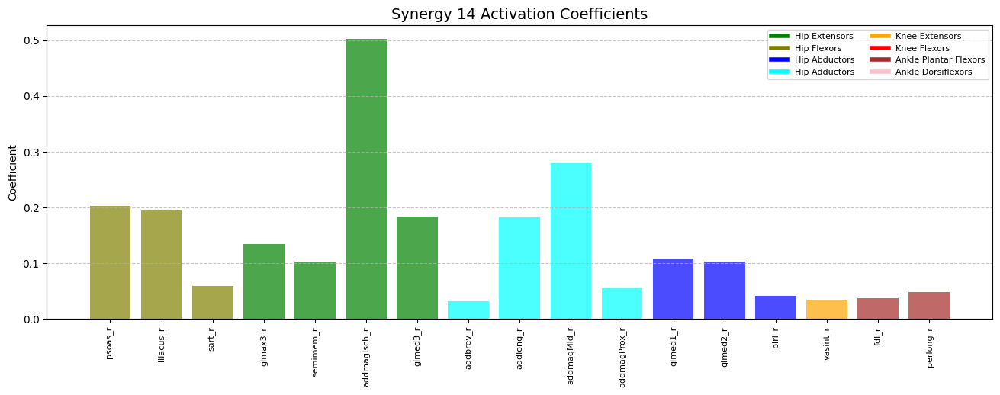

Synergy 15 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_15_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


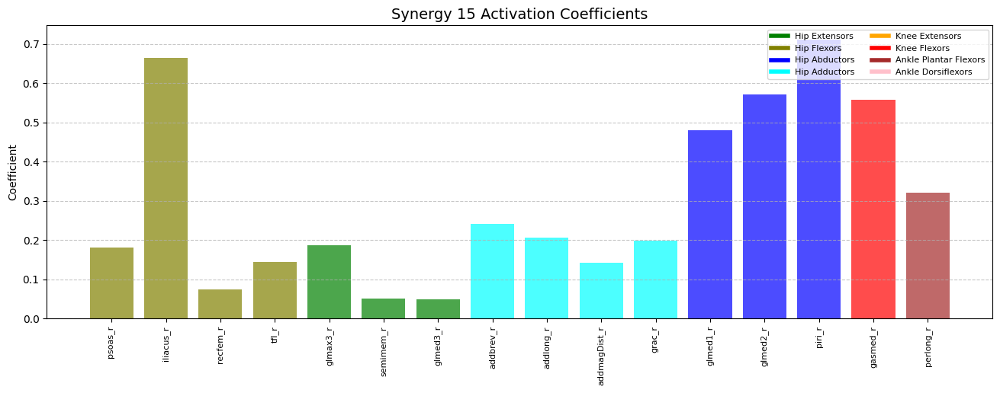

Synergy 16 activation coefficients plot saved to outputs_scaled/original/activation_coefficients_synergy_16_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


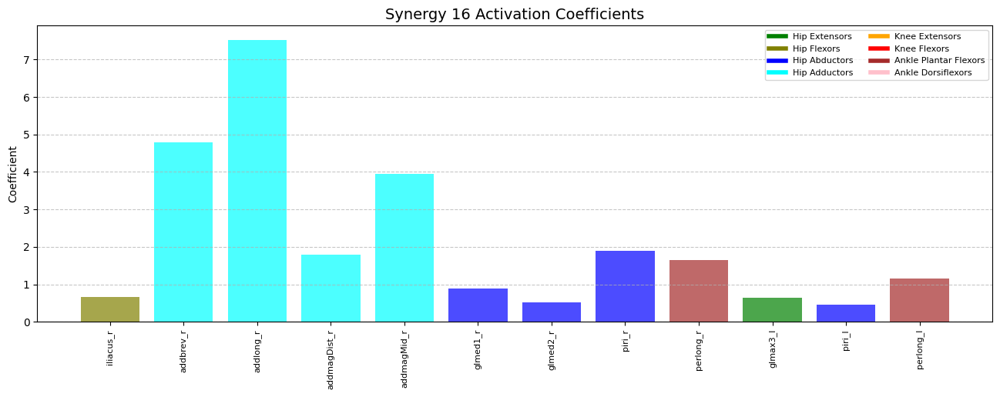

Synergy 1 top 8 muscle activations plot saved to outputs_scaled/original/synergy_1_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


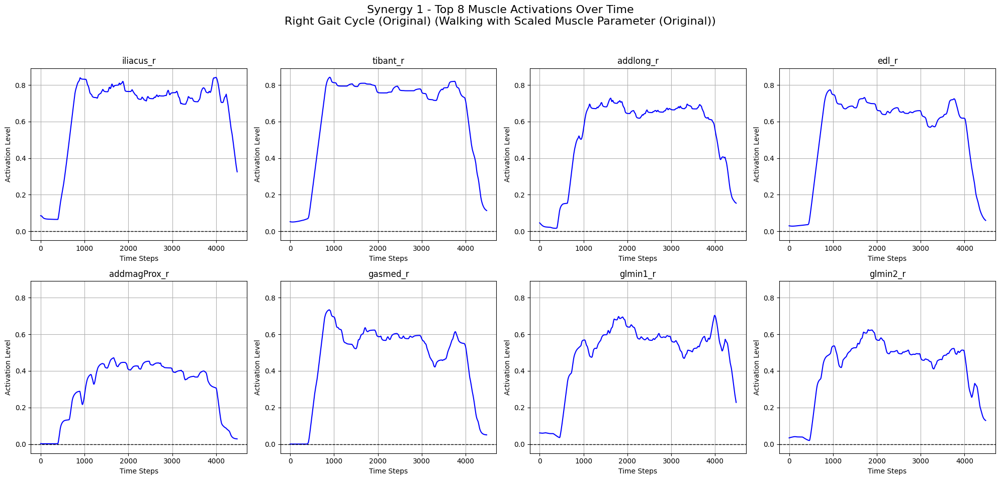

Synergy 2 top 8 muscle activations plot saved to outputs_scaled/original/synergy_2_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


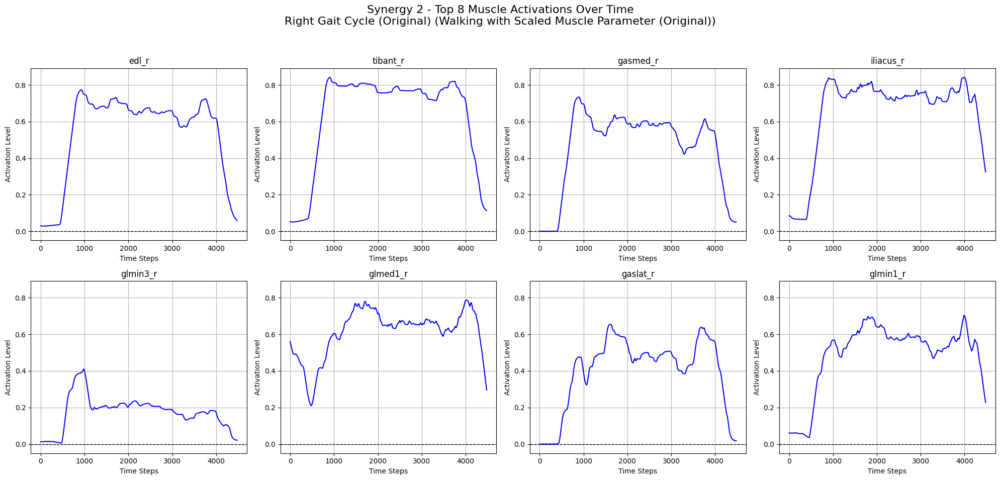

Synergy 3 top 8 muscle activations plot saved to outputs_scaled/original/synergy_3_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


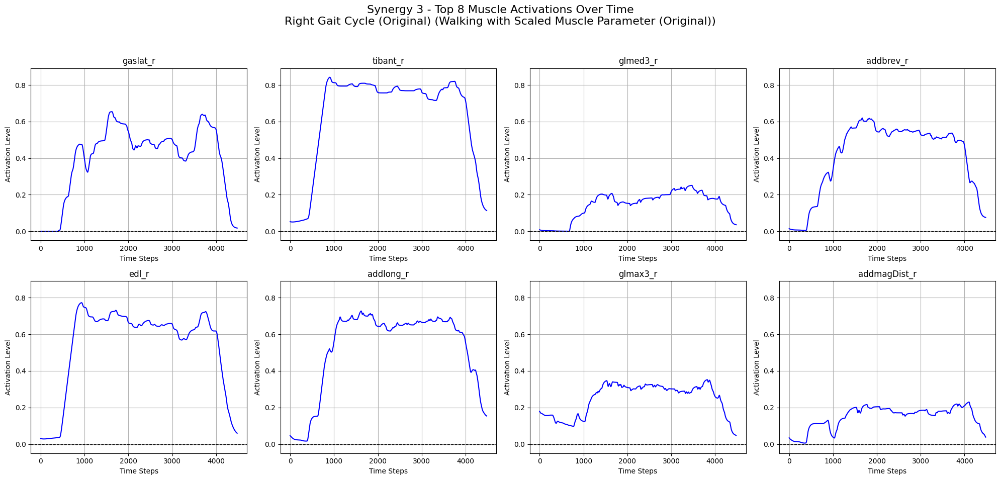

Synergy 4 top 8 muscle activations plot saved to outputs_scaled/original/synergy_4_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


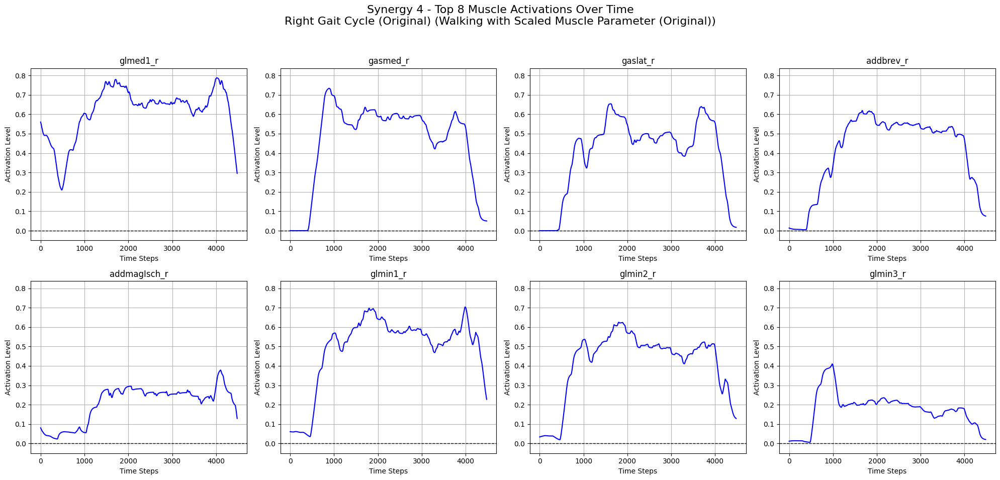

Synergy 5 top 8 muscle activations plot saved to outputs_scaled/original/synergy_5_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


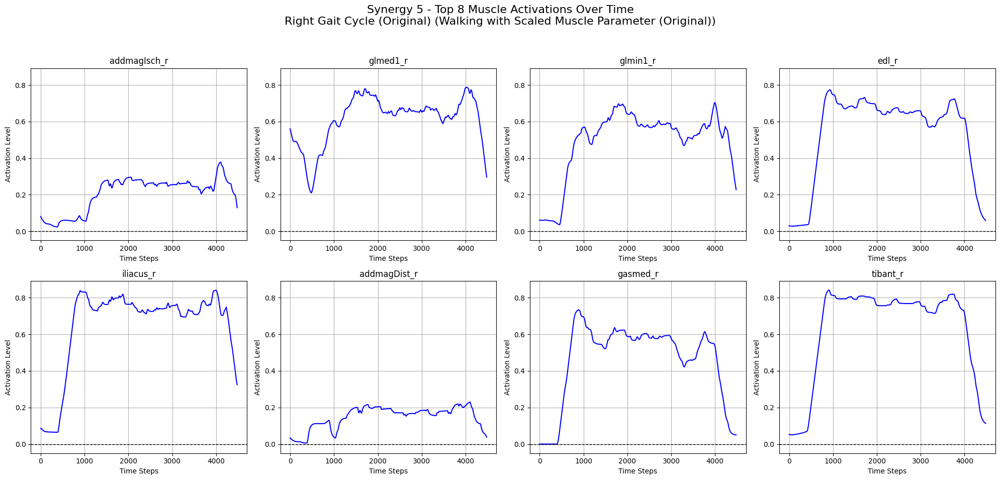

Synergy 6 top 8 muscle activations plot saved to outputs_scaled/original/synergy_6_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


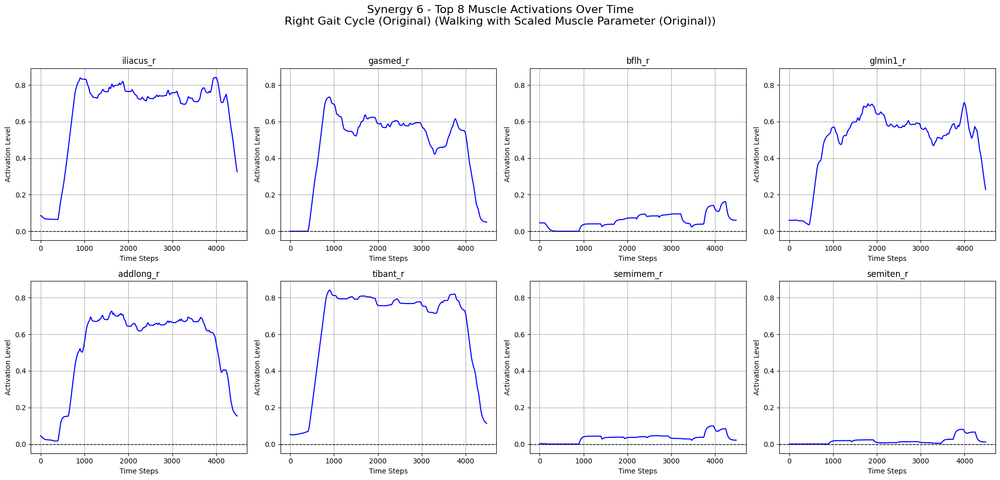

Synergy 7 top 8 muscle activations plot saved to outputs_scaled/original/synergy_7_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


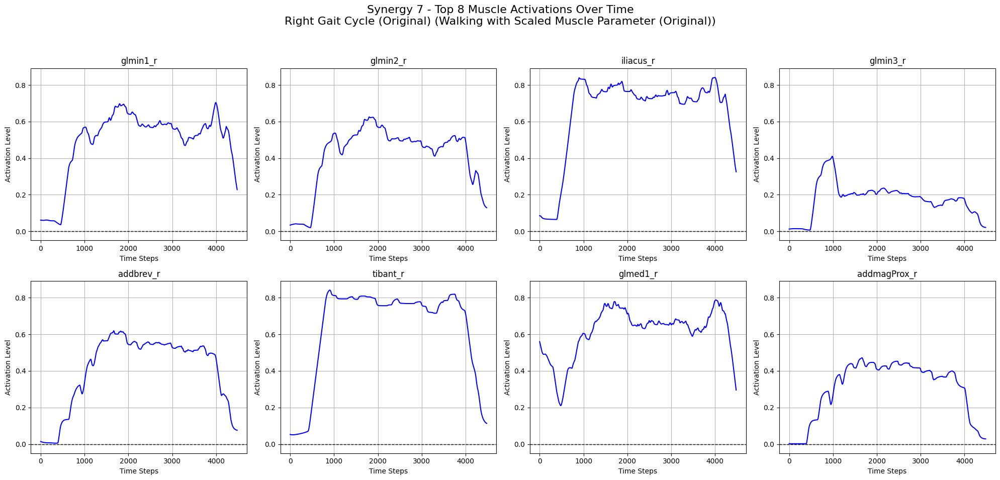

Synergy 8 top 8 muscle activations plot saved to outputs_scaled/original/synergy_8_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


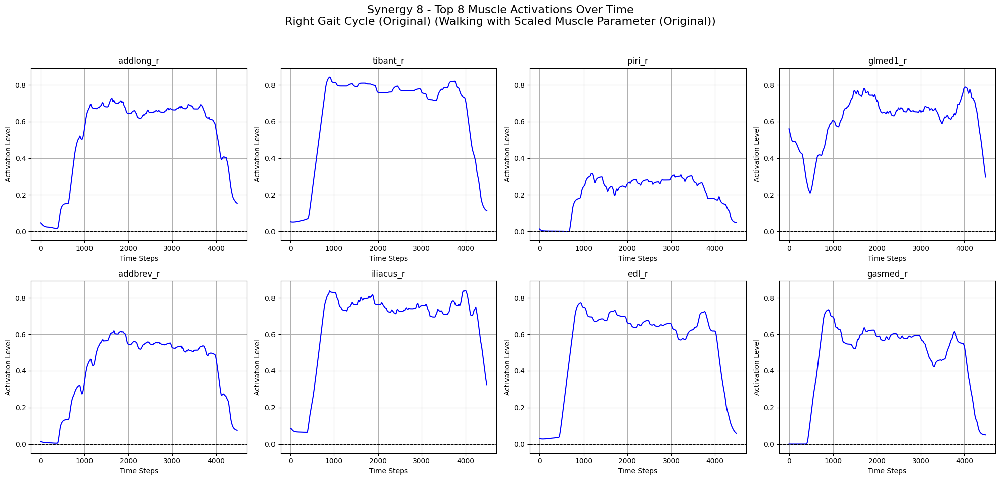

Synergy 9 top 8 muscle activations plot saved to outputs_scaled/original/synergy_9_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


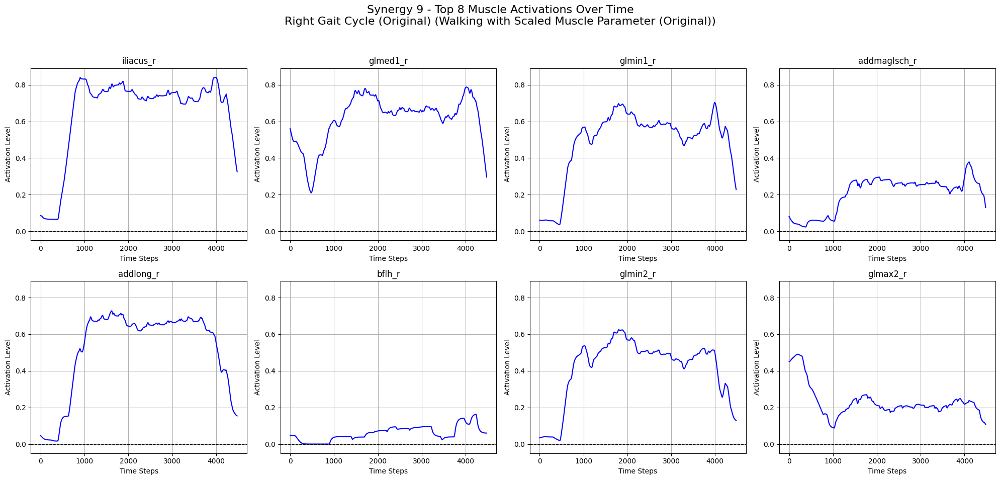

Synergy 10 top 8 muscle activations plot saved to outputs_scaled/original/synergy_10_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


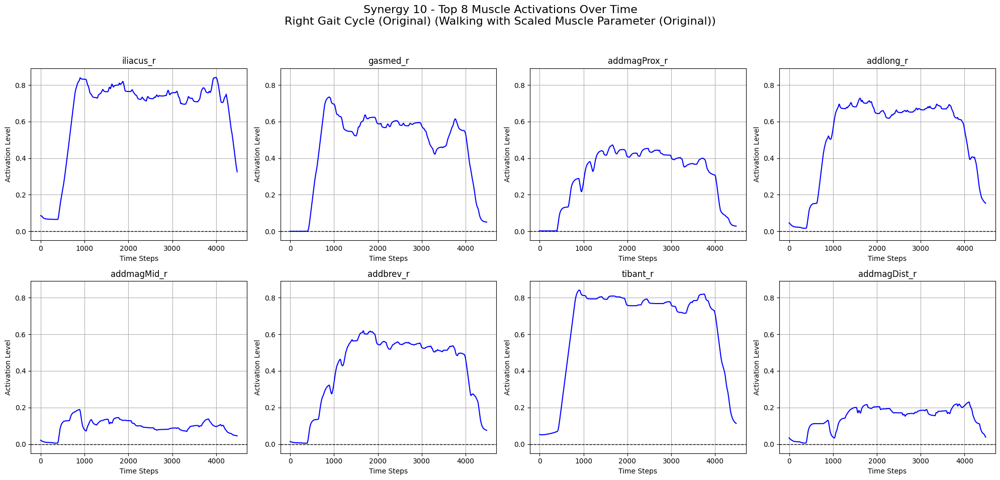

Synergy 11 top 8 muscle activations plot saved to outputs_scaled/original/synergy_11_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


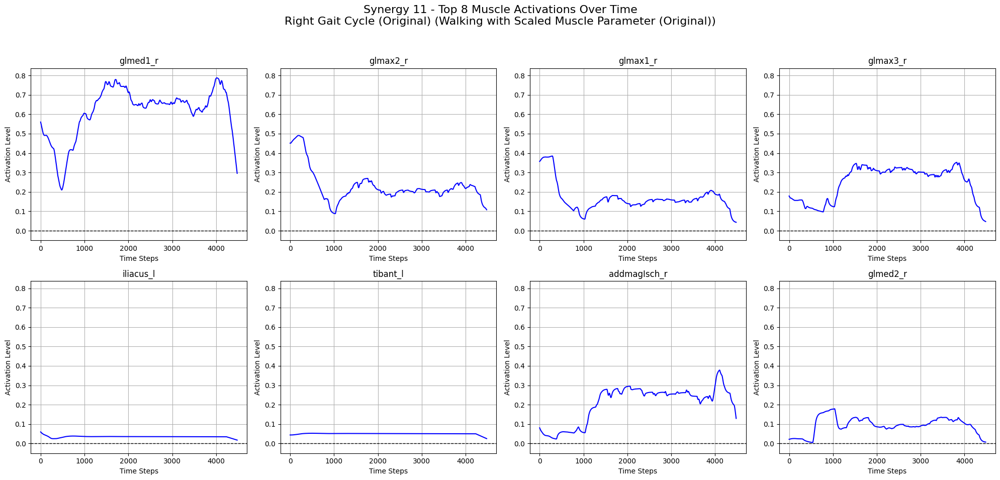

Synergy 12 top 8 muscle activations plot saved to outputs_scaled/original/synergy_12_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


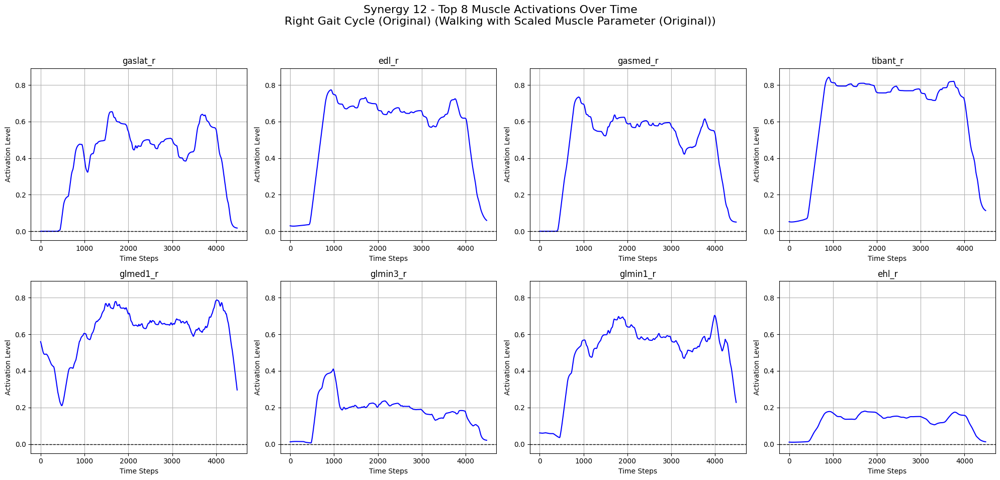

Synergy 13 top 8 muscle activations plot saved to outputs_scaled/original/synergy_13_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


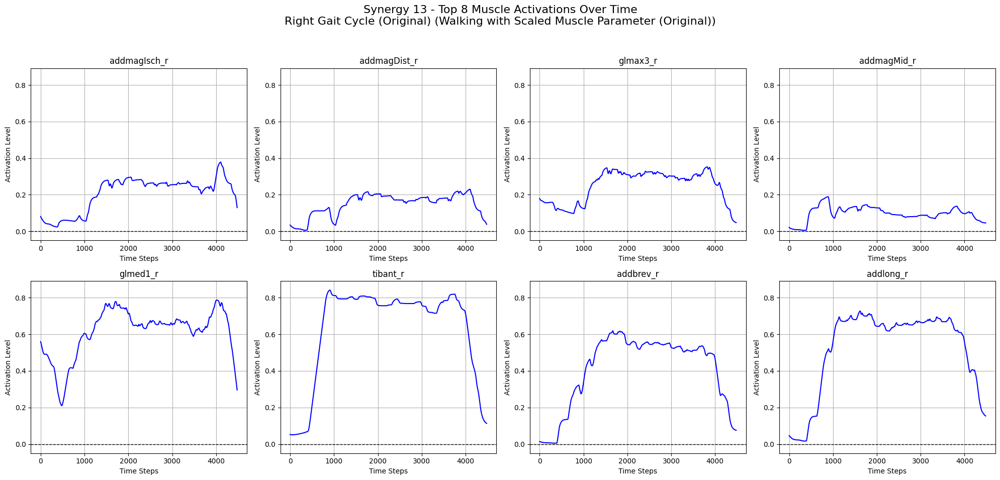

Synergy 14 top 8 muscle activations plot saved to outputs_scaled/original/synergy_14_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


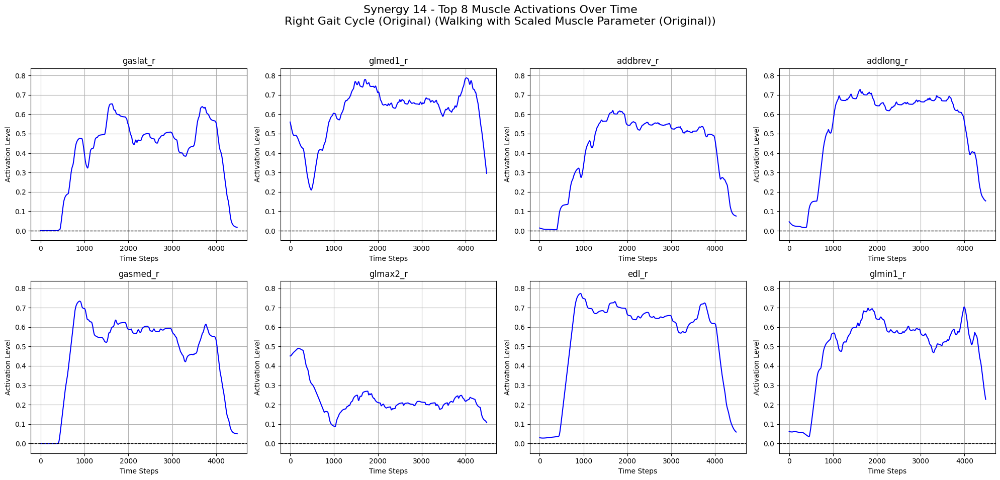

Synergy 15 top 8 muscle activations plot saved to outputs_scaled/original/synergy_15_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


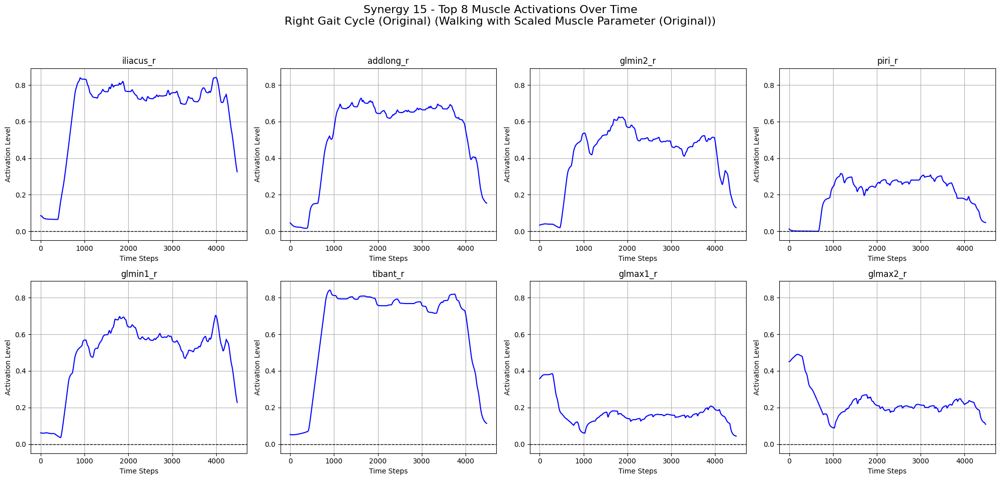

Synergy 16 top 8 muscle activations plot saved to outputs_scaled/original/synergy_16_top_8_activations_Right_Gait_Cycle_(Original)_Walking_with_Scaled_Muscle_Parameter_(Original).png


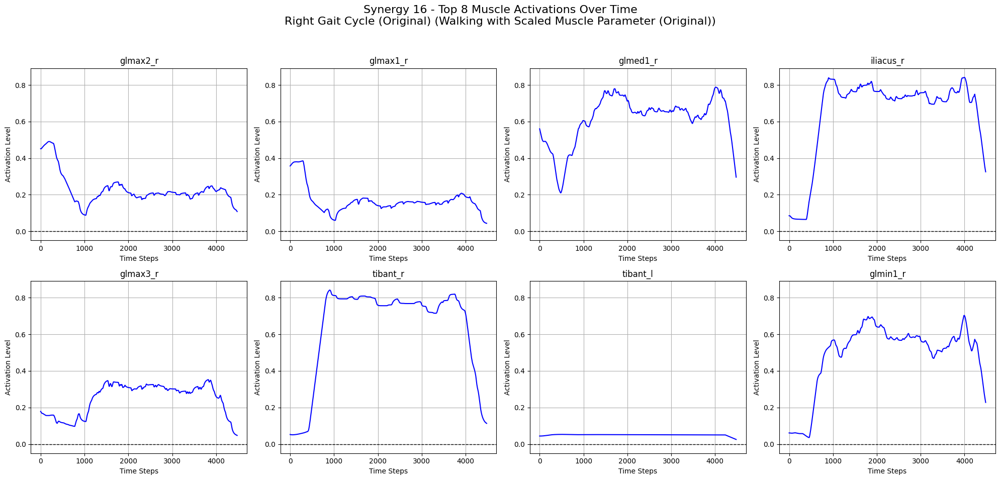


Performing synergy analysis with modified parameters...
Computing muscle activations...


100%|██████████| 4982/4982 [00:06<00:00, 713.10it/s]



Computing muscle synergies...
Optimal number of components: 17
Synergy results plot saved to outputs_scaled/modified/synergy_results_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


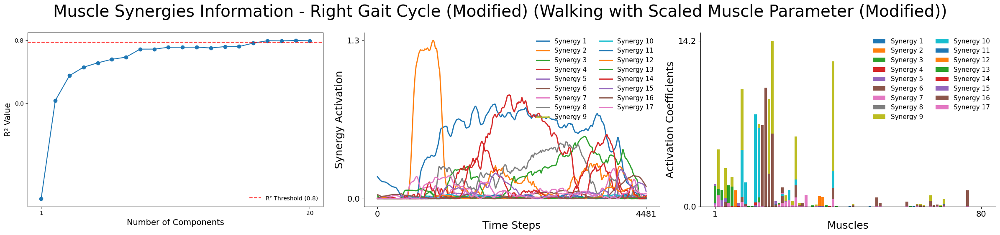

Synergy 1 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_1_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


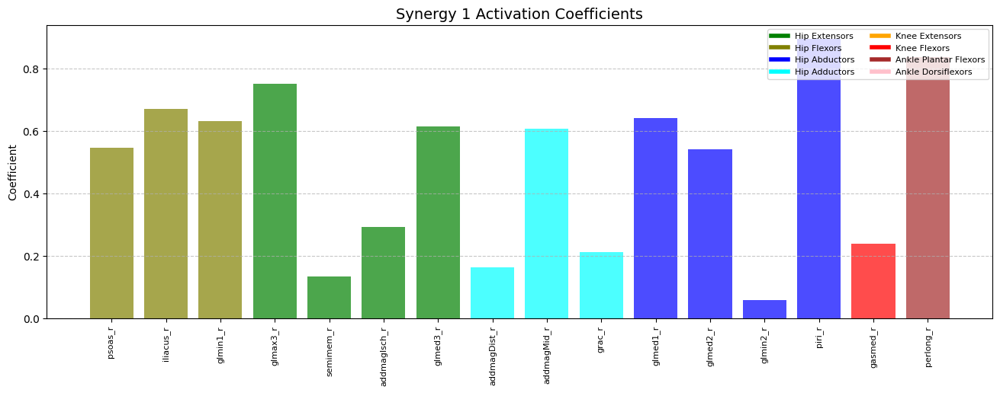

Synergy 2 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_2_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


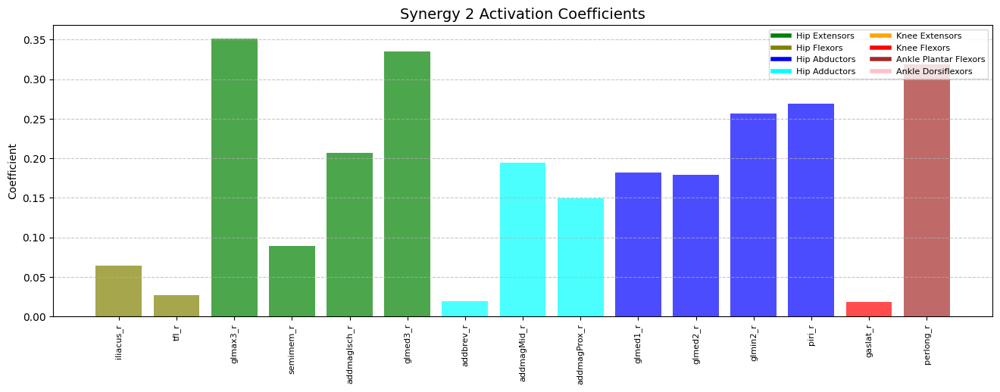

Synergy 3 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_3_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


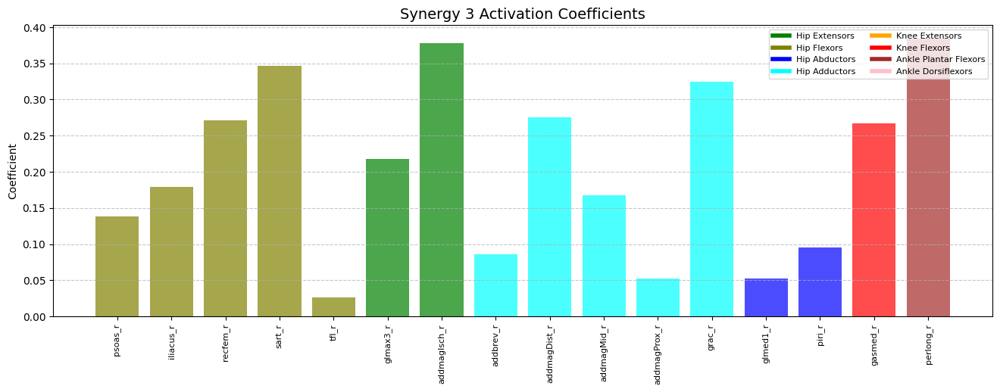

Synergy 4 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_4_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


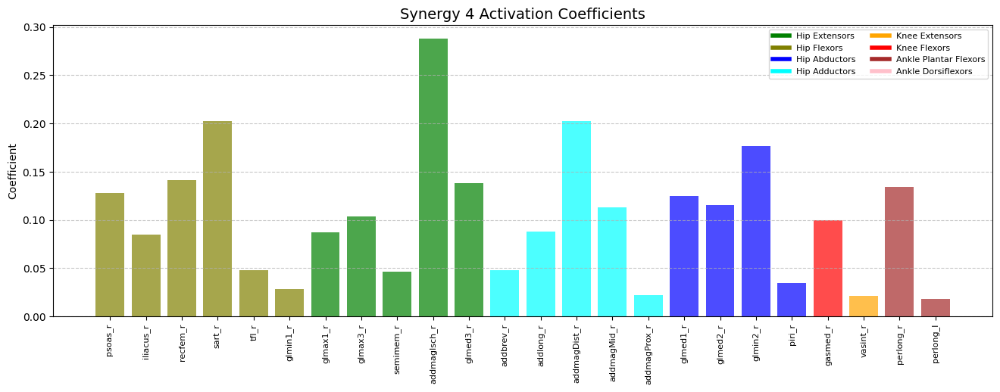

Synergy 5 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_5_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


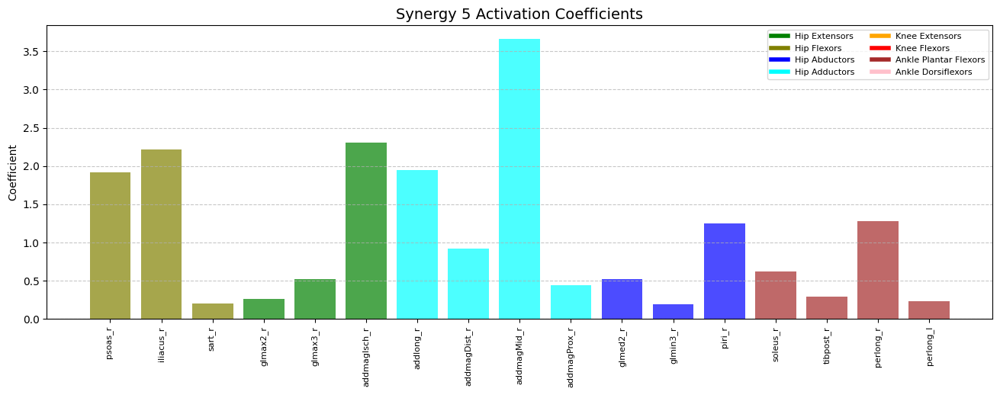

Synergy 6 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_6_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


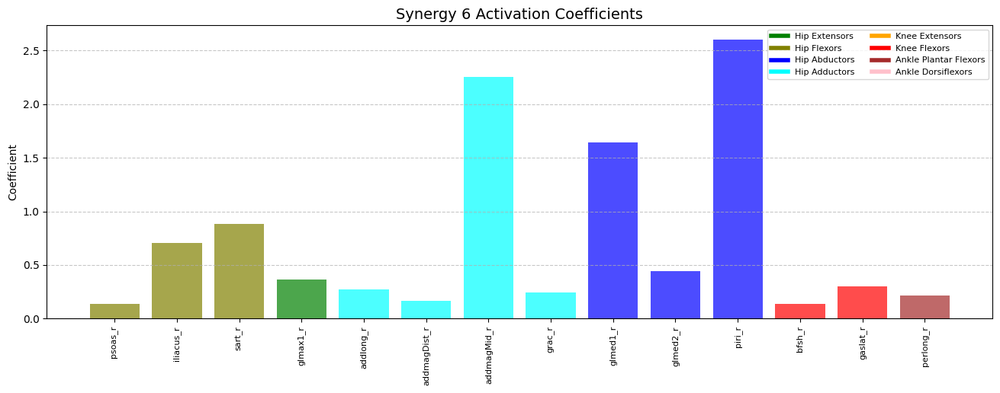

Synergy 7 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_7_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


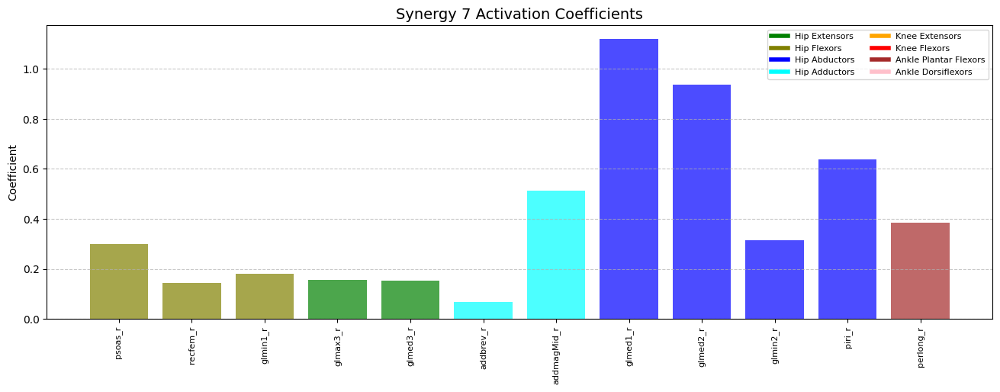

Synergy 8 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_8_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


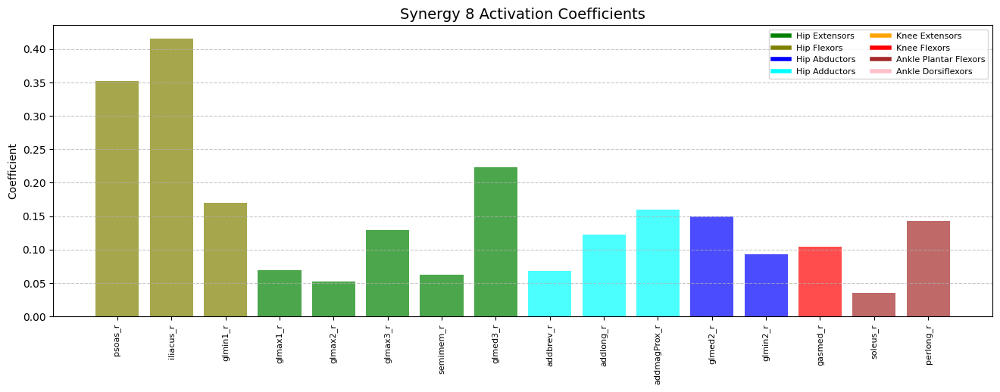

Synergy 9 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_9_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


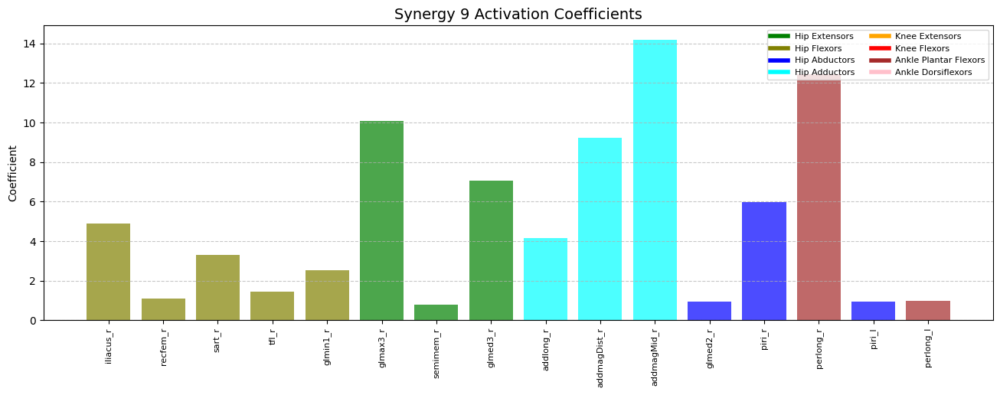

Synergy 10 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_10_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


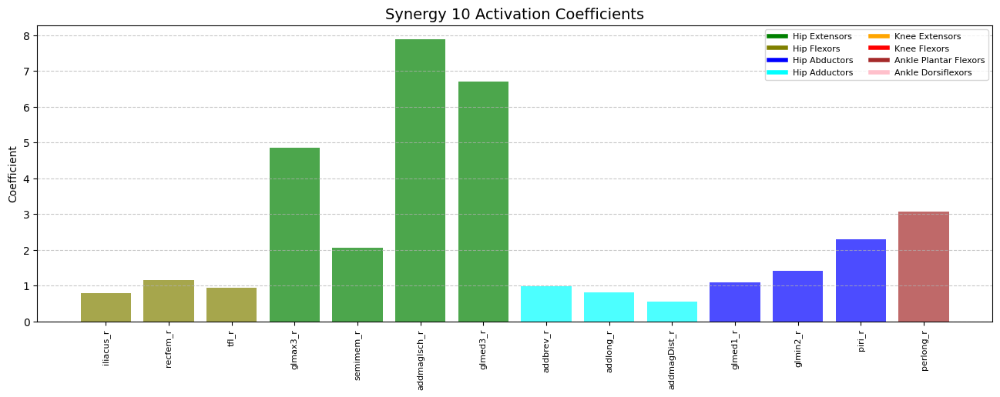

Synergy 11 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_11_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


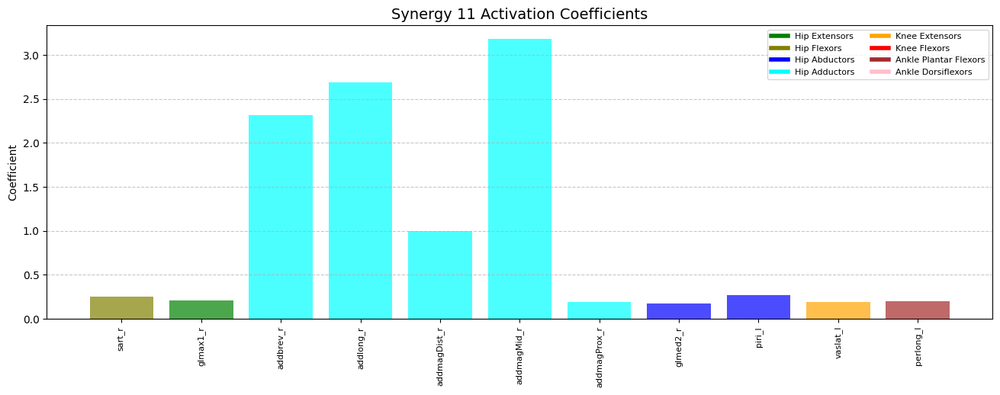

Synergy 12 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_12_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


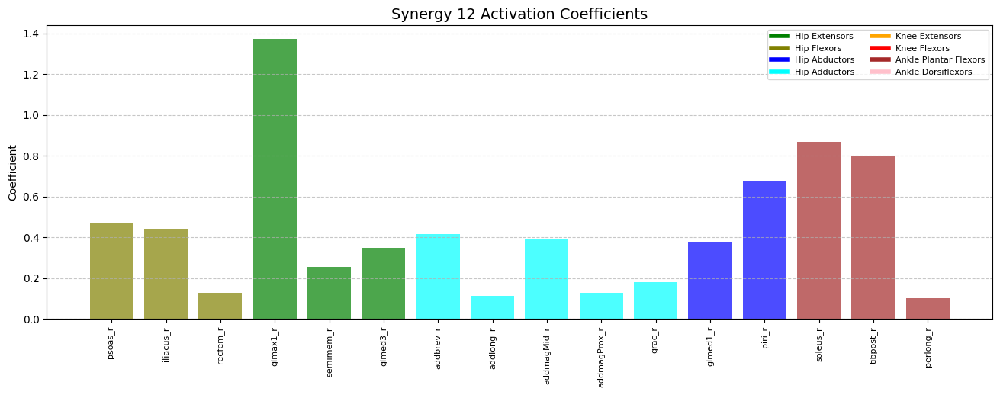

Synergy 13 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_13_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


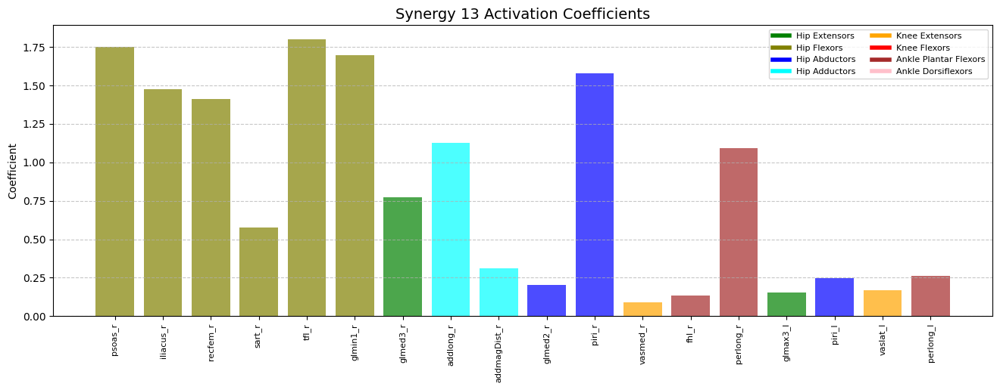

Synergy 14 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_14_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


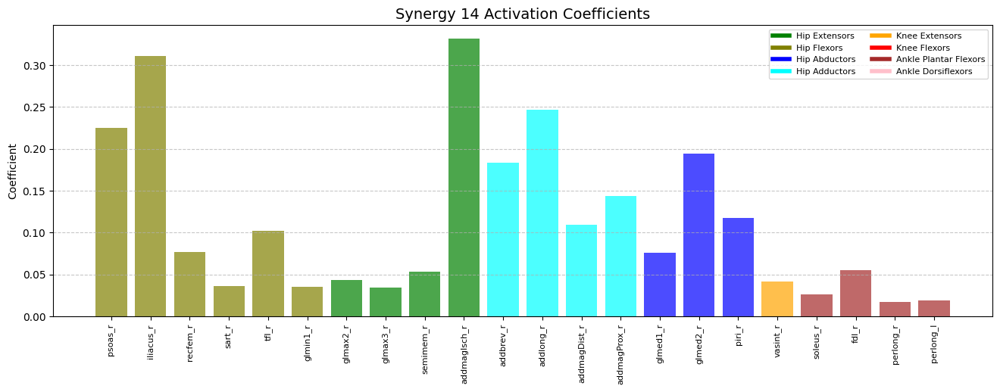

Synergy 15 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_15_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


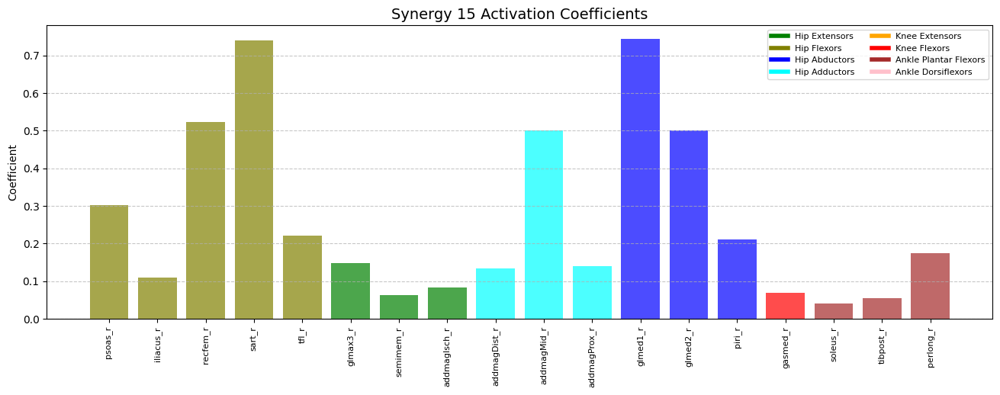

Synergy 16 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_16_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


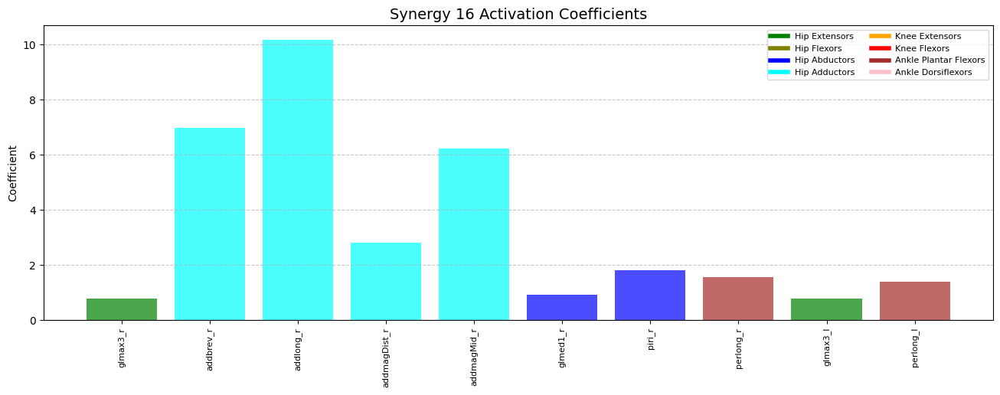

Synergy 17 activation coefficients plot saved to outputs_scaled/modified/activation_coefficients_synergy_17_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


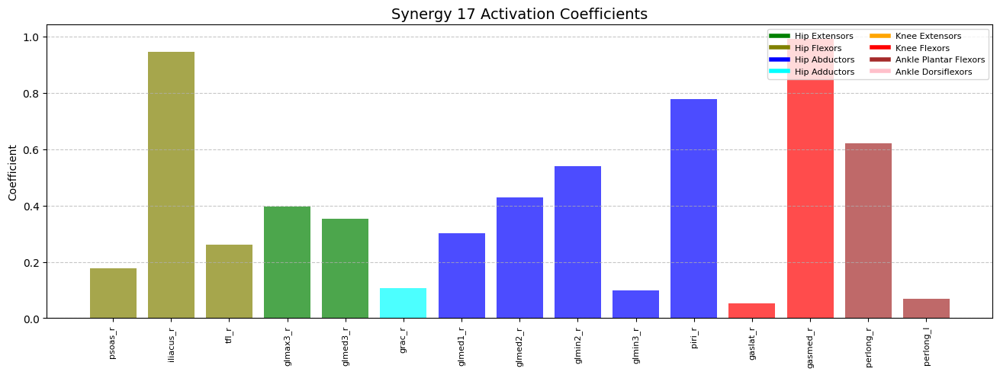

Synergy 1 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_1_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


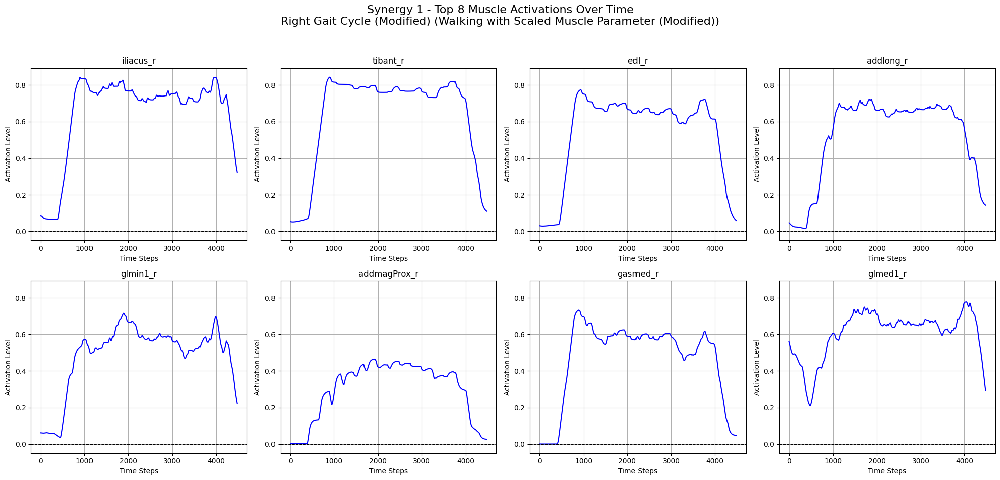

Synergy 2 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_2_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


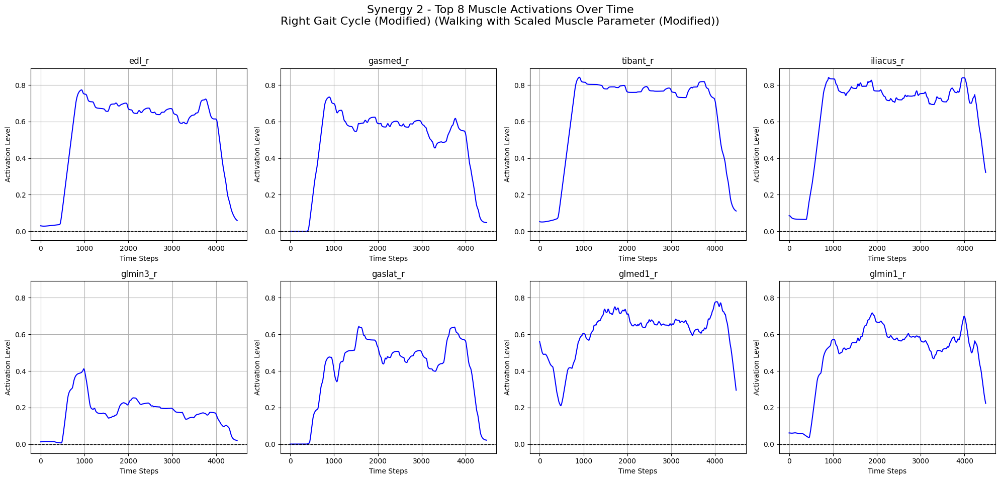

Synergy 3 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_3_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


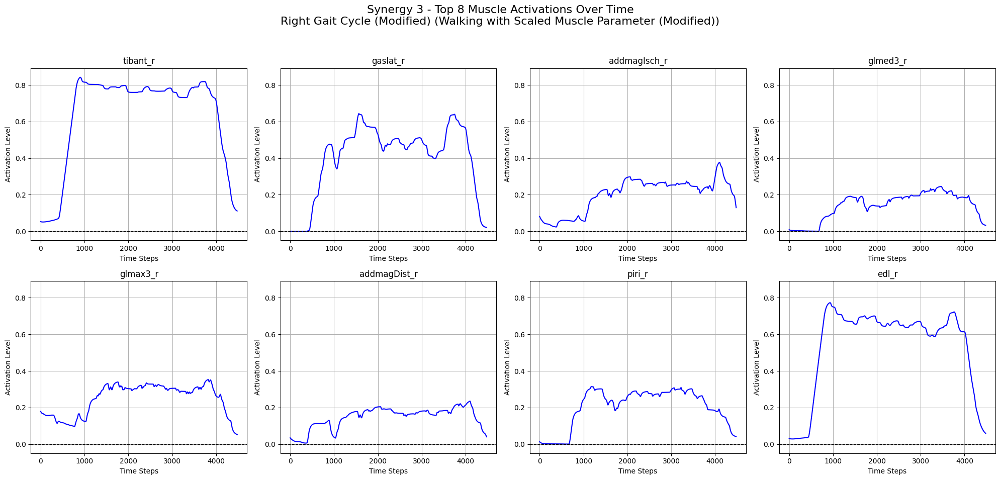

Synergy 4 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_4_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


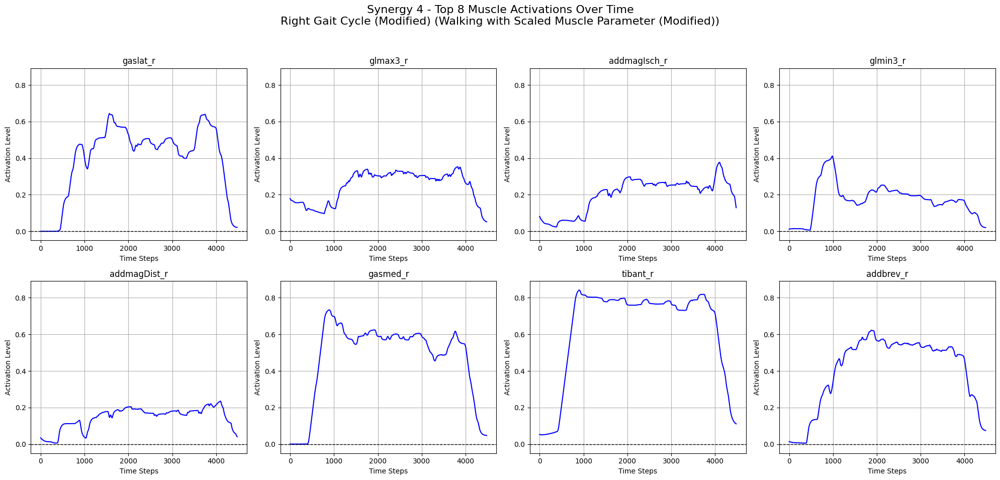

Synergy 5 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_5_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


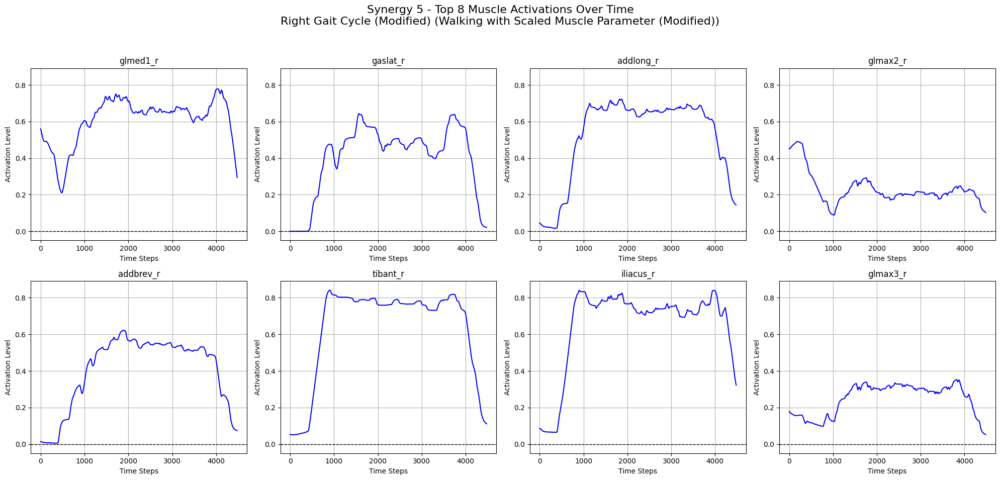

Synergy 6 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_6_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


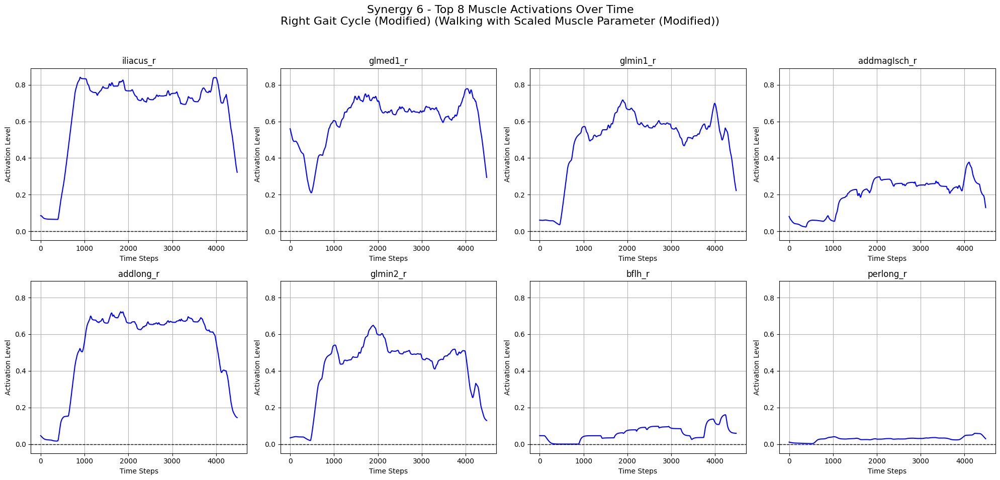

Synergy 7 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_7_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


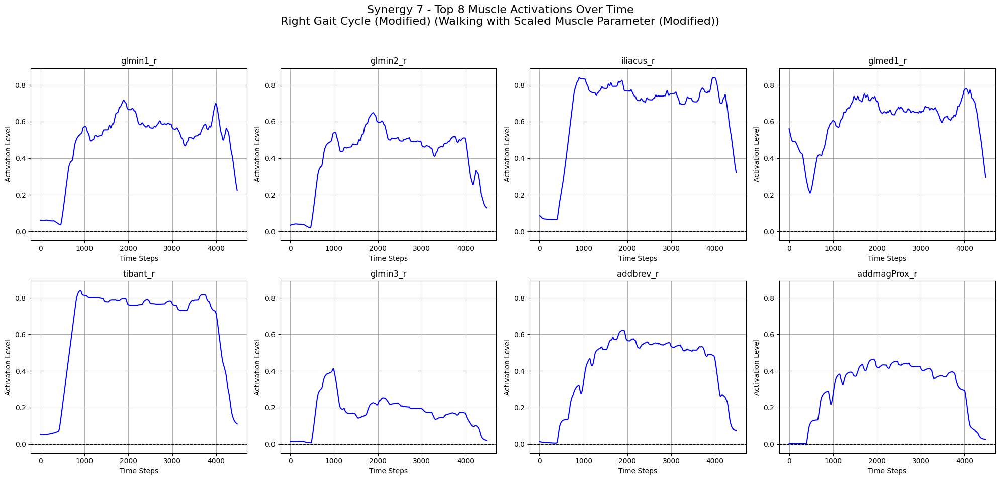

Synergy 8 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_8_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


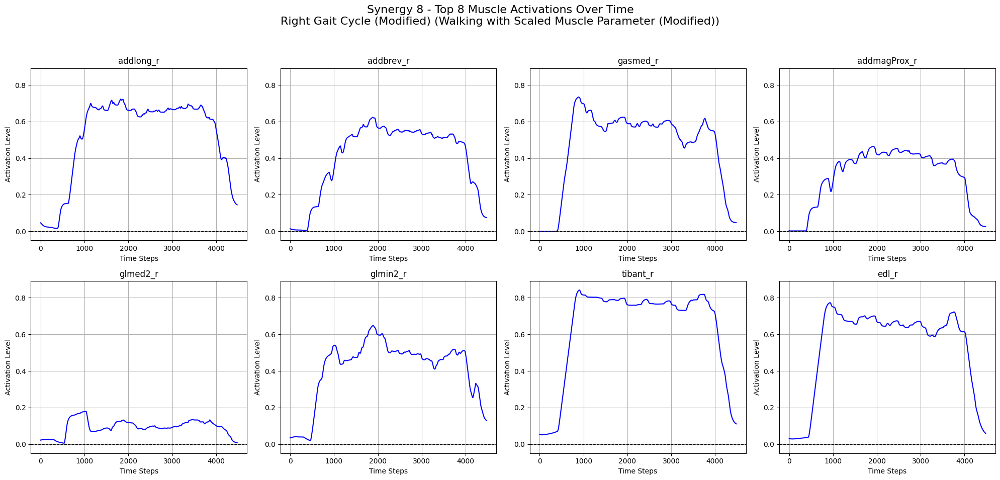

Synergy 9 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_9_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


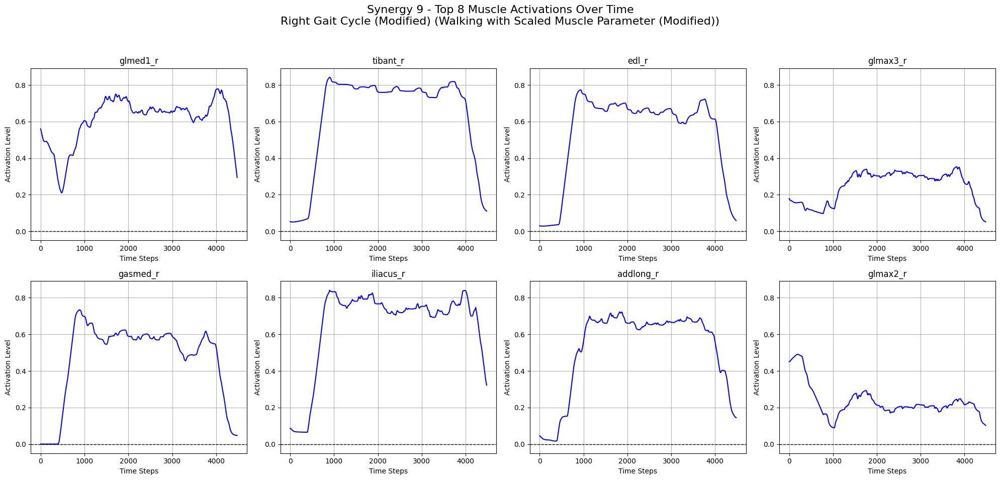

Synergy 10 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_10_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


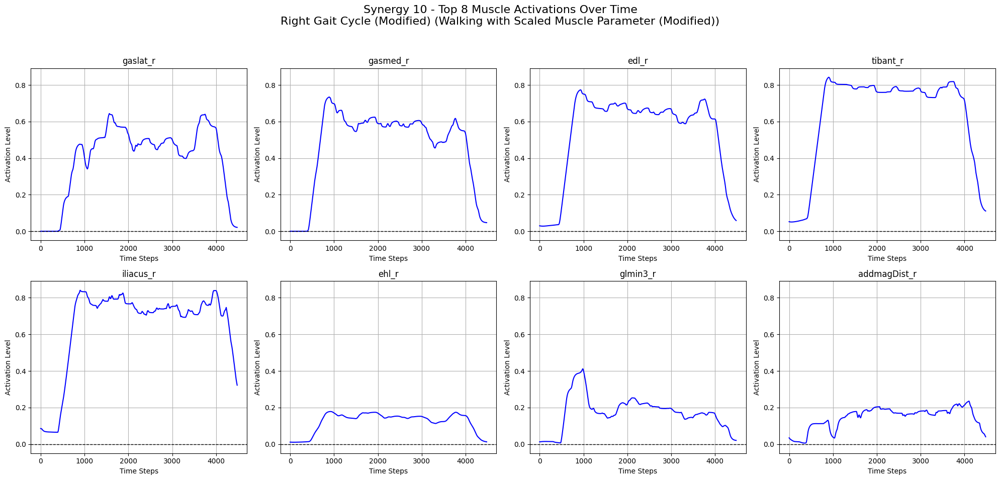

Synergy 11 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_11_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


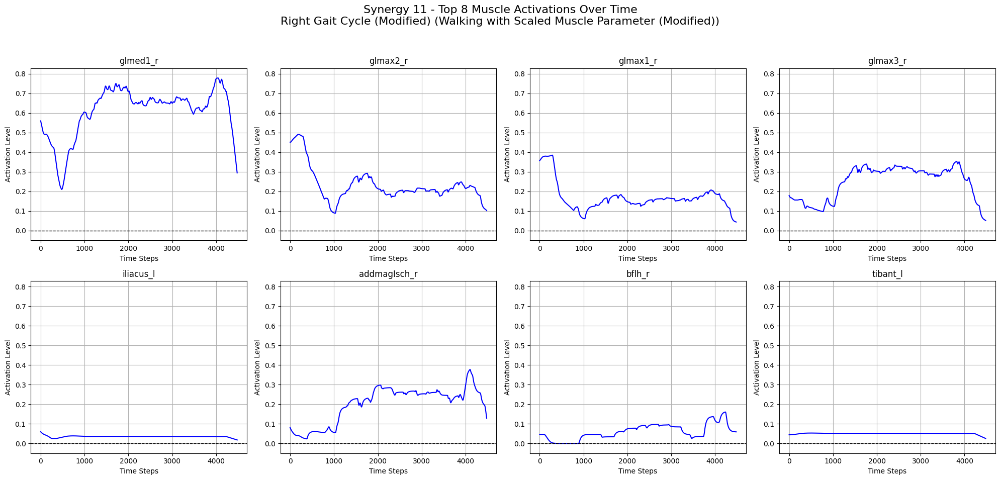

Synergy 12 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_12_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


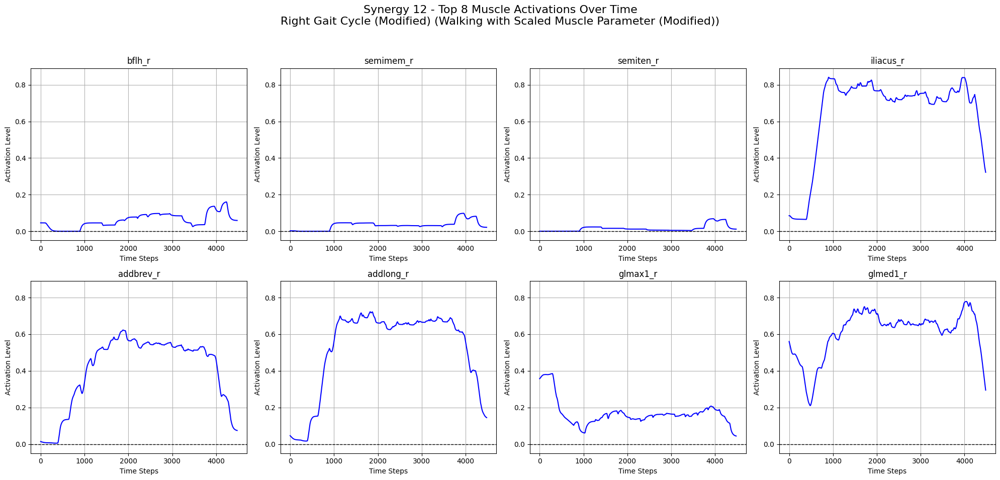

Synergy 13 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_13_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


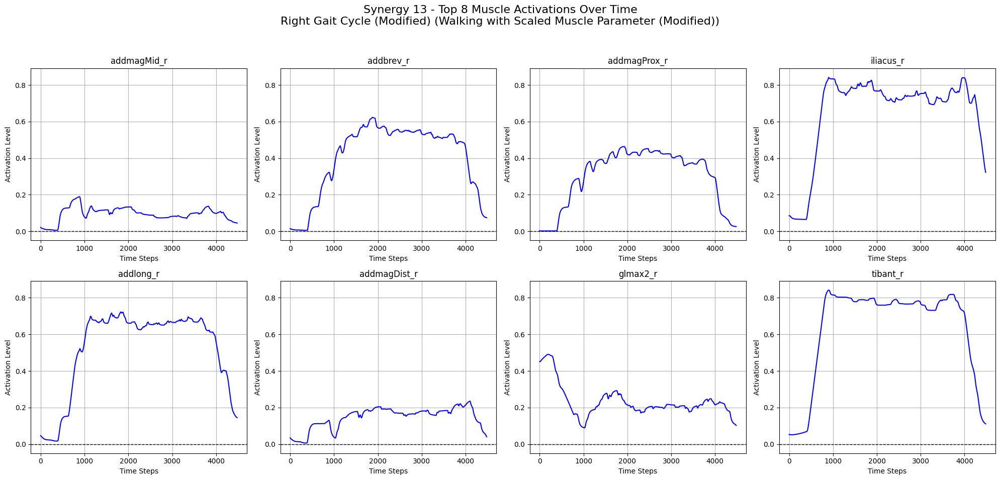

Synergy 14 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_14_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


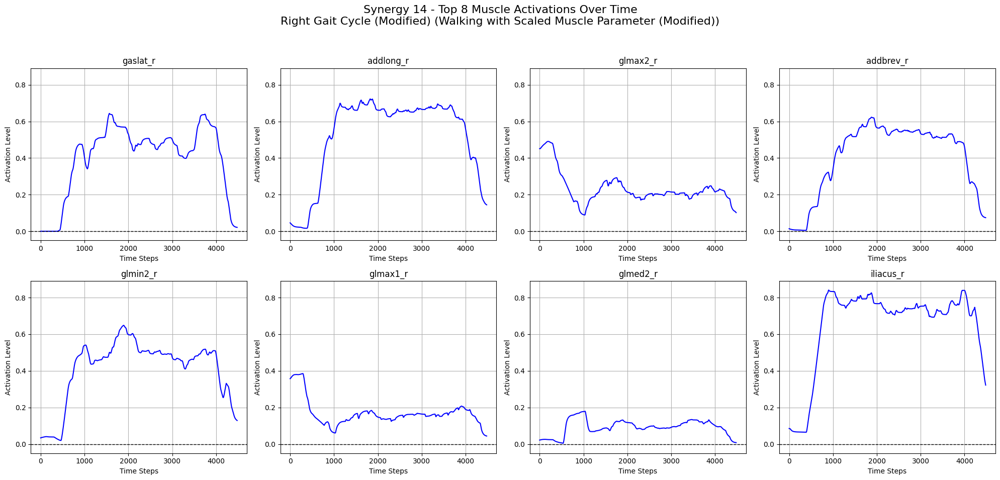

Synergy 15 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_15_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


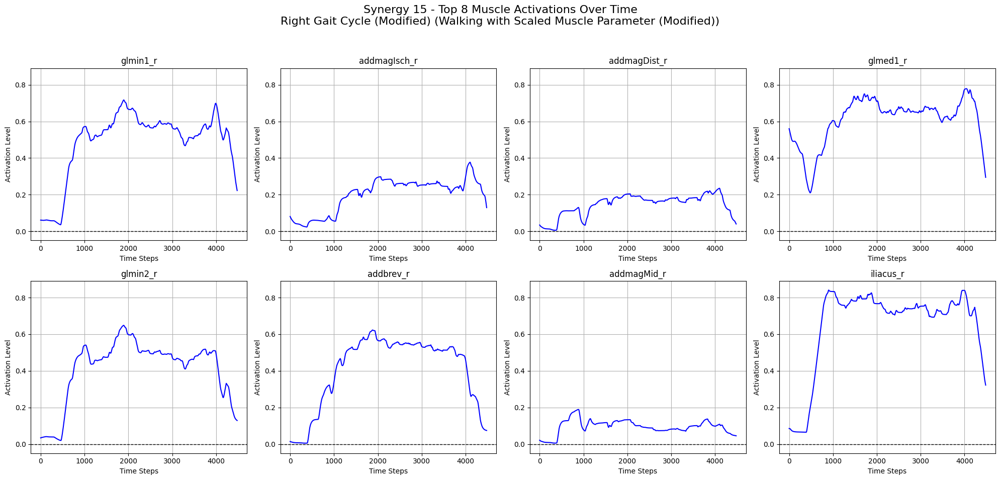

Synergy 16 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_16_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


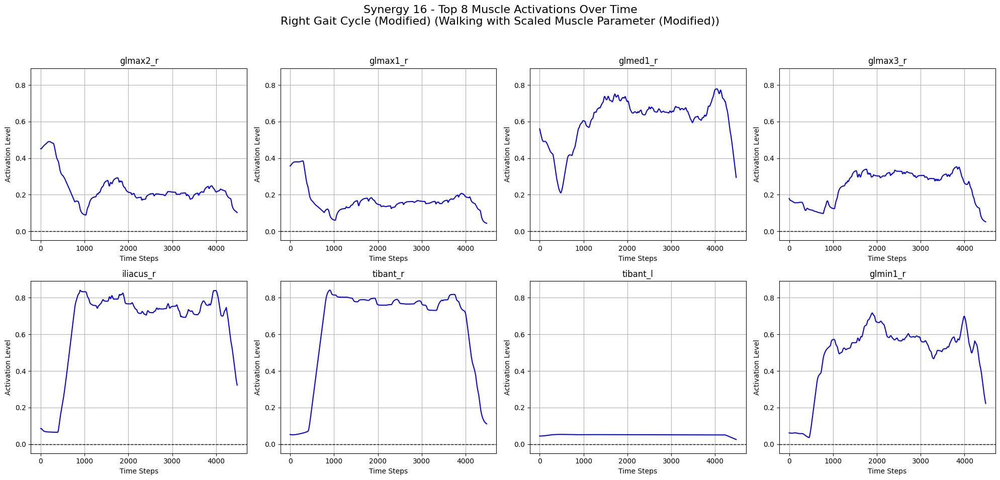

Synergy 17 top 8 muscle activations plot saved to outputs_scaled/modified/synergy_17_top_8_activations_Right_Gait_Cycle_(Modified)_Walking_with_Scaled_Muscle_Parameter_(Modified).png


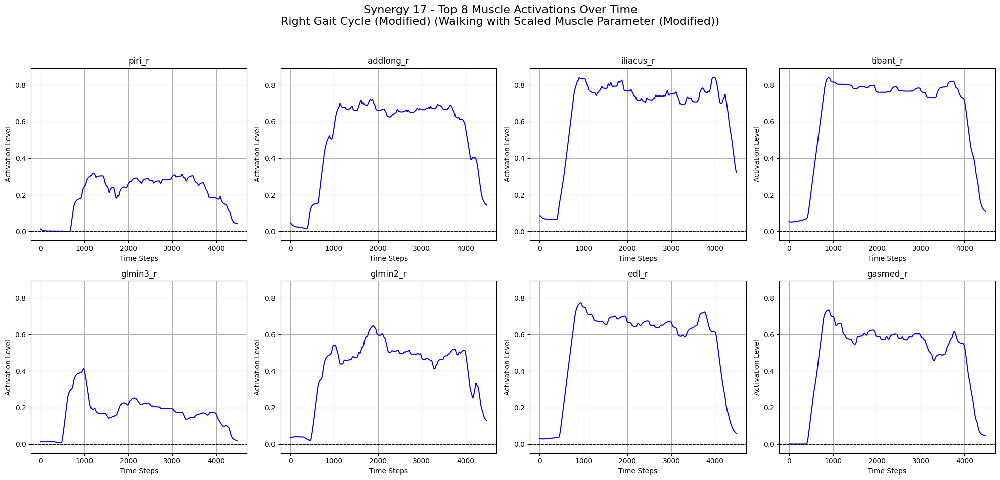

In [ ]:
# Perform synergy analysis before and after scaling the max_isometric_force of a muscle
synergies_before_after(
    mjid=mjid,
    muscle_name="psoas_r",
    parameter="max_isometric_force",
    scale_ratio=0.1,
    right_gait_cycle=right_gait_cycle,
    movement_description="Right Gait Cycle",
    task_description="Walking with Scaled Muscle Parameter",
    output_folder="outputs_scaled"
)